<h1 align="center">Taxi demand prediction in New York City</h1>


<img src='new_york.gif'>

In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

#Importing Libraries
# pip3 install graphviz
#pip3 install dask
#pip3 install toolz
#pip3 install cloudpickle
# https://www.youtube.com/watch?v=ieW3G7ZzRZ0
# https://github.com/dask/dask-tutorial
# please do go through this python notebook: https://github.com/dask/dask-tutorial/blob/master/07_dataframe.ipynb
import dask.dataframe as dd#similar to pandas

import pandas as pd#pandas to create small dataframes 

# pip3 install foliun
# if this doesnt work refere install_folium.JPG in drive
import folium #open street map

# unix time: https://www.unixtimestamp.com/
import datetime #Convert to unix time

import time #Convert to unix time

# if numpy is not installed already : pip3 install numpy
import numpy as np#Do aritmetic operations on arrays

# matplotlib: used to plot graphs
import matplotlib
# matplotlib.use('nbagg') : matplotlib uses this protocall which makes plots more user intractive like zoom in and zoom out
matplotlib.use('nbagg')
import matplotlib.pylab as plt
import seaborn as sns#Plots
from matplotlib import rcParams#Size of plots  

# this lib is used while we calculate the stight line distance between two (lat,lon) pairs in miles
import gpxpy.geo #Get the haversine distance

from sklearn.cluster import MiniBatchKMeans, KMeans#Clustering
import math
import pickle
import os

# download migwin: https://mingw-w64.org/doku.php/download/mingw-builds
# install it in your system and keep the path, migw_path ='installed path'
#mingw_path = 'C:\\Program Files\\mingw-w64\\x86_64-5.3.0-posix-seh-rt_v4-rev0\\mingw64\\bin'
#os.environ['PATH'] = mingw_path + ';' + os.environ['PATH']

# to install xgboost: pip3 install xgboost
# if it didnt happen check install_xgboost.JPG
import xgboost as xgb

# to install sklearn: pip install -U scikit-learn
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
import warnings
warnings.filterwarnings("ignore")

# Data Information

<p>
Ge the data from : http://www.nyc.gov/html/tlc/html/about/trip_record_data.shtml (2016 data)
The data used in the attached datasets were collected and provided to the NYC Taxi and Limousine Commission (TLC) 
</p>

## Information on taxis:

<h5> Yellow Taxi: Yellow Medallion Taxicabs</h5>
<p> These are the famous NYC yellow taxis that provide transportation exclusively through street-hails. The number of taxicabs is limited by a finite number of medallions issued by the TLC. You access this mode of transportation by standing in the street and hailing an available taxi with your hand. The pickups are not pre-arranged.</p>

<h5> For Hire Vehicles (FHVs) </h5>
<p> FHV transportation is accessed by a pre-arrangement with a dispatcher or limo company. These FHVs are not permitted to pick up passengers via street hails, as those rides are not considered pre-arranged. </p>

<h5> Green Taxi: Street Hail Livery (SHL) </h5>
<p>  The SHL program will allow livery vehicle owners to license and outfit their vehicles with green borough taxi branding, meters, credit card machines, and ultimately the right to accept street hails in addition to pre-arranged rides. </p>
<p> Credits: Quora</p>

<h5>Footnote:</h5>
In the given notebook we are considering only the yellow taxis for the time period between Jan - Mar 2015 & Jan - Mar 2016

### Objective this case study:

From a taxi driver point of view, the main objective of this case study is to predict the number of pickups or to maximize the number of pickups in a particular region in a future 10 minute interval. If I have 5 segmented regions in a map A,B,C,D,E and at a given time I am region C, I want to understand which of the other 4 regions will give me the most number of pickups. I will have to accurately predict which what will be the number of pickups in each region, so that I can move my taxi to that region. Let's see this with an example.

If a taxi driver knows in advance which regions will have more pickups at a given time interval, he can move his taxi to that region in order to maximize his pickups which in turn maximizes his revenue. In this case study we are building a time series forcasting model which predicts the number of pickups.

The end use for this case study will be taxi/cab drivers who would want to benefit from the advancements in Machine Learning.

We will break the New York City into certain regions based on certain conditions. We will also break the entire time span into a 10 min time interval. In this way, given a location information, it will be easier for the model to suggest a location to the taxi driver. 

IN terms of interpretability, it is not so much important. Because if we think about it carefully, we do not want to know why the model has predicted 10 pickups instead of 13, or 15 pickups instead of 12. Because it doesn't make total sense. We jus want to know the fact that there will be 10 pickups and that's it. In terms of latency, a few seconds is ok. As long as it has a test runtime of few seconds it is ok. It should not take a few minutes. Because, we don't want the model to predict in say 2 minutes time. In that way we are already losing 2 minutes from a 10 minute window. 

### Constraints: 

We will primarily stick to median absolute percentage error as our key performance indicator. For this problem we will consider relative error and not absolute error. Let's look at a simple example, suppose the predicted value of the number of pickups in a scenario is 55, whereas the actual value is 50. In an other case, suppose the predicted number of pickups is 5 and the actual number of pickup is 10. In both the cases, the absolute error is the same - that is 5. However, the relative error for case 1 is much lesser than in case 2. In case it is 10%. In case 2, it is 50%. Massive difference!

# Data Collection
We Have collected all yellow taxi trips data from jan-2015 to dec-2016(Will be using only 2016 data in this assignment and test it on 2018 data.)
<table>
<tr>
<th> file name </th>
<th> file name size</th>
<th> number of records </th>
<th> number of features </th>
</tr>
<tr>
<td> yellow_tripdata_2016-01 </td>
<td> 1. 59G </td>
<td> 10906858 </td>
<td> 19 </td>
</tr>

<tr>
<td> yellow_tripdata_2016-02 </td>
<td> 1. 66G </td>
<td> 11382049 </td>
<td> 19 </td>
</tr>
<tr>
<td> yellow_tripdata_2016-03 </td>
<td> 1. 78G </td>
<td> 12210952 </td>
<td> 19 </td>
</tr>
<tr>
<td> yellow_tripdata_2016-04 </td>
<td> 1. 74G </td>
<td> 11934338 </td>
<td> 19 </td>
</tr>

<tr>
<td> yellow_tripdata_2016-05 </td>
<td> 1. 73G </td>
<td> 11836853 </td>
<td> 19 </td>
</tr>

<tr>
<td> yellow_tripdata_2016-06 </td>
<td> 1. 62G </td>
<td> 11135470 </td>
<td> 19 </td>
</tr>

<tr>
<td> yellow_tripdata_2016-07 </td>
<td> 884Mb </td>
<td> 10294080 </td>
<td> 17 </td>
</tr>

<tr>
<td> yellow_tripdata_2016-08 </td>
<td> 854Mb </td>
<td> 9942263 </td>
<td> 17 </td>
</tr>

<tr>
<td> yellow_tripdata_2016-09 </td>
<td> 870Mb </td>
<td> 10116018 </td>
<td> 17 </td>
</tr>

<tr>
<td> yellow_tripdata_2016-10 </td>
<td> 933Mb </td>
<td> 10854626 </td>
<td> 17 </td>
</tr>
<tr>
<td> yellow_tripdata_2016-11 </td>
<td> 868Mb </td>
<td> 10102128 </td>
<td> 17 </td>
</tr>
<tr>
<td> yellow_tripdata_2016-12 </td>
<td> 897Mb </td>
<td> 10449408 </td>
<td> 17 </td>
</tr>
<tr>
<td> yellow_tripdata_2015-01 </td>
<td> 1.84Gb </td>
<td> 12748986 </td>
<td> 19 </td>
</tr>
<tr>
<td> yellow_tripdata_2015-02 </td>
<td> 1.81Gb </td>
<td> 12450521 </td>
<td> 19 </td>
</tr>
<tr>
<td> yellow_tripdata_2015-03 </td>
<td> 1.94Gb </td>
<td> 13351609 </td>
<td> 19 </td>
</tr>
<tr>
<td> yellow_tripdata_2015-04 </td>
<td> 1.90Gb </td>
<td> 13071789 </td>
<td> 19 </td>
</tr>
<tr>
<td> yellow_tripdata_2015-05 </td>
<td> 1.91Gb </td>
<td> 13158262 </td>
<td> 19 </td>
</tr>
<tr>
<td> yellow_tripdata_2015-06 </td>
<td> 1.79Gb </td>
<td> 12324935 </td>
<td> 19 </td>
</tr>
<tr>
<td> yellow_tripdata_2015-07 </td>
<td> 1.68Gb </td>
<td> 11562783 </td>
<td> 19 </td>
</tr>
<tr>
<td> yellow_tripdata_2015-08 </td>
<td> 1.62Gb </td>
<td> 11130304 </td>
<td> 19 </td>
</tr>
<tr>
<td> yellow_tripdata_2015-09 </td>
<td> 1.63Gb </td>
<td> 11225063 </td>
<td> 19 </td>
</tr>
<tr>
<td> yellow_tripdata_2015-10 </td>
<td> 1.79Gb </td>
<td> 12315488 </td>
<td> 19 </td>
</tr>
<tr>
<td> yellow_tripdata_2015-11 </td>
<td> 1.65Gb </td>
<td> 11312676 </td>
<td> 19 </td>
</tr>
<tr>
<td> yellow_tripdata_2015-12 </td>
<td> 1.67Gb </td>
<td> 11460573 </td>
<td> 19 </td>
</tr>
</table>

### Note: 
When we try to load a csv, pandas loads the entire csv into the RAM before we are able to use it. Dask dataframes does not do this. It loads the data block by block. A large csv file is represented as a block of files in the filesystem. Pandas loads all the block all at once to RAM. Dask loads only those file system which are needed right now. It will load the 4 blocks into RAM, after it has done processing the 4 blocks, it will remove them from memory and start processing the next 4 blocks in queue until the processing of all the blocks are completed. 

In [2]:
#Looking at the features
#Dask dataframe  : # https://github.com/dask/dask-tutorial/blob/master/07_dataframe.ipynb
month = dd.read_csv('yellow_tripdata_2015-01.csv')
print(month.columns)

Index(['VendorID', 'tpep_pickup_datetime', 'tpep_dropoff_datetime',
       'passenger_count', 'trip_distance', 'pickup_longitude',
       'pickup_latitude', 'RateCodeID', 'store_and_fwd_flag',
       'dropoff_longitude', 'dropoff_latitude', 'payment_type', 'fare_amount',
       'extra', 'mta_tax', 'tip_amount', 'tolls_amount',
       'improvement_surcharge', 'total_amount'],
      dtype='object')


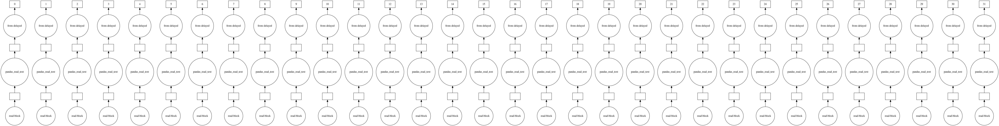

In [3]:
# However unlike Pandas, operations on dask.dataframes don't trigger immediate computation, 
# instead they add key-value pairs to an underlying Dask graph. Recall that in the diagram below, 
# circles are operations and rectangles are results.

# to see the visulaization you need to install graphviz
# pip3 install graphviz if this doesnt work please check the install_graphviz.jpg in the drive
month.visualize()

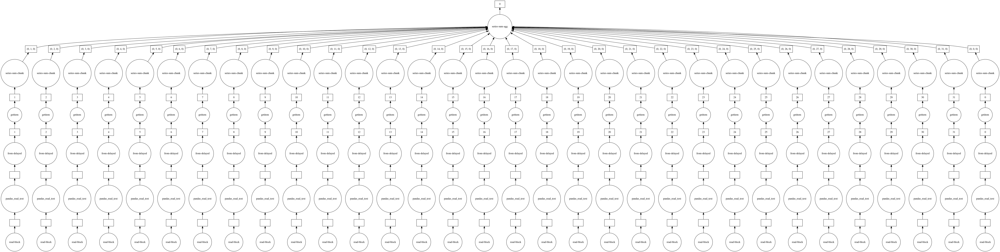

In [4]:
month.fare_amount.sum().visualize()

## Features in the dataset:
<table border="1">
	<tr>
		<th>Field Name</th>
		<th>Description</th>
	</tr>
	<tr>
		<td>VendorID</td>
		<td>
		A code indicating the TPEP provider that provided the record.
		<ol>
			<li>Creative Mobile Technologies</li>
			<li>VeriFone Inc.</li>
		</ol>
		</td>
	</tr>
	<tr>
		<td>tpep_pickup_datetime</td>
		<td>The date and time when the meter was engaged.</td>
	</tr>
	<tr>
		<td>tpep_dropoff_datetime</td>
		<td>The date and time when the meter was disengaged.</td>
	</tr>
	<tr>
		<td>Passenger_count</td>
		<td>The number of passengers in the vehicle. This is a driver-entered value.</td>
	</tr>
	<tr>
		<td>Trip_distance</td>
		<td>The elapsed trip distance in miles reported by the taximeter.</td>
	</tr>
	<tr>
		<td>Pickup_longitude</td>
		<td>Longitude where the meter was engaged.</td>
	</tr>
	<tr>
		<td>Pickup_latitude</td>
		<td>Latitude where the meter was engaged.</td>
	</tr>
	<tr>
		<td>RateCodeID</td>
		<td>The final rate code in effect at the end of the trip.
		<ol>
			<li> Standard rate </li>
			<li> JFK </li>
			<li> Newark </li>
			<li> Nassau or Westchester</li>
			<li> Negotiated fare </li>
			<li> Group ride</li>
		</ol>
		</td>
	</tr>
	<tr>
		<td>Store_and_fwd_flag</td>
		<td>This flag indicates whether the trip record was held in vehicle memory before sending to the vendor,<br\> aka “store and forward,” because the vehicle did not have a connection to the server.
		<br\>Y= store and forward trip
		<br\>N= not a store and forward trip
		</td>
	</tr>

	<tr>
		<td>Dropoff_longitude</td>
		<td>Longitude where the meter was disengaged.</td>
	</tr>
	<tr>
		<td>Dropoff_ latitude</td>
		<td>Latitude where the meter was disengaged.</td>
	</tr>
	<tr>
		<td>Payment_type</td>
		<td>A numeric code signifying how the passenger paid for the trip.
		<ol>
			<li> Credit card </li>
			<li> Cash </li>
			<li> No charge </li>
			<li> Dispute</li>
			<li> Unknown </li>
			<li> Voided trip</li>
		</ol>
		</td>
	</tr>
	<tr>
		<td>Fare_amount</td>
		<td>The time-and-distance fare calculated by the meter.</td>
	</tr>
	<tr>
		<td>Extra</td>
		<td>Miscellaneous extras and surcharges. Currently, this only includes. the $0.50 and $1 rush hour and overnight charges.</td>
	</tr>
	<tr>
		<td>MTA_tax</td>
		<td>0.50 MTA tax that is automatically triggered based on the metered rate in use.</td>
	</tr>
	<tr>
		<td>Improvement_surcharge</td>
		<td>0.30 improvement surcharge assessed trips at the flag drop. the improvement surcharge began being levied in 2015.</td>
	</tr>
	<tr>
		<td>Tip_amount</td>
		<td>Tip amount – This field is automatically populated for credit card tips.Cash tips are not included.</td>
	</tr>
	<tr>
		<td>Tolls_amount</td>
		<td>Total amount of all tolls paid in trip.</td>
	</tr>
	<tr>
		<td>Total_amount</td>
		<td>The total amount charged to passengers. Does not include cash tips.</td>
	</tr>
</table>

# ML Problem Formulation
<p><b> Time-series forecasting and Regression</b></p>

Given a region (latitude and longitudes) and a 10 minute interval, we have to predict the number of pickups in that region.  The big question is how do we break up New York City into regions? If we see the graph of number of pickups which happened during the entire day, we will be able to see some repeating patterns in them. Our task is to leverage the repeating patterns in order to extract more information from the data. Our raw data will be latitude and longitude, by which we will use some groupby operation to segregate the data based on 10min time bins. Suppose I have data till time t, I need to predict the outcome at time t+1. 

# Performance metrics
1. Mean Absolute percentage error.
2. Mean Squared error.

MAPE basically gives us the relative error, which makes more sense than using absolute error. This is important when we try to assess a models performance. MAPE is used to quantify our predictions. It's just like having a confidence interval.

## Data Cleaning

In this section we will be doing univariate analysis and removing outlier/illegitimate values which may be caused due to some error. We need to feed our model with clean data if we want them to train well. 

In [5]:
#table below shows few datapoints along with all our features
month.head(5)

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,RateCodeID,store_and_fwd_flag,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount
0,2,2015-01-15 19:05:39,2015-01-15 19:23:42,1,1.59,-73.993896,40.750111,1,N,-73.974785,40.750618,1,12.0,1.0,0.5,3.25,0.0,0.3,17.05
1,1,2015-01-10 20:33:38,2015-01-10 20:53:28,1,3.30,-74.001648,40.724243,1,N,-73.994415,40.759109,1,14.5,0.5,0.5,2.00,0.0,0.3,17.80
2,1,2015-01-10 20:33:38,2015-01-10 20:43:41,1,1.80,-73.963341,40.802788,1,N,-73.951820,40.824413,2,9.5,0.5,0.5,0.00,0.0,0.3,10.80
3,1,2015-01-10 20:33:39,2015-01-10 20:35:31,1,0.50,-74.009087,40.713818,1,N,-74.004326,40.719986,2,3.5,0.5,0.5,0.00,0.0,0.3,4.80
4,1,2015-01-10 20:33:39,2015-01-10 20:52:58,1,3.00,-73.971176,40.762428,1,N,-74.004181,40.742653,2,15.0,0.5,0.5,0.00,0.0,0.3,16.30


### 1. Pickup Latitude and Pickup Longitude

It is inferred from the source https://www.flickr.com/places/info/2459115 that New York is bounded by the location cordinates(lat,long) - (40.5774, -74.15) & (40.9176,-73.7004) so hence any cordinates not within these cordinates are not considered by us as we are only concerned with pickups which originate within New York. We will remove all such points from the data which have it's pickup of drops outside the city limits!

### New york bounding box:

1. min_lat <- 40.5774
2. max_lat <- 40.9176
3. min_long <- -74.15
4. max_long <- -73.7004

In [6]:
# Plotting pickup cordinates which are outside the bounding box of New-York 
# we will collect all the points outside the bounding box of newyork city to outlier_locations
outlier_locations = month[((month.pickup_longitude <= -74.15) | (month.pickup_latitude <= 40.5774)| (month.pickup_longitude >= -73.7004) | (month.pickup_latitude >= 40.9176))]

# creating a map with the a base location
# read more about the folium here: http://folium.readthedocs.io/en/latest/quickstart.html

map_osm = folium.Map(location=[40.734695, -73.990372], tiles='OpenStreetMap')

# we will spot only first 10000 outliers on the map, plotting all the outliers will take more time
sample_locations = outlier_locations.head(10000)
for i,j in sample_locations.iterrows():
    if int(j['pickup_latitude']) != 0:
        folium.Marker(list((j['pickup_latitude'],j['pickup_longitude']))).add_to(map_osm)
map_osm

<b>Observation:-</b> As you can see above that there are some points just outside the boundary but there are a few that are in either South america, Mexico or Canada

### 2. Dropoff Latitude & Dropoff Longitude

It is inferred from the source https://www.flickr.com/places/info/2459115 that New York is bounded by the location cordinates(lat,long) - (40.5774, -74.15) & (40.9176,-73.7004) so hence any cordinates not within these cordinates are not considered by us as we are only concerned with dropoffs which are within New York.

In [7]:
# Plotting dropoff cordinates which are outside the bounding box of New-York 
# we will collect all the points outside the bounding box of newyork city to outlier_locations
outlier_locations = month[((month.dropoff_longitude <= -74.15) | (month.dropoff_latitude <= 40.5774)| (month.dropoff_longitude >= -73.7004) | (month.dropoff_latitude >= 40.9176))]

# creating a map with the a base location
# read more about the folium here: http://folium.readthedocs.io/en/latest/quickstart.html

map_osm = folium.Map(location=[40.734695, -73.990372], tiles='Stamen Toner')

# we will spot only first 100 outliers on the map, plotting all the outliers will take more time
sample_locations = outlier_locations.head(10000)
for i,j in sample_locations.iterrows():
    if int(j['pickup_latitude']) != 0:
        folium.Marker(list((j['dropoff_latitude'],j['dropoff_longitude']))).add_to(map_osm)
map_osm

<b>Observation:-</b> The observations here are similar to those obtained while analysing pickup latitude and longitude

### 3. Trip Durations:

<p style="font-size:18px">According to NYC Taxi &amp; Limousine Commision Regulations <b style= "color:blue">the maximum allowed trip duration in a 24 hour interval is 12 hours. </b> </p>

So we will remove all such points where the trip duration at a stretch exceeds 720 minutes. We will use blox plots to check trhe 25th, 50th and 75th percentile values and determine the outliers.

In [6]:
#The timestamps are converted to unix so as to get duration(trip-time) & speed also pickup-times in unix are used while binning 

# in out data we have time in the formate "YYYY-MM-DD HH:MM:SS" we convert thiss sting to python time format and then into unix time stamp
# https://stackoverflow.com/a/27914405
def convert_to_unix(s):
    return time.mktime(datetime.datetime.strptime(s, "%Y-%m-%d %H:%M:%S").timetuple())

# Below function returns a data frame which contains the columns
# 1.'passenger_count' : self explanatory
# 2.'trip_distance' : self explanatory
# 3.'pickup_longitude' : self explanatory
# 4.'pickup_latitude' : self explanatory
# 5.'dropoff_longitude' : self explanatory
# 6.'dropoff_latitude' : self explanatory
# 7.'total_amount' : total fair that was paid
# 8.'trip_times' : duration of each trip
# 9.'pickup_times : pickup time converted into unix time 
# 10.'Speed' : velocity of each trip
def return_with_trip_times(month):
    duration = month[['tpep_pickup_datetime','tpep_dropoff_datetime']].compute()
    #pickups and dropoffs to unix time
    pickup_time = [convert_to_unix(x) for x in duration['tpep_pickup_datetime'].values]
    drop_time = [convert_to_unix(x) for x in duration['tpep_dropoff_datetime'].values]
    #calculate duration of trips
    durations = (np.array(drop_time) - np.array(pickup_time))/float(60)

    #append durations of trips and speed in miles/hr to a new dataframe
    new_frame = month[['passenger_count','trip_distance','pickup_longitude','pickup_latitude','dropoff_longitude','dropoff_latitude','total_amount']].compute()
    
    new_frame['trip_times'] = durations
    new_frame['pickup_times'] = pickup_time
    new_frame['Speed'] = 60*(new_frame['trip_distance']/new_frame['trip_times'])
    
    return new_frame

# print(frame_with_durations.head())
#  passenger_count	trip_distance	pickup_longitude	pickup_latitude	dropoff_longitude	dropoff_latitude	total_amount	trip_times	pickup_times	Speed
#   1                  1.59	      -73.993896        	40.750111    	-73.974785      	40.750618           	17.05   	 18.050000	1.421329e+09	5.285319
#   1               	3.30    	-74.001648      	40.724243   	-73.994415      	40.759109           	17.80   	19.833333	1.420902e+09	9.983193
#   1               	1.80     	-73.963341      	40.802788     	-73.951820      	40.824413           	10.80   	10.050000	1.420902e+09	10.746269
#   1               	0.50    	-74.009087      	40.713818    	-74.004326       	40.719986           	4.80    	1.866667	1.420902e+09	16.071429
#   1               	3.00    	-73.971176      	40.762428    	-74.004181      	40.742653           	16.30   	19.316667	1.420902e+09	9.318378
frame_with_durations = return_with_trip_times(month)
frame_with_durations.head()

,passenger_count,trip_distance,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,total_amount,trip_times,pickup_times,Speed
0,1,1.59,-73.993896,40.750111,-73.974785,40.750618,17.05,18.050000,1.421329e+09,5.285319
1,1,3.30,-74.001648,40.724243,-73.994415,40.759109,17.80,19.833333,1.420902e+09,9.983193
2,1,1.80,-73.963341,40.802788,-73.951820,40.824413,10.80,10.050000,1.420902e+09,10.746269
3,1,0.50,-74.009087,40.713818,-74.004326,40.719986,4.80,1.866667,1.420902e+09,16.071429
4,1,3.00,-73.971176,40.762428,-74.004181,40.742653,16.30,19.316667,1.420902e+09,9.318378


<IPython.core.display.Javascript object>


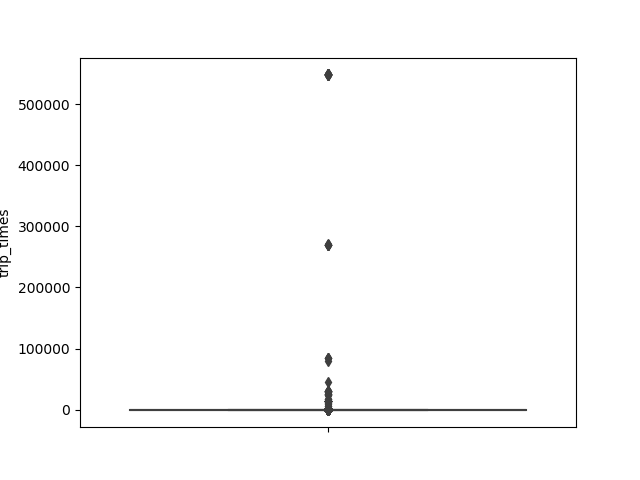

In [7]:
#The skewed box plot shows us the presence of outliers 
sns.boxplot(y="trip_times", data=frame_with_durations)
plt.show()

#### Observation: 

The 25th, 50th and 75th percentile values all lies in a very small region. However, there are some data points where the trip time is massive like 500K minutes. That's not possible. Going by the law, we will remove all those points where the time is more than 720 minutes.

In [8]:
#Calculating 0-100th percentile to find a the correct percentile value for removal of outliers
for i in range(0,100,10):
    var =frame_with_durations["trip_times"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print ("100 percentile value is ",var[-1])

0 percentile value is -1211.0166666666667
10 percentile value is 3.8333333333333335
20 percentile value is 5.383333333333334
30 percentile value is 6.816666666666666
40 percentile value is 8.3
50 percentile value is 9.95
60 percentile value is 11.866666666666667
70 percentile value is 14.283333333333333
80 percentile value is 17.633333333333333
90 percentile value is 23.45
100 percentile value is  548555.6333333333


In [9]:
#Looking further from the 99th percecntile
for i in range(90,100):
    var =frame_with_durations["trip_times"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print ("100 percentile value is ",var[-1])

90 percentile value is 23.45
91 percentile value is 24.35
92 percentile value is 25.383333333333333
93 percentile value is 26.55
94 percentile value is 27.933333333333334
95 percentile value is 29.583333333333332
96 percentile value is 31.683333333333334
97 percentile value is 34.46666666666667
98 percentile value is 38.71666666666667
99 percentile value is 46.75
100 percentile value is  548555.6333333333


In [10]:
#Removing data based on our analysis and TLC regulations
frame_with_durations_modified=frame_with_durations[(frame_with_durations.trip_times>1) & (frame_with_durations.trip_times<720)]

<IPython.core.display.Javascript object>


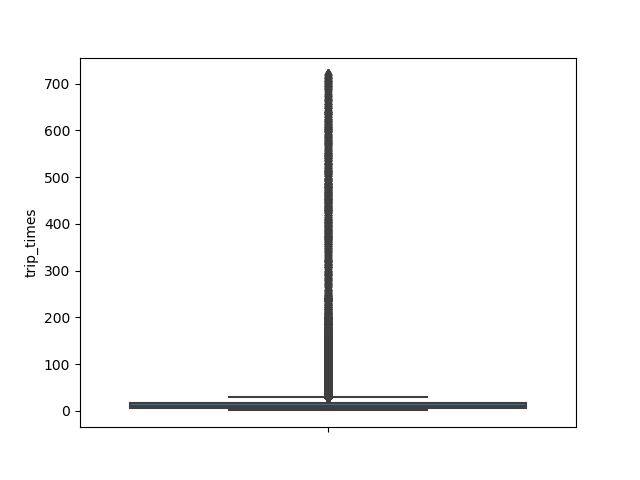

In [11]:
#Box-plot after removal of outliers
sns.boxplot(y="trip_times", data =frame_with_durations_modified)
plt.show()

<IPython.core.display.Javascript object>


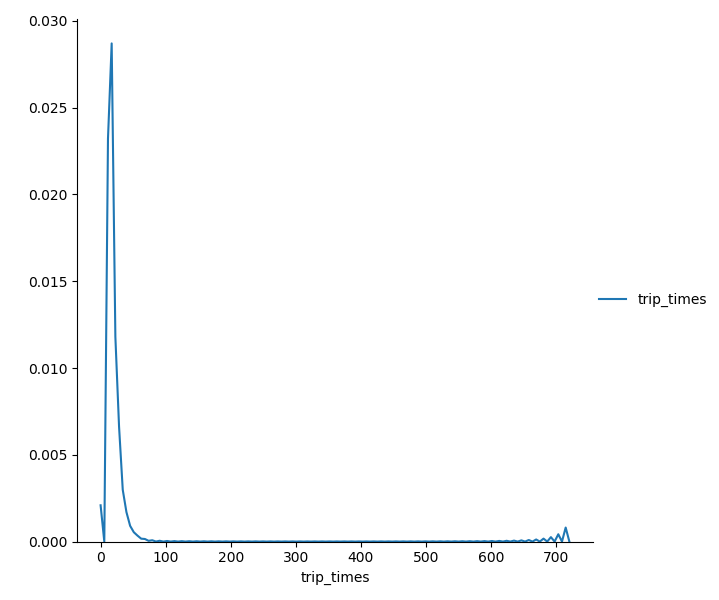

In [12]:
#PDF of trip-times after removing the outliers
sns.FacetGrid(frame_with_durations_modified,size=6).map(sns.kdeplot,"trip_times").add_legend();
plt.show();

Here the idea is to plot the distribution of the variable and also the distribution of the log of all the values of the features. This way, if we see the resulting distribution is a Gaussian distribution we will conclude that the feature is a log normal dsitributed one and we can take the log of this feature as our important feature. We will further draw a Q-Q plot to be very sure about our assumptions.

In [13]:
#Converting the values to log-values to check for log-normal distribution
import math
frame_with_durations_modified['log_times']=[math.log(i) for i in frame_with_durations_modified['trip_times'].values]

<IPython.core.display.Javascript object>


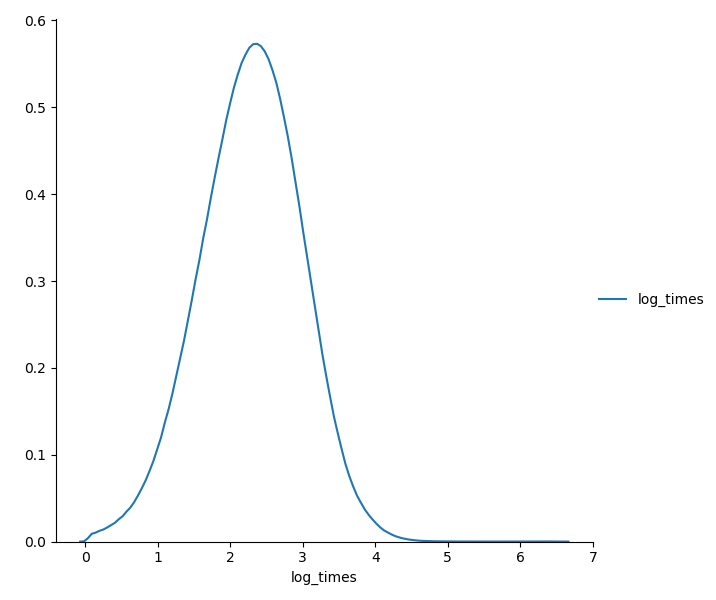

In [14]:
#PDF of log-values
sns.FacetGrid(frame_with_durations_modified,size=6).map(sns.kdeplot,"log_times").add_legend();
plt.show();

<IPython.core.display.Javascript object>


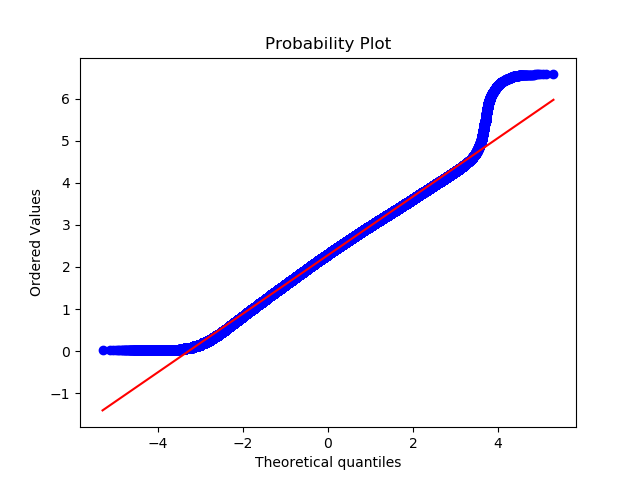

In [15]:
#Q-Q plot for checking if trip-times is log-normal
import scipy
scipy.stats.probplot(frame_with_durations_modified['log_times'].values, plot=plt)
plt.show()

The distribution of the log of trip duration is not gaussian which means trip duration is not log normal. If it was the Q-Q plot would have given a straight line.  

### 4. Speed

<IPython.core.display.Javascript object>


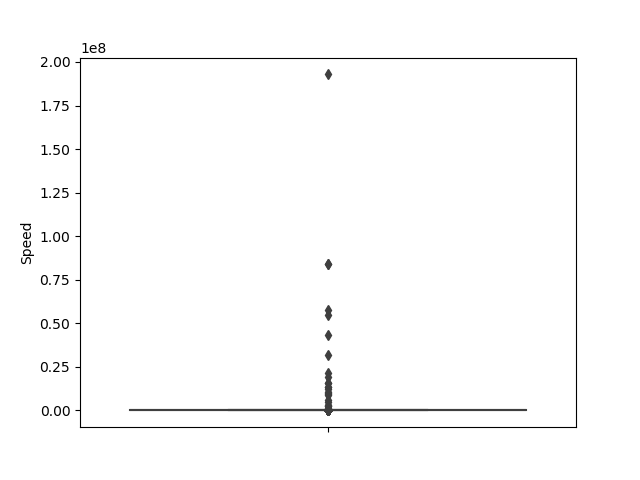

In [16]:
#Check for any outliers in the data after trip duration outliers removed. box-plot for speeds with outliers
frame_with_durations_modified['Speed'] = 60*(frame_with_durations_modified['trip_distance']/frame_with_durations_modified['trip_times'])
sns.boxplot(y="Speed", data =frame_with_durations_modified)
plt.show();

In [17]:
#Calculating speed values at each percntile 0,10,20,30,40,50,60,70,80,90,100 
for i in range(0,100,10):
    var =frame_with_durations_modified["Speed"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print("100 percentile value is ",var[-1])

0 percentile value is 0.0
10 percentile value is 6.409495548961425
20 percentile value is 7.80952380952381
30 percentile value is 8.929133858267717
40 percentile value is 9.98019801980198
50 percentile value is 11.06865671641791
60 percentile value is 12.286689419795222
70 percentile value is 13.796407185628745
80 percentile value is 15.963224893917962
90 percentile value is 20.186915887850468
100 percentile value is  192857142.85714284


In [18]:
#Calculating speed values at each percntile 90,91,92,93,94,95,96,97,98,99,100
for i in range(90,100):
    var =frame_with_durations_modified["Speed"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print("100 percentile value is ",var[-1])

90 percentile value is 20.186915887850468
91 percentile value is 20.91645569620253
92 percentile value is 21.752988047808763
93 percentile value is 22.721893491124263
94 percentile value is 23.844155844155843
95 percentile value is 25.182552504038775
96 percentile value is 26.80851063829787
97 percentile value is 28.84304932735426
98 percentile value is 31.591128254580514
99 percentile value is 35.7513566847558
100 percentile value is  192857142.85714284


In [19]:
#Calculating speed values at each percntile 99.0,99.1,99.2,99.3,99.4,99.5,99.6,99.7,99.8,99.9,100
for i in np.arange(0.0, 1.0, 0.1):
    var =frame_with_durations_modified["Speed"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(99+i,var[int(len(var)*(float(99+i)/100))]))
print("100 percentile value is ",var[-1])

99.0 percentile value is 35.7513566847558
99.1 percentile value is 36.31084727468969
99.2 percentile value is 36.91470054446461
99.3 percentile value is 37.588235294117645
99.4 percentile value is 38.33035714285714
99.5 percentile value is 39.17580340264651
99.6 percentile value is 40.15384615384615
99.7 percentile value is 41.338301043219076
99.8 percentile value is 42.86631016042781
99.9 percentile value is 45.3107822410148
100 percentile value is  192857142.85714284


In [20]:
#removing further outliers based on the 99.9th percentile value
frame_with_durations_modified=frame_with_durations[(frame_with_durations.Speed>0) & (frame_with_durations.Speed<45.31)]

In [21]:
#avg.speed of cabs in New-York
sum(frame_with_durations_modified["Speed"]) / float(len(frame_with_durations_modified["Speed"]))

12.450173996027528

<b style='font-size:16px'>The avg speed in Newyork speed is 12.45miles/hr, so a cab driver can travel <font color='blue'> 2 miles per 10min on avg.</font> </b>

### 4. Trip Distance

<IPython.core.display.Javascript object>


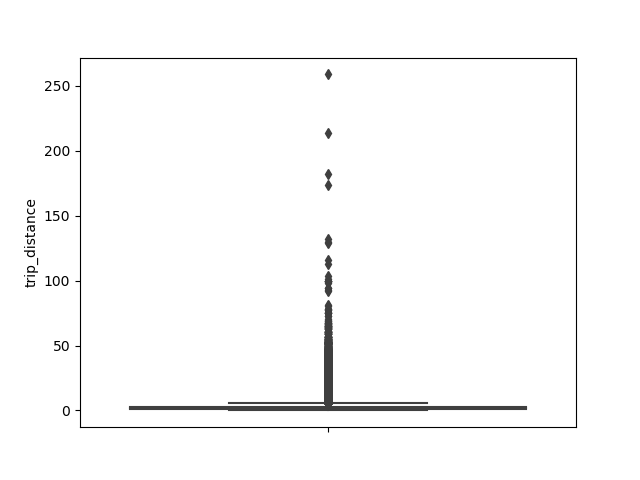

In [22]:
#Till now we have removed the outliers based on trip durations and cab speeds. lets see if there are any outliers in trip distances
#box-plot showing outliers in trip-distance values
sns.boxplot(y="trip_distance", data =frame_with_durations_modified)
plt.show()

In [23]:
#Calculating trip distance values at each percntile 0,10,20,30,40,50,60,70,80,90,100 
for i in range(0,100,10):
    var =frame_with_durations_modified["trip_distance"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print("100 percentile value is ",var[-1])

0 percentile value is 0.01
10 percentile value is 0.66
20 percentile value is 0.9
30 percentile value is 1.1
40 percentile value is 1.39
50 percentile value is 1.69
60 percentile value is 2.07
70 percentile value is 2.6
80 percentile value is 3.6
90 percentile value is 5.97
100 percentile value is  258.9


In [24]:
#Calculating trip distance values at each percntile 90,91,92,93,94,95,96,97,98,99,100
for i in range(90,100):
    var =frame_with_durations_modified["trip_distance"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print("100 percentile value is ",var[-1])

90 percentile value is 5.97
91 percentile value is 6.45
92 percentile value is 7.07
93 percentile value is 7.85
94 percentile value is 8.72
95 percentile value is 9.6
96 percentile value is 10.6
97 percentile value is 12.1
98 percentile value is 16.03
99 percentile value is 18.17
100 percentile value is  258.9


In [25]:
#calculating trip distance values at each percntile 99.0,99.1,99.2,99.3,99.4,99.5,99.6,99.7,99.8,99.9,100
for i in np.arange(0.0, 1.0, 0.1):
    var =frame_with_durations_modified["trip_distance"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(99+i,var[int(len(var)*(float(99+i)/100))]))
print("100 percentile value is ",var[-1])

99.0 percentile value is 18.17
99.1 percentile value is 18.37
99.2 percentile value is 18.6
99.3 percentile value is 18.83
99.4 percentile value is 19.13
99.5 percentile value is 19.5
99.6 percentile value is 19.96
99.7 percentile value is 20.5
99.8 percentile value is 21.22
99.9 percentile value is 22.57
100 percentile value is  258.9


In [26]:
#removing further outliers based on the 99.9th percentile value
frame_with_durations_modified=frame_with_durations[(frame_with_durations.trip_distance>0) & (frame_with_durations.trip_distance<24)]

<IPython.core.display.Javascript object>


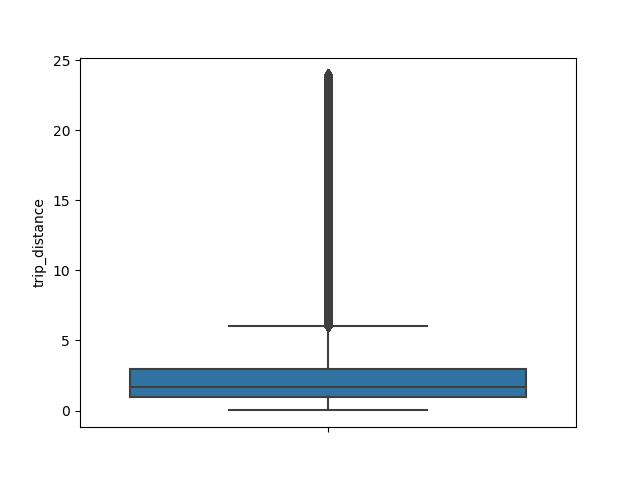

In [27]:
#Box-plot of trip distance after removal of outliers
sns.boxplot(y="trip_distance", data = frame_with_durations_modified)
plt.show();

### 5. Total Fare

<IPython.core.display.Javascript object>


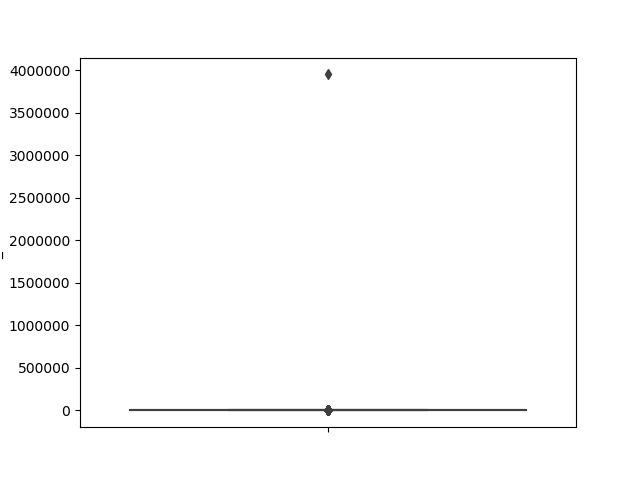

In [28]:
#Till now we have removed the outliers based on trip durations, cab speeds, and trip distances. lets see if there are any outliers in based on the total_amount
#Box-plot showing outliers in fare
sns.boxplot(y="total_amount", data =frame_with_durations_modified)
plt.show();

In [29]:
#Calculating total fare amount values at each percntile 0,10,20,30,40,50,60,70,80,90,100 
for i in range(0,100,10):
    var = frame_with_durations_modified["total_amount"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print("100 percentile value is ",var[-1])

0 percentile value is -242.55
10 percentile value is 6.3
20 percentile value is 7.8
30 percentile value is 8.8
40 percentile value is 9.8
50 percentile value is 11.16
60 percentile value is 12.8
70 percentile value is 14.8
80 percentile value is 18.3
90 percentile value is 25.8
100 percentile value is  3950611.6


In [30]:
#calculating total fare amount values at each percntile 90,91,92,93,94,95,96,97,98,99,100
for i in range(90,100):
    var = frame_with_durations_modified["total_amount"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print("100 percentile value is ",var[-1])

90 percentile value is 25.8
91 percentile value is 27.3
92 percentile value is 29.3
93 percentile value is 31.8
94 percentile value is 35.0
95 percentile value is 38.6
96 percentile value is 42.63
97 percentile value is 48.26
98 percentile value is 58.13
99 percentile value is 66.13
100 percentile value is  3950611.6


In [31]:
#Calculating total fare amount values at each percntile 99.0,99.1,99.2,99.3,99.4,99.5,99.6,99.7,99.8,99.9,100
for i in np.arange(0.0, 1.0, 0.1):
    var = frame_with_durations_modified["total_amount"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(99+i,var[int(len(var)*(float(99+i)/100))]))
print("100 percentile value is ",var[-1])

99.0 percentile value is 66.13
99.1 percentile value is 68.13
99.2 percentile value is 69.6
99.3 percentile value is 69.6
99.4 percentile value is 69.73
99.5 percentile value is 69.75
99.6 percentile value is 70.0
99.7 percentile value is 72.63
99.8 percentile value is 75.53
99.9 percentile value is 89.05
100 percentile value is  3950611.6


<b>Observation:-</b> As even the 99.9th percentile value doesnt look like an outlier,as there is not much difference between the 99.8th percentile and 99.9th percentile, we move on to do graphical analyis

<IPython.core.display.Javascript object>


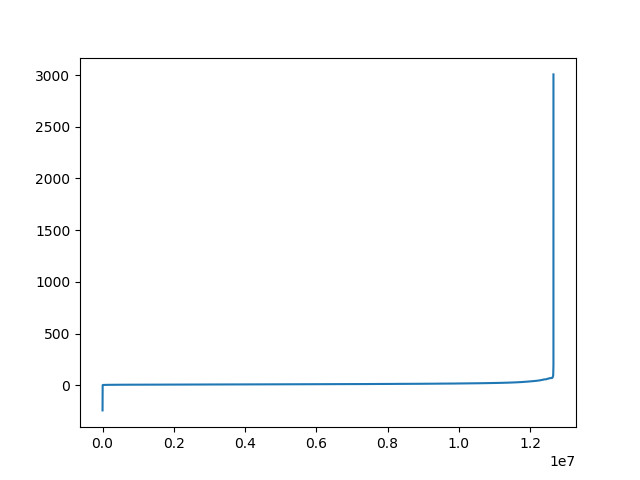

In [32]:
#Below plot shows us the fare values(sorted) to find a sharp increase to remove those values as outliers. Plot the fare amount excluding last two values in sorted data
plt.plot(var[:-2])
plt.show()

<IPython.core.display.Javascript object>


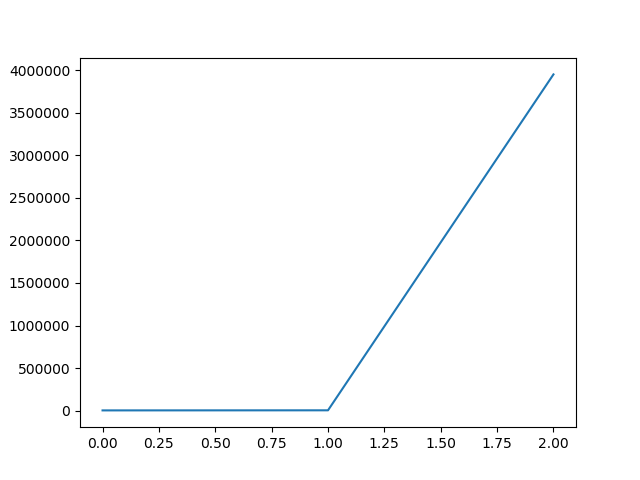

In [33]:
#A very sharp increase in fare values can be seen. Plotting last three total fare values, and we can observe there is share increase in the values
plt.plot(var[-3:])
plt.show()

<IPython.core.display.Javascript object>


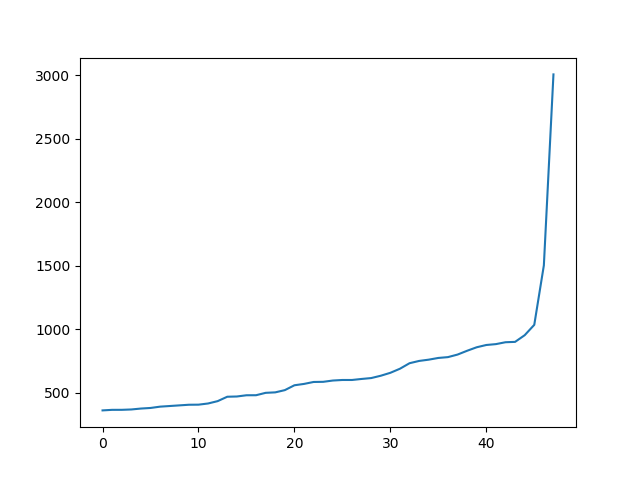

In [34]:
#now looking at values not including the last two points we again find a drastic increase at around 1000 fare value
# we plot last 50 values excluding last two values
plt.plot(var[-50:-2])
plt.show()

<IPython.core.display.Javascript object>


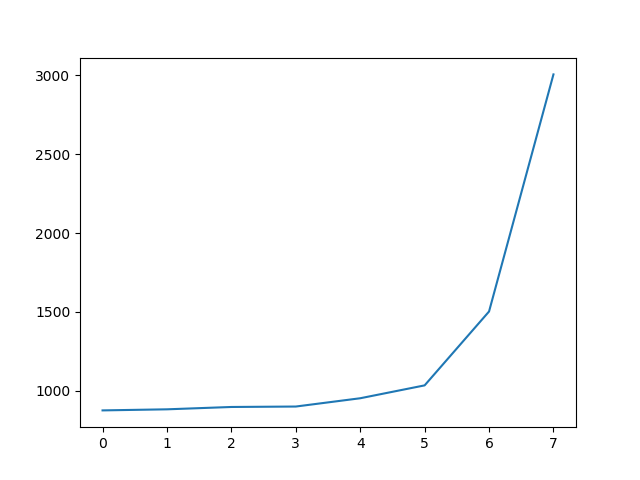

In [35]:
#now looking at values not including the last two points we again find a drastic increase at around 1000 fare value
# we plot last 10 values excluding last two values
plt.plot(var[-10:-2])
plt.show()

By using the wlbow method we will chose our maximum fare to be 1000$

## Remove all outliers/erronous points.

In [36]:
#removing all outliers based on our univariate analysis above
def remove_outliers(new_frame):

    
    a = new_frame.shape[0]
    print ("Number of pickup records = ",a)
    temp_frame = new_frame[((new_frame.dropoff_longitude >= -74.15) & (new_frame.dropoff_longitude <= -73.7004) &\
                       (new_frame.dropoff_latitude >= 40.5774) & (new_frame.dropoff_latitude <= 40.9176)) & \
                       ((new_frame.pickup_longitude >= -74.15) & (new_frame.pickup_latitude >= 40.5774)& \
                       (new_frame.pickup_longitude <= -73.7004) & (new_frame.pickup_latitude <= 40.9176))]
    b = temp_frame.shape[0]
    print ("Number of outlier coordinates lying outside NY boundaries:",(a-b))

    
    temp_frame = new_frame[(new_frame.trip_times > 0) & (new_frame.trip_times < 720)]
    c = temp_frame.shape[0]
    print ("Number of outliers from trip times analysis:",(a-c))
    
    
    temp_frame = new_frame[(new_frame.trip_distance > 0) & (new_frame.trip_distance < 23)]
    d = temp_frame.shape[0]
    print ("Number of outliers from trip distance analysis:",(a-d))
    
    temp_frame = new_frame[(new_frame.Speed <= 65) & (new_frame.Speed >= 0)]
    e = temp_frame.shape[0]
    print ("Number of outliers from speed analysis:",(a-e))
    
    temp_frame = new_frame[(new_frame.total_amount <1000) & (new_frame.total_amount >0)]
    f = temp_frame.shape[0]
    print ("Number of outliers from fare analysis:",(a-f))
    
    
    new_frame = new_frame[((new_frame.dropoff_longitude >= -74.15) & (new_frame.dropoff_longitude <= -73.7004) &\
                       (new_frame.dropoff_latitude >= 40.5774) & (new_frame.dropoff_latitude <= 40.9176)) & \
                       ((new_frame.pickup_longitude >= -74.15) & (new_frame.pickup_latitude >= 40.5774)& \
                       (new_frame.pickup_longitude <= -73.7004) & (new_frame.pickup_latitude <= 40.9176))]
    
    new_frame = new_frame[(new_frame.trip_times > 0) & (new_frame.trip_times < 720)]
    new_frame = new_frame[(new_frame.trip_distance > 0) & (new_frame.trip_distance < 23)]
    new_frame = new_frame[(new_frame.Speed < 45.31) & (new_frame.Speed > 0)]
    new_frame = new_frame[(new_frame.total_amount <1000) & (new_frame.total_amount >0)]
    
    print ("Total outliers removed",a - new_frame.shape[0])
    print ("---")
    return new_frame

In [37]:
print ("Removing outliers in the month of Jan-2015")
print ("----")
frame_with_durations_outliers_removed = remove_outliers(frame_with_durations)
print("Fraction of data points that remain after removing outliers", float(len(frame_with_durations_outliers_removed))/len(frame_with_durations))

Removing outliers in the month of Jan-2015
----
Number of pickup records =  12748986
Number of outlier coordinates lying outside NY boundaries: 293919
Number of outliers from trip times analysis: 23889
Number of outliers from trip distance analysis: 92597
Number of outliers from speed analysis: 24473
Number of outliers from fare analysis: 5275
Total outliers removed 377910
---
Fraction of data points that remain after removing outliers 0.9703576425607495


In [38]:
frame_with_durations_outliers_removed=pd.read_csv("frame_with_durations_outliers_removed.csv")
frame_with_durations_outliers_removed.head()

,Unnamed: 0,passenger_count,trip_distance,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,total_amount,trip_times,pickup_times,Speed
0,0,1,1.59,-73.993896,40.750111,-73.974785,40.750618,17.05,18.050000,1.421329e+09,5.285319
1,1,1,3.30,-74.001648,40.724243,-73.994415,40.759109,17.80,19.833333,1.420902e+09,9.983193
2,2,1,1.80,-73.963341,40.802788,-73.951820,40.824413,10.80,10.050000,1.420902e+09,10.746269
3,3,1,0.50,-74.009087,40.713818,-74.004326,40.719986,4.80,1.866667,1.420902e+09,16.071429
4,4,1,3.00,-73.971176,40.762428,-74.004181,40.742653,16.30,19.316667,1.420902e+09,9.318378


# Data-preperation
## Clustering/Segmentation

1. Here the task is to break NYC into regions, i.e. break down or cluster NYC based on groups of latitudes and longitudes. 
2. Once we have the clusters ready, we will break the time data into bins of 10 minute intervals. For each region and each 10 minute bin, we have to estimate the number of pickups. 
3. We will use k means to cluster the city map into regions based on pickup densities. We will use latitudes and longitude data for this purpose and build the clusters in such a way that the minimum inter cluster distance has to be approximately 0.5 mile and the maximum intercluster distance will be 2 mile. Because a car can travel apprix 2 miles in 10 minutes. 
4. K means always tends to create clusters of equal size. Here size does not represent the physical dimensions by regions. Also, if a cluster is more dense it means there are more pickups in the region and of the cluster is less dense or widely spread, it means that the number if pickups in the region/cluster is very less. (We will apply k means on latitude and longitude vs number of pickups). The k means algorithm breaks NYC on the basis of the numebr of pickups. 

Lastly while breaking NYC into clusters we need to keep in mind that we need to find a trade off such that the centroids are typically 2 miles away at large and 0.5 miles away at minimum. 

In [39]:
#Trying different cluster sizes to choose the right K in K-means
coords = frame_with_durations_outliers_removed[['pickup_latitude', 'pickup_longitude']].values
neighbours=[]

"""
Haversine formula:

dlon = lon2 - lon1
dlat = lat2 - lat1
a = (sin(dlat/2))^2 + cos(lat1) * cos(lat2) * (sin(dlon/2))^2
c = 2 * atan2( sqrt(a), sqrt(1-a) )
d = R * c (where R is the radius of the Earth)"""

#We are breaking NYC into regions or clusters based on latitudes and longitudes. The clusters should be at a minimum distance of half a mile and a maximum distance of 2mile. (We know that
#one an average day, a typical car travels 2 miles in 10 minutes.)
def find_min_distance(cluster_centers, cluster_len):
    nice_points = 0
    wrong_points = 0
    less2 = []
    more2 = []
    min_dist=1000
    for i in range(0, cluster_len):
        nice_points = 0
        wrong_points = 0
        for j in range(0, cluster_len):
            if j!=i:
                distance = gpxpy.geo.haversine_distance(cluster_centers[i][0], cluster_centers[i][1],cluster_centers[j][0], cluster_centers[j][1])
                min_dist = min(min_dist,distance/(1.60934*1000))
                if (distance/(1.60934*1000)) <= 2:
                    nice_points +=1
                else:
                    wrong_points += 1
        less2.append(nice_points)
        more2.append(wrong_points)
    neighbours.append(less2)
    print ("On choosing a cluster size of ",cluster_len,"\nAvg. Number of Clusters within the vicinity (i.e. intercluster-distance < 2):", \
           np.ceil(sum(less2)/len(less2)), "\nAvg. Number of Clusters outside the vicinity (i.e. intercluster-distance > 2):", np.ceil(sum(more2)/len(more2)),"\nMin inter-cluster distance = ",min_dist,"\n---")

def find_clusters(increment):
    kmeans = MiniBatchKMeans(n_clusters=increment, batch_size=10000,random_state=42).fit(coords)
    frame_with_durations_outliers_removed['pickup_cluster'] = kmeans.predict(frame_with_durations_outliers_removed[['pickup_latitude', 'pickup_longitude']])
    cluster_centers = kmeans.cluster_centers_
    cluster_len = len(cluster_centers)
    return cluster_centers, cluster_len

#We need to choose number of clusters so that, there are more number of cluster regions that are close to any cluster center and make sure that the minimum inter cluster should not be very less
for increment in range(5, 100, 5):
    cluster_centers, cluster_len = find_clusters(increment)
    find_min_distance(cluster_centers, cluster_len)            

On choosing a cluster size of  5 
Avg. Number of Clusters within the vicinity (i.e. intercluster-distance < 2): 0.0 
Avg. Number of Clusters outside the vicinity (i.e. intercluster-distance > 2): 4.0 
Min inter-cluster distance =  2.0142245446767517 
---
On choosing a cluster size of  10 
Avg. Number of Clusters within the vicinity (i.e. intercluster-distance < 2): 2.0 
Avg. Number of Clusters outside the vicinity (i.e. intercluster-distance > 2): 8.0 
Min inter-cluster distance =  1.0945442325142543 
---
On choosing a cluster size of  15 
Avg. Number of Clusters within the vicinity (i.e. intercluster-distance < 2): 4.0 
Avg. Number of Clusters outside the vicinity (i.e. intercluster-distance > 2): 11.0 
Min inter-cluster distance =  0.756760128362721 
---
On choosing a cluster size of  20 
Avg. Number of Clusters within the vicinity (i.e. intercluster-distance < 2): 4.0 
Avg. Number of Clusters outside the vicinity (i.e. intercluster-distance > 2): 16.0 
Min inter-cluster distance =  

### Inference:
- The main objective was to find a optimal min. distance(Which roughly estimates to the radius of a cluster) between the clusters which we got was 40

In [40]:
#For the 50 clusters you can observe that there are two clusters with only 0.3 miles apart from each other so we choose 35 clusters for solve the further problem
coords = frame_with_durations_outliers_removed[['pickup_latitude', 'pickup_longitude']].values
# Getting 40 clusters using the kmeans 
kmeans = MiniBatchKMeans(n_clusters=40, batch_size=10000,random_state=0).fit(coords)
frame_with_durations_outliers_removed['pickup_cluster'] = kmeans.predict(frame_with_durations_outliers_removed[['pickup_latitude', 'pickup_longitude']])

### Plotting the cluster centers:

In [41]:
# Plotting the cluster centers on OSM
cluster_centers = kmeans.cluster_centers_
cluster_len = len(cluster_centers)
map_osm = folium.Map(location=[40.734695, -73.990372], tiles='Stamen Toner')
for i in range(cluster_len):
    folium.Marker(list((cluster_centers[i][0],cluster_centers[i][1])), popup=(str(cluster_centers[i][0])+str(cluster_centers[i][1]))).add_to(map_osm)
map_osm

### Plotting the clusters:

<IPython.core.display.Javascript object>


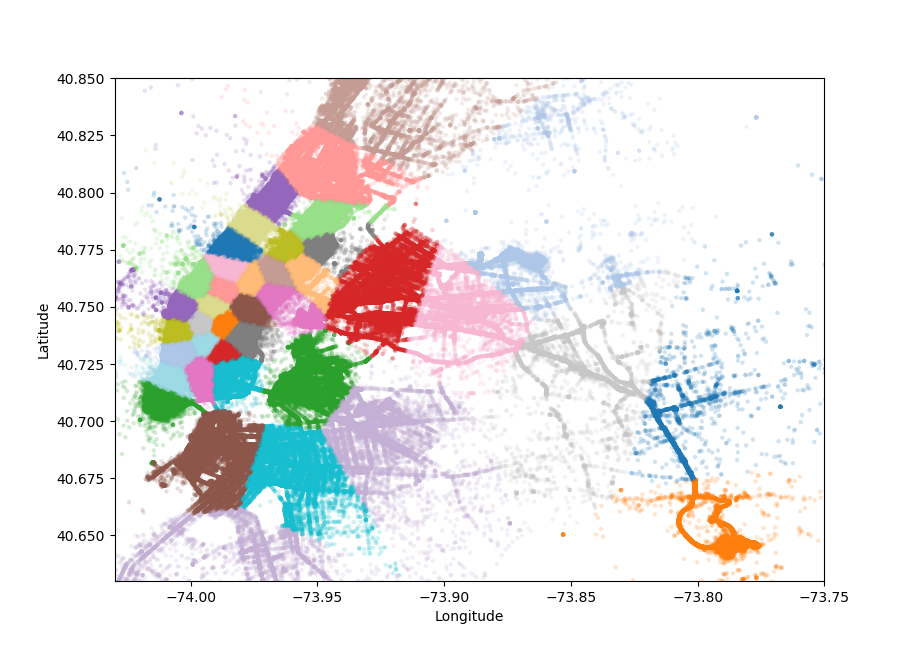

In [61]:
#Visualising the clusters on a map
def plot_clusters(frame):
    city_long_border = (-74.03, -73.75)
    city_lat_border = (40.63, 40.85)
    fig, ax = plt.subplots(ncols=1, nrows=1)
    ax.scatter(frame.pickup_longitude.values, frame.pickup_latitude.values, s=10, lw=0,
               c=frame.pickup_cluster.values, cmap='tab20', alpha=0.2)
    ax.set_xlim(city_long_border)
    ax.set_ylim(city_lat_border)
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    plt.show();

plot_clusters(frame_with_durations_outliers_removed)

The clusters are divided in such a way that dense regions has most pickups and sparse regions has less number of pickups. If ntice carefully, the region around the central park has more number of pickups which is very evident since central park is like the heart of the city. Most of the offices in NYC lie around the central park regions. We can also see that some small regions in Manhattan are extremely dense as compared to some of the other large regions outside Manhattan. 

## Time-binning

We will build bins of intervals 10 min each. Unix Time Stamp: No of seconds passed since the midnight of Jan 1,1970. We will take a given time, convert it to unix time stamp and divide it by 600(seconds) bins. Now that we have both the clusters and bns ready, we will make predictions. 

In [56]:
#Refer:https://www.unixtimestamp.com/
# 1420070400 : 2015-01-01 00:00:00 
# 1422748800 : 2015-02-01 00:00:00 
# 1425168000 : 2015-03-01 00:00:00
# 1427846400 : 2015-04-01 00:00:00 
# 1430438400 : 2015-05-01 00:00:00 
# 1433116800 : 2015-06-01 00:00:00

# 1451606400 : 2016-01-01 00:00:00 
# 1454284800 : 2016-02-01 00:00:00 
# 1456790400 : 2016-03-01 00:00:00
# 1459468800 : 2016-04-01 00:00:00 
# 1462060800 : 2016-05-01 00:00:00 
# 1464739200 : 2016-06-01 00:00:00

def add_pickup_bins(frame,month,year):
    unix_pickup_times=[i for i in frame['pickup_times'].values]
    unix_times = [[1420070400,1422748800,1425168000,1427846400,1430438400,1433116800],\
                    [1451606400,1454284800,1456790400,1459468800,1462060800,1464739200]]
    
    start_pickup_unix=unix_times[year-2015][month-1]
    # https://www.timeanddate.com/time/zones/est
    # (int((i-start_pickup_unix)/600)+33) : our unix time is in gmt to we are converting it to est
    tenminutewise_binned_unix_pickup_times=[(int((i-start_pickup_unix)/600)+33) for i in unix_pickup_times]
    frame['pickup_bins'] = np.array(tenminutewise_binned_unix_pickup_times)
    return frame

In [57]:
# clustering, making pickup bins and grouping by pickup cluster and pickup bins
frame_with_durations_outliers_removed['pickup_cluster'] = kmeans.predict(frame_with_durations_outliers_removed[['pickup_latitude', 'pickup_longitude']])
jan_2015_frame = add_pickup_bins(frame_with_durations_outliers_removed,1,2015)
jan_2015_groupby = jan_2015_frame[['pickup_cluster','pickup_bins','trip_distance']].groupby(['pickup_cluster','pickup_bins']).count()

In [58]:
# we add two more columns 'pickup_cluster'(to which cluster it belogns to) 
# and 'pickup_bins' (to which 10min intravel the trip belongs to)
jan_2015_frame.head()

,Unnamed: 0,passenger_count,trip_distance,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,total_amount,trip_times,pickup_times,Speed,pickup_cluster,pickup_bins
0,0,1,1.59,-73.993896,40.750111,-73.974785,40.750618,17.05,18.050000,1.421329e+09,5.285319,34,2130
1,1,1,3.30,-74.001648,40.724243,-73.994415,40.759109,17.80,19.833333,1.420902e+09,9.983193,2,1419
2,2,1,1.80,-73.963341,40.802788,-73.951820,40.824413,10.80,10.050000,1.420902e+09,10.746269,16,1419
3,3,1,0.50,-74.009087,40.713818,-74.004326,40.719986,4.80,1.866667,1.420902e+09,16.071429,38,1419
4,4,1,3.00,-73.971176,40.762428,-74.004181,40.742653,16.30,19.316667,1.420902e+09,9.318378,22,1419


In [59]:
# hear the trip_distance represents the number of pickups that have happend in that particular 10min intravel
# this data frame has two indices
# primary index: pickup_cluster (cluster number)
# secondary index : pickup_bins (we devid whole months time into 10min intravels 24*31*60/10 =4464bins)
jan_2015_groupby.head()

trip_distance
pickup_cluster pickup_bins               
0              1                      105
               2                      199
               3                      208
               4                      141
               5                      155

In [51]:
# upto now we cleaned data and prepared data for the month 2015,

# now do the same operations for months Jan, Feb, March of 2016
# 1. get the dataframe which inlcudes only required colums
# 2. adding trip times, speed, unix time stamp of pickup_time
# 4. remove the outliers based on trip_times, speed, trip_duration, total_amount
# 5. add pickup_cluster to each data point
# 6. add pickup_bin (index of 10min intravel to which that trip belongs to)
# 7. group by data, based on 'pickup_cluster' and 'pickup_bin'

# Data Preparation for the months of Jan,Feb and March 2016
def datapreparation(month,kmeans,month_no,year_no):
    
    print ("Return with trip times..")

    frame_with_durations = return_with_trip_times(month)
    
    print ("Remove outliers..")
    frame_with_durations_outliers_removed = remove_outliers(frame_with_durations)
    
    print ("Estimating clusters..")
    frame_with_durations_outliers_removed['pickup_cluster'] = kmeans.predict(frame_with_durations_outliers_removed[['pickup_latitude', 'pickup_longitude']])
    #frame_with_durations_outliers_removed_2016['pickup_cluster'] = kmeans.predict(frame_with_durations_outliers_removed_2016[['pickup_latitude', 'pickup_longitude']])

    print ("Final groupbying..")
    final_updated_frame = add_pickup_bins(frame_with_durations_outliers_removed,month_no,year_no)
    final_groupby_frame = final_updated_frame[['pickup_cluster','pickup_bins','trip_distance']].groupby(['pickup_cluster','pickup_bins']).count()
    
    return final_updated_frame,final_groupby_frame
    
month_jan_2016 = dd.read_csv('yellow_tripdata_2016-01.csv')
month_feb_2016 = dd.read_csv('yellow_tripdata_2016-02.csv')
month_mar_2016 = dd.read_csv('yellow_tripdata_2016-03.csv')

jan_2016_frame,jan_2016_groupby = datapreparation(month_jan_2016,kmeans,1,2016)
feb_2016_frame,feb_2016_groupby = datapreparation(month_feb_2016,kmeans,2,2016)
mar_2016_frame,mar_2016_groupby = datapreparation(month_mar_2016,kmeans,3,2016)

Return with trip times..
Remove outliers..
Number of pickup records =  10906858
Number of outlier coordinates lying outside NY boundaries: 214677
Number of outliers from trip times analysis: 27190
Number of outliers from trip distance analysis: 79742
Number of outliers from speed analysis: 21047
Number of outliers from fare analysis: 4991
Total outliers removed 297784
---
Estimating clusters..
Final groupbying..
Return with trip times..
Remove outliers..
Number of pickup records =  11382049
Number of outlier coordinates lying outside NY boundaries: 223161
Number of outliers from trip times analysis: 27670
Number of outliers from trip distance analysis: 81902
Number of outliers from speed analysis: 22437
Number of outliers from fare analysis: 5476
Total outliers removed 308177
---
Estimating clusters..
Final groupbying..
Return with trip times..
Remove outliers..
Number of pickup records =  12210952
Number of outlier coordinates lying outside NY boundaries: 232444
Number of outliers fro

### Save the processed data

In [ ]:
import pandas as pd
jan_2015_frame.to_csv("cleaned/jan_2015_frame.csv")
jan_2015_groupby.to_csv("cleaned/jan_2015_groupby.csv")
jan_2016_frame.to_csv("cleaned/jan_2016_frame.csv")
jan_2016_groupby.to_csv("cleaned/jan_2016_groupby.csv")
feb_2016_frame.to_csv("cleaned/feb_2016_frame.csv")
feb_2016_groupby.to_csv("cleaned/feb_2016_groupby.csv")
mar_2016_frame.to_csv("cleaned/mar_2016_frame.csv")
mar_2016_groupby.to_csv("cleaned/mar_2016_groupby.csv")

### Load the processed data

In [4]:
jan_2015_frame=pd.read_csv("cleaned/jan_2015_frame.csv").drop(["Unnamed: 0"], axis=1)
jan_2015_groupby=pd.read_csv("cleaned/jan_2015_groupby.csv")

jan_2016_frame=pd.read_csv("cleaned/jan_2016_frame.csv").drop(["Unnamed: 0"], axis=1)
jan_2016_groupby=pd.read_csv("cleaned/jan_2016_groupby.csv")

feb_2016_frame=pd.read_csv("cleaned/feb_2016_frame.csv").drop(["Unnamed: 0"], axis=1)
feb_2016_groupby=pd.read_csv("cleaned/feb_2016_groupby.csv")

mar_2016_frame=pd.read_csv("cleaned/mar_2016_frame.csv").drop(["Unnamed: 0"], axis=1)
mar_2016_groupby=pd.read_csv("cleaned/mar_2016_groupby.csv")

In [5]:
feb_2016_frame.head()

,passenger_count,trip_distance,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,total_amount,trip_times,pickup_times,Speed,pickup_cluster,pickup_bins
0,2,0.70,-73.947250,40.763771,-73.992012,40.735390,5.8,3.00,1.456401e+09,14.000000,6,3560
1,2,5.52,-73.983017,40.750992,-73.988586,40.758839,21.3,21.00,1.456422e+09,15.771429,21,3595
2,6,1.99,-73.992340,40.758202,-73.964355,40.757977,11.5,10.85,1.454265e+09,11.004608,15,1
3,1,1.50,-73.981453,40.749722,-73.982323,40.763985,7.8,5.20,1.454265e+09,17.307692,21,1
4,1,5.60,-74.000603,40.729755,-73.951324,40.669834,25.3,20.90,1.454265e+09,16.076555,2,1


## Smoothing

If we notice carefully some 10 minute intervals has 0 pick ups. 0 is not very relevant when we train the model. So instead of keeping those values as it is, we will smooth them. The process is as follows. We have time binned regions of 10 minute intervals. Let's take three continuos intervals and let's say each of the intervals have 50,100 and 0 pickups respectively. Instead of taking 0 as the third value we will take the take the average of all the values and distribute it in the three regions as 50,50,50. In this way, each 30 minute interval will have the same number of pickups even though the pickups values changes in each of the three 10 minute interval.

In [6]:
# Gets the unique bins where pickup values are present for each each region

# for each cluster region we will collect all the indices of 10min intravels in which the pickups have happened
# we have made an observation that there are some pickpbins that doesnt have any pickups
def return_unq_pickup_bins(frame):
    values = []
    for i in range(0,40):
        new = frame[frame['pickup_cluster'] == i]
        list_unq = list(set(new['pickup_bins']))
        list_unq.sort()
        values.append(list_unq)
    return values

In [7]:
# for every month we get all indices of 10min intervals in which atleast one pickup happened

#jan
jan_2015_unique = return_unq_pickup_bins(jan_2015_frame)
jan_2016_unique = return_unq_pickup_bins(jan_2016_frame)

#feb
feb_2016_unique = return_unq_pickup_bins(feb_2016_frame)

#march
mar_2016_unique = return_unq_pickup_bins(mar_2016_frame)

In [8]:
# for each cluster number of 10min intravels with 0 pickups
#(we devid whole months time into 10min intravels 24*31*60/10 =4464bins)
for i in range(40):
    print("For the ",i,"th cluster, number of 10min intervals with zero pickups= ",4464 - len(set(jan_2015_unique[i])))
    print('-'*60)

For the  0 th cluster, number of 10min intervals with zero pickups=  41
------------------------------------------------------------
For the  1 th cluster, number of 10min intervals with zero pickups=  1986
------------------------------------------------------------
For the  2 th cluster, number of 10min intervals with zero pickups=  30
------------------------------------------------------------
For the  3 th cluster, number of 10min intervals with zero pickups=  355
------------------------------------------------------------
For the  4 th cluster, number of 10min intervals with zero pickups=  38
------------------------------------------------------------
For the  5 th cluster, number of 10min intervals with zero pickups=  154
------------------------------------------------------------
For the  6 th cluster, number of 10min intervals with zero pickups=  35
------------------------------------------------------------
For the  7 th cluster, number of 10min intervals with zero pickup

there are two ways to fill up these values
<ul>
<li> Fill the missing value with 0's</li>
<li> Fill the missing values with the avg values
<ul>
<li> Case 1:(values missing at the start)  <br>Ex1: \_ \_ \_ x =>ceil(x/4), ceil(x/4), ceil(x/4), ceil(x/4) <br> Ex2: \_ \_ x => ceil(x/3), ceil(x/3), ceil(x/3) </li>
<li> Case 2:(values missing in middle) <br>Ex1: x \_ \_ y => ceil((x+y)/4), ceil((x+y)/4), ceil((x+y)/4), ceil((x+y)/4) <br> Ex2: x \_ \_ \_ y => ceil((x+y)/5), ceil((x+y)/5), ceil((x+y)/5), ceil((x+y)/5), ceil((x+y)/5) </li>
<li> Case 3:(values missing at the end)  <br>Ex1: x \_ \_ \_  => ceil(x/4), ceil(x/4), ceil(x/4), ceil(x/4) <br> Ex2: x \_  => ceil(x/2), ceil(x/2) </li>
</ul>
</li>
</ul>

In [9]:
# Fills a value of zero for every bin where no pickup data is present 
# the count_values: number pickps that are happened in each region for each 10min intravel
# there wont be any value if there are no picksups.
# values: number of unique bins

# for every 10min intravel(pickup_bin) we will check it is there in our unique bin,
# if it is there we will add the count_values[index] to smoothed data
# if not we add 0 to the smoothed data
# we finally return smoothed data
def fill_missing(count_values,values):
    smoothed_regions=[]
    ind=0
    for r in range(0,40):
        smoothed_bins=[]
        for i in range(4464):
            if i in values[r]:
                smoothed_bins.append(count_values[ind])
                ind+=1
            else:
                smoothed_bins.append(0)
        smoothed_regions.extend(smoothed_bins)
    return smoothed_regions

In [10]:
# Fills a value of zero for every bin where no pickup data is present 
# the count_values: number pickps that are happened in each region for each 10min intravel
# there wont be any value if there are no picksups.
# values: number of unique bins

# for every 10min intravel(pickup_bin) we will check it is there in our unique bin,
# if it is there we will add the count_values[index] to smoothed data
# if not we add smoothed data (which is calculated based on the methods that are discussed in the above markdown cell)
# we finally return smoothed data
def smoothing(count_values,values):
    smoothed_regions=[] # stores list of final smoothed values of each reigion
    ind=0
    repeat=0 
    smoothed_value=0
    for r in range(0,40):
        smoothed_bins=[] #stores the final smoothed values
        repeat=0
        for i in range(4464):
            if repeat!=0: # prevents iteration for a value which is already visited/resolved
                repeat-=1
                continue
            if i in values[r]: #checks if the pickup-bin exists 
                smoothed_bins.append(count_values[ind]) # appends the value of the pickup bin if it exists
            else:
                if i!=0:
                    right_hand_limit=0
                    for j in range(i,4464):
                        if  j not in values[r]: #searches for the left-limit or the pickup-bin value which has a pickup value
                            continue
                        else:
                            right_hand_limit=j
                            break
                    if right_hand_limit==0:
                    #Case 1: When we have the last/last few values are found to be missing,hence we have no right-limit here
                        smoothed_value=count_values[ind-1]*1.0/((4463-i)+2)*1.0                               
                        for j in range(i,4464):                              
                            smoothed_bins.append(math.ceil(smoothed_value))
                        smoothed_bins[i-1] = math.ceil(smoothed_value)
                        repeat=(4463-i)
                        ind-=1
                    else:
                    #Case 2: When we have the missing values between two known values
                        smoothed_value=(count_values[ind-1]+count_values[ind])*1.0/((right_hand_limit-i)+2)*1.0             
                        for j in range(i,right_hand_limit+1):
                            smoothed_bins.append(math.ceil(smoothed_value))
                        smoothed_bins[i-1] = math.ceil(smoothed_value)
                        repeat=(right_hand_limit-i)
                else:
                    #Case 3: When we have the first/first few values are found to be missing,hence we have no left-limit here
                    right_hand_limit=0
                    for j in range(i,4464):
                        if  j not in values[r]:
                            continue
                        else:
                            right_hand_limit=j
                            break
                    smoothed_value=count_values[ind]*1.0/((right_hand_limit-i)+1)*1.0
                    for j in range(i,right_hand_limit+1):
                            smoothed_bins.append(math.ceil(smoothed_value))
                    repeat=(right_hand_limit-i)
            ind+=1
        smoothed_regions.extend(smoothed_bins)
    return smoothed_regions


In [11]:
#Filling Missing values of Jan-2015 with 0
# here in jan_2015_groupby dataframe the trip_distance represents the number of pickups that are happened
jan_2015_fill = fill_missing(jan_2015_groupby['trip_distance'].values,jan_2015_unique)

#Smoothing Missing values of Jan-2015
jan_2015_smooth = smoothing(jan_2015_groupby['trip_distance'].values,jan_2015_unique)

In [12]:
# number of 10min indices for jan 2015= 24*31*60/10 = 4464
# number of 10min indices for jan 2016 = 24*31*60/10 = 4464
# number of 10min indices for feb 2016 = 24*29*60/10 = 4176
# number of 10min indices for march 2016 = 24*30*60/10 = 4320
# for each cluster we will have 4464 values, therefore 40*4464 = 178560 (length of the jan_2016_fill)
print("Number of 10 min intervals among all the clusters for Jan 2015 data",len(jan_2015_fill))

Number of 10 min intervals among all the clusters for Jan 2015 data 178560


<IPython.core.display.Javascript object>


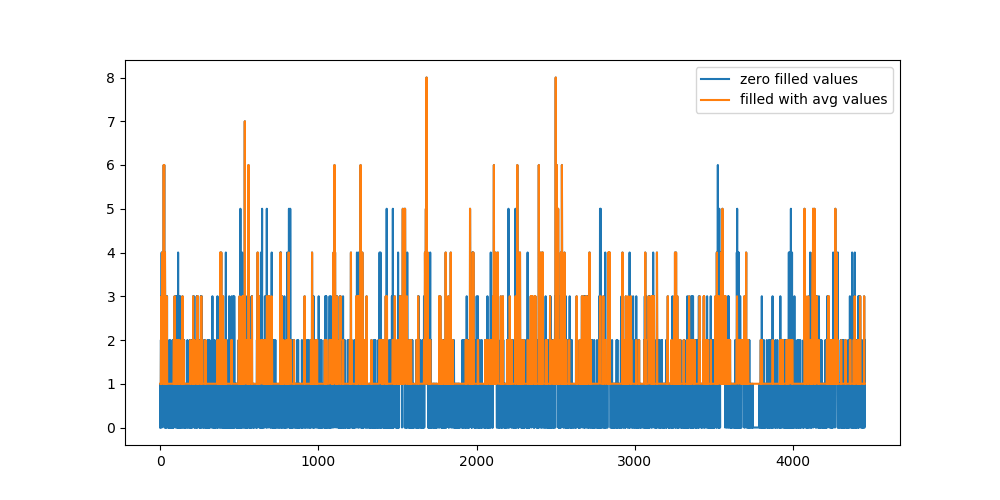

In [13]:
# Smoothing vs Filling
# sample plot that shows two variations of filling missing values
# we have taken the number of pickups for cluster region 2
plt.figure(figsize=(10,5))
plt.plot(jan_2015_fill[4464:8920], label="zero filled values")
plt.plot(jan_2015_smooth[4464:8920], label="filled with avg values")
plt.legend()
plt.show()

In [14]:
# why we choose, these methods and which method is used for which data?

# Ans: consider we have data of some month in 2015 jan 1st, 10 _ _ _ 20, i.e there are 10 pickups that are happened in 1st 
# 10st 10min intravel, 0 pickups happened in 2nd 10mins intravel, 0 pickups happened in 3rd 10min intravel 
# and 20 pickups happened in 4th 10min intravel.
# in fill_missing method we replace these values like 10, 0, 0, 20
# where as in smoothing method we replace these values as 6,6,6,6,6, if you can check the number of pickups 
# that are happened in the first 40min are same in both cases, but if you can observe that we looking at the future values 
# wheen you are using smoothing we are looking at the future number of pickups which might cause a data leakage.

# so we use smoothing for jan 2015th data since it acts as our training data
# and we use simple fill_misssing method for 2016th data.

In [14]:
# Jan-2015 data is smoothed, Jan,Feb & March 2016 data missing values are filled with zero
jan_2015_smooth = smoothing(jan_2015_groupby['trip_distance'].values,jan_2015_unique)
jan_2016_smooth = fill_missing(jan_2016_groupby['trip_distance'].values,jan_2016_unique)
feb_2016_smooth = fill_missing(feb_2016_groupby['trip_distance'].values,feb_2016_unique)
mar_2016_smooth = fill_missing(mar_2016_groupby['trip_distance'].values,mar_2016_unique)

# Making list of all the values of pickup data in every bin for a period of 3 months and storing them region-wise 
regions_cum = []

# a =[1,2,3]
# b = [2,3,4]
# a+b = [1, 2, 3, 2, 3, 4]

# number of 10min indices for jan 2015= 24*31*60/10 = 4464
# number of 10min indices for jan 2016 = 24*31*60/10 = 4464
# number of 10min indices for feb 2016 = 24*29*60/10 = 4176
# number of 10min indices for march 2016 = 24*31*60/10 = 4464
# regions_cum: it will contain 40 lists, each list will contain 4464+4176+4464 values which represents the number of pickups 
# that are happened for three months in 2016 data

for i in range(0,40):
    regions_cum.append(jan_2016_smooth[4464*i:4464*(i+1)]+feb_2016_smooth[4176*i:4176*(i+1)]+mar_2016_smooth[4464*i:4464*(i+1)])

# print(len(regions_cum))
# 40
# print(len(regions_cum[0]))
# 13104

## Time series and Fourier Transforms

Time Series: In the below graph, we can see repeated patterns like each day the number of cabs are highest during the office hours. It's least during midnight and increases as the day progresses. It decreases during noon time. Then again starts increasing during evening time. We will explore all such data dependendies using Fourier transformed features. 

Fourier transform generally means decomposition of a wave into sum of multiple sine waves. Whenever there is are repeated patterns in data, we can leverage the most out of them by using Fourier transform. Using fourier transform we can decompose any given waveform(or a function) into it's constituent frequencies. The graph obtained after fourier transform will have unique frequencies and amplitudes corresonding to their most frequent occurences in the original wave. 

Each fourier transformed features are basically multiple sine waves. Each sine wave has a specific time period, frequency and amplitude. From the time period we can easily get the frequencies for each of the sine waves. We are basically converting the time series data from time domain to frequency domain. We will plot these frequencies and it's corresponding amplitudes in a fourier transformed graph. The X axis will represent the frequencies of the sine waves and the Y axis will represent the correspondin amplitudes.

Whenever we have repeated patterns in our data we can explore them using fourier transformation and use them as features. Because they help us understand the hidden repeated patterns which can be very useful for extracting important features from the data. 

<IPython.core.display.Javascript object>


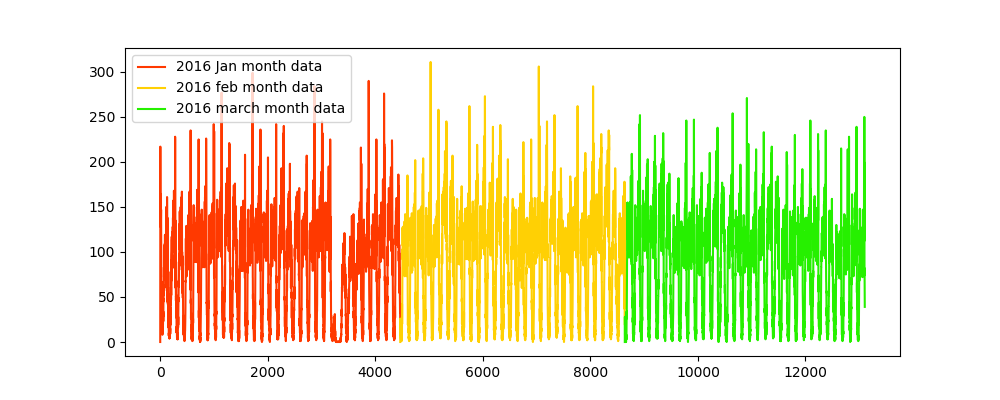

<IPython.core.display.Javascript object>


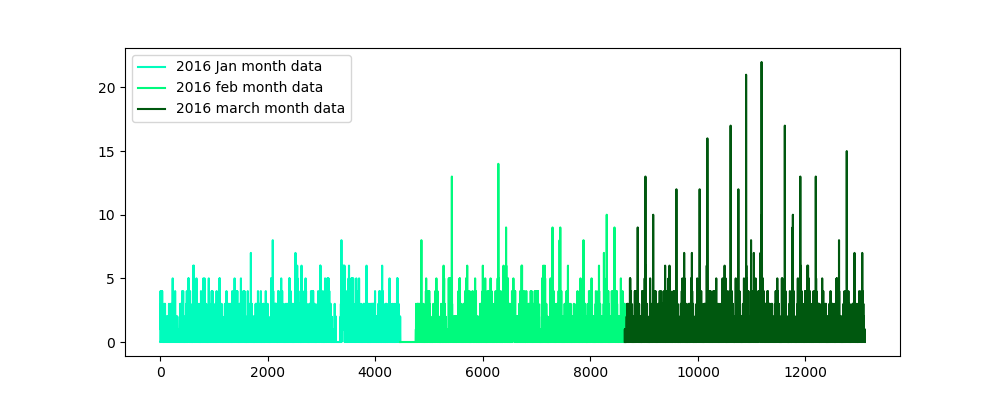

<IPython.core.display.Javascript object>


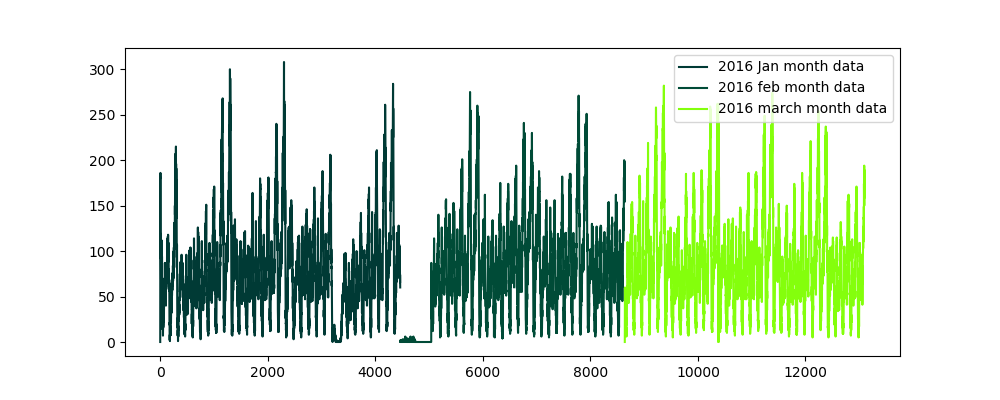

<IPython.core.display.Javascript object>


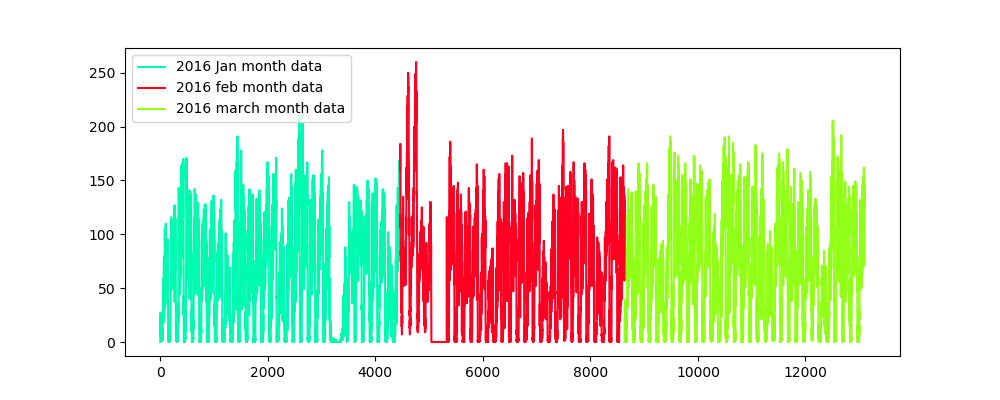

<IPython.core.display.Javascript object>


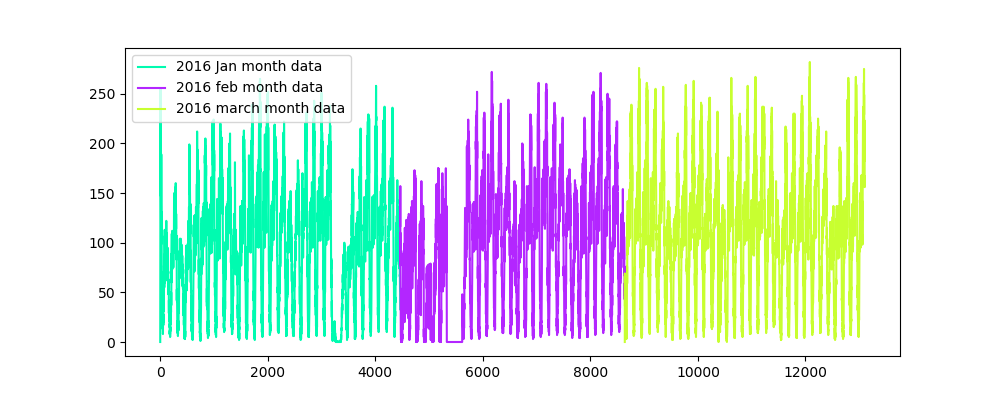

<IPython.core.display.Javascript object>


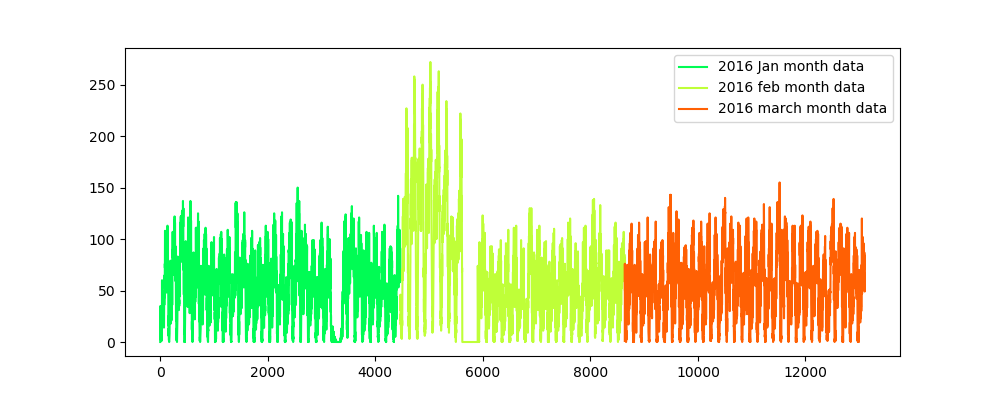

<IPython.core.display.Javascript object>


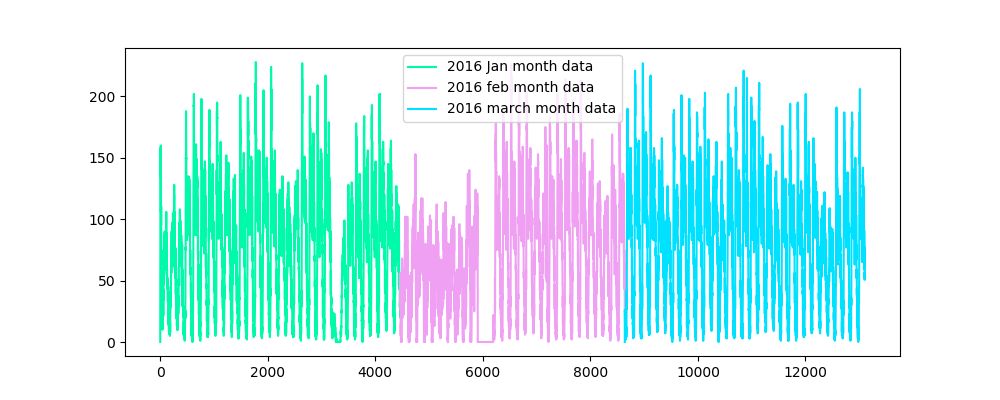

<IPython.core.display.Javascript object>


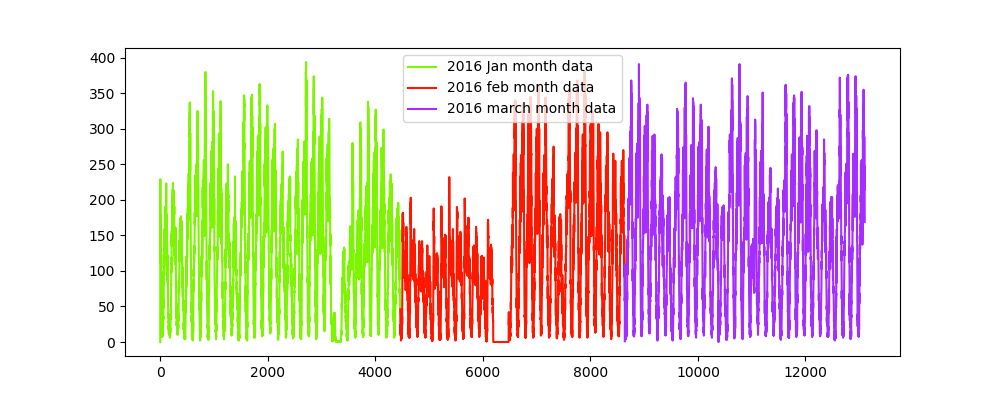

<IPython.core.display.Javascript object>


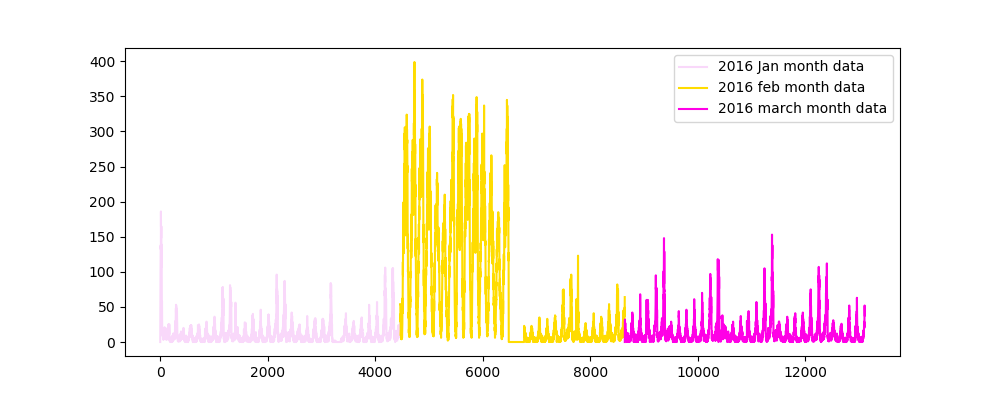

<IPython.core.display.Javascript object>


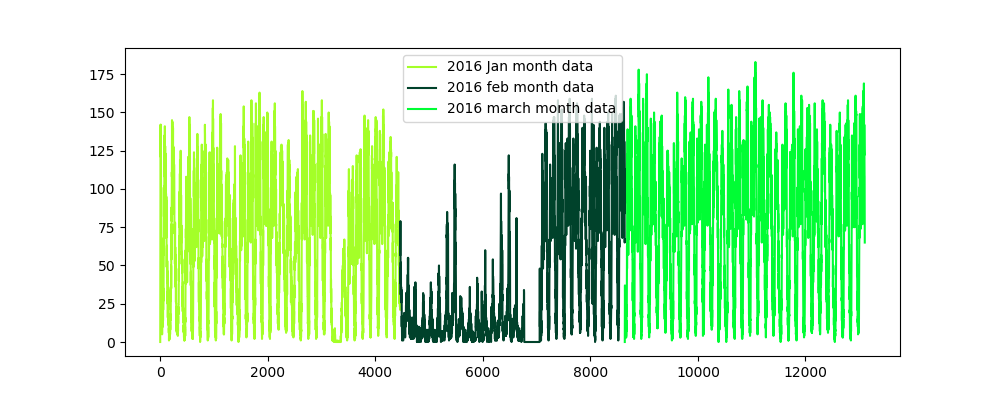

<IPython.core.display.Javascript object>


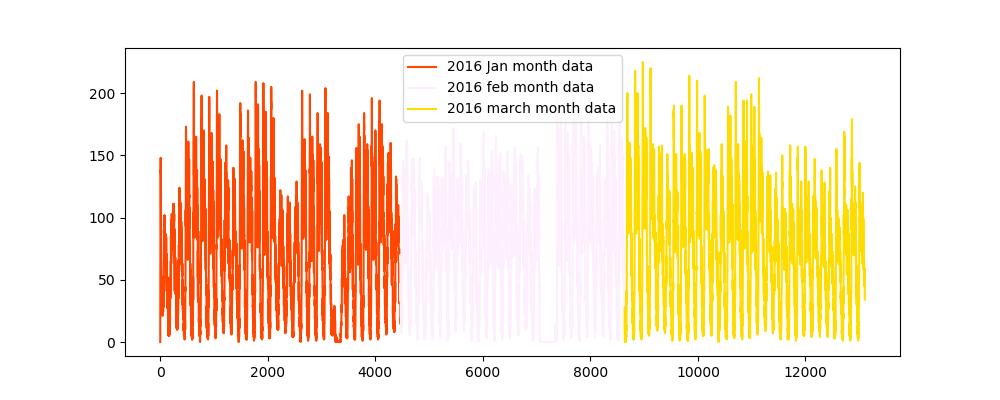

<IPython.core.display.Javascript object>


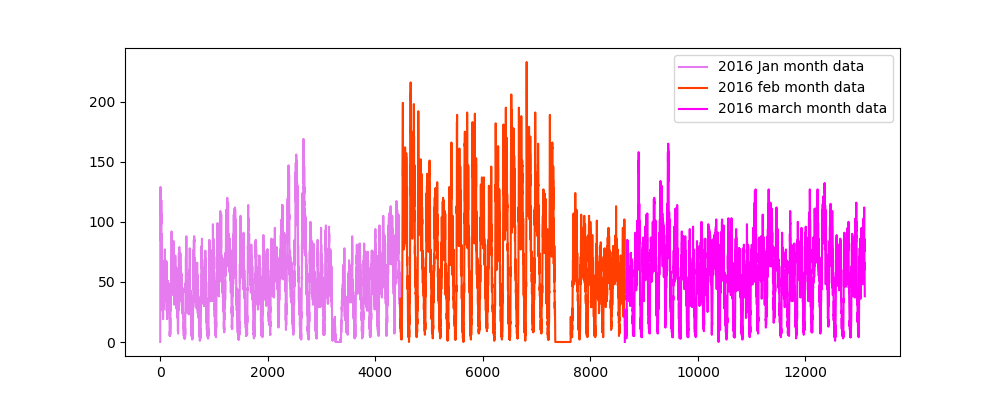

<IPython.core.display.Javascript object>


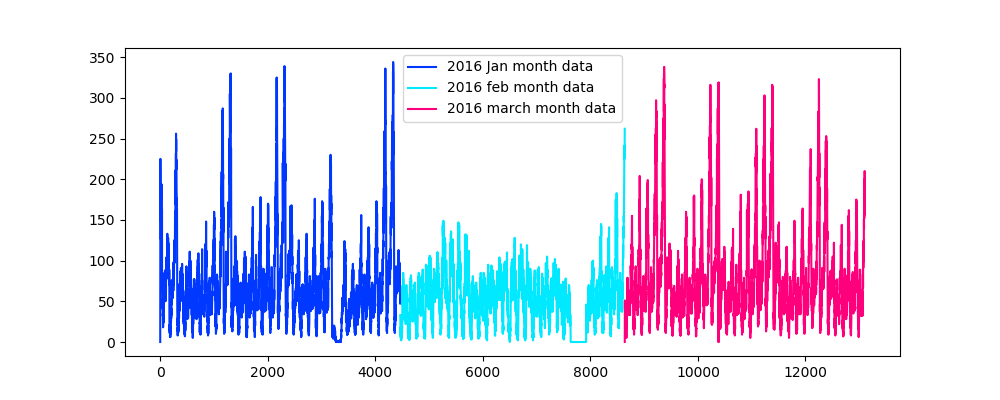

<IPython.core.display.Javascript object>


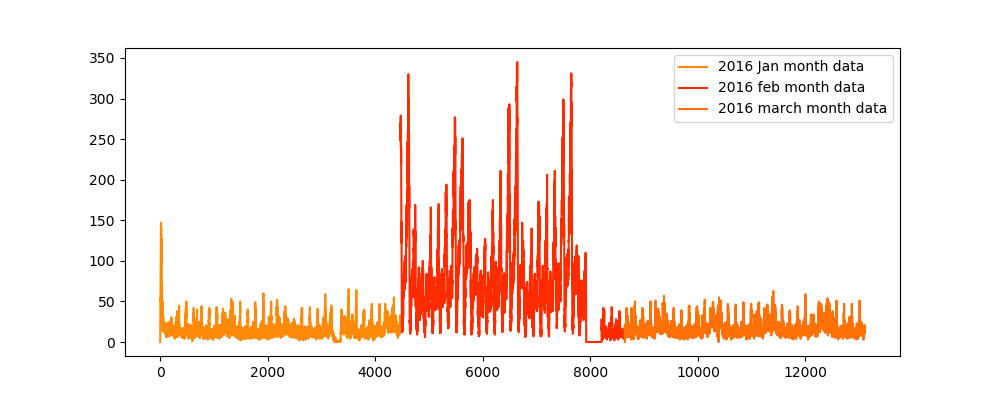

<IPython.core.display.Javascript object>


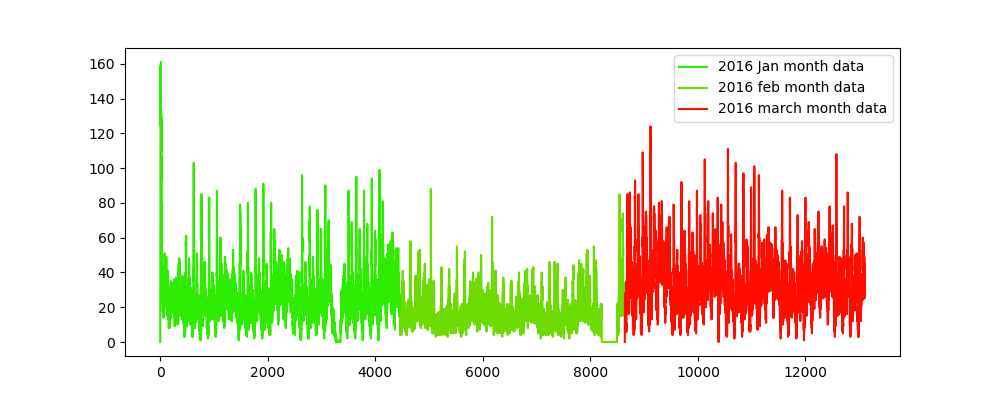

<IPython.core.display.Javascript object>


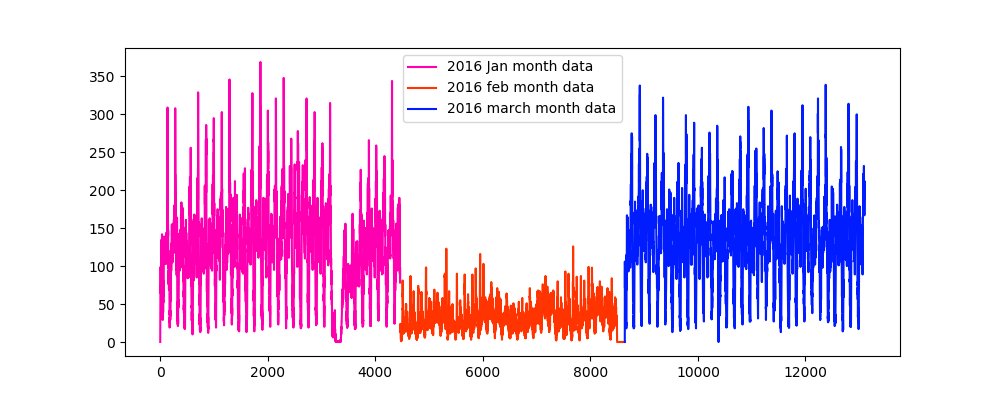

<IPython.core.display.Javascript object>


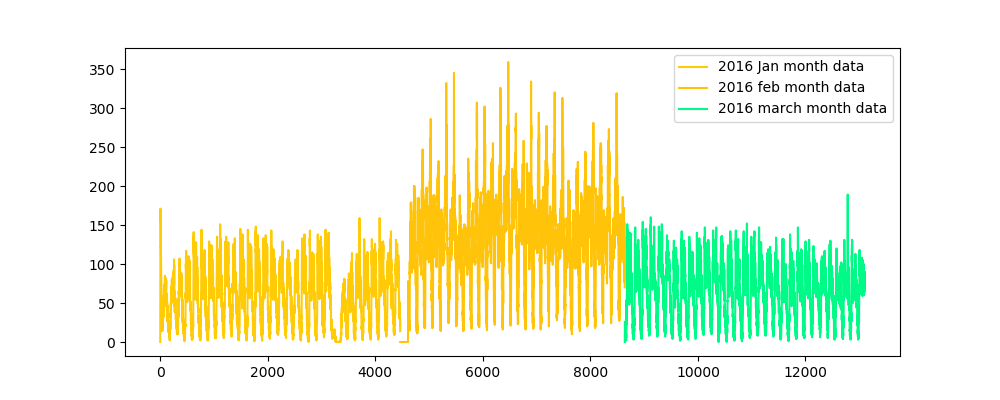

<IPython.core.display.Javascript object>


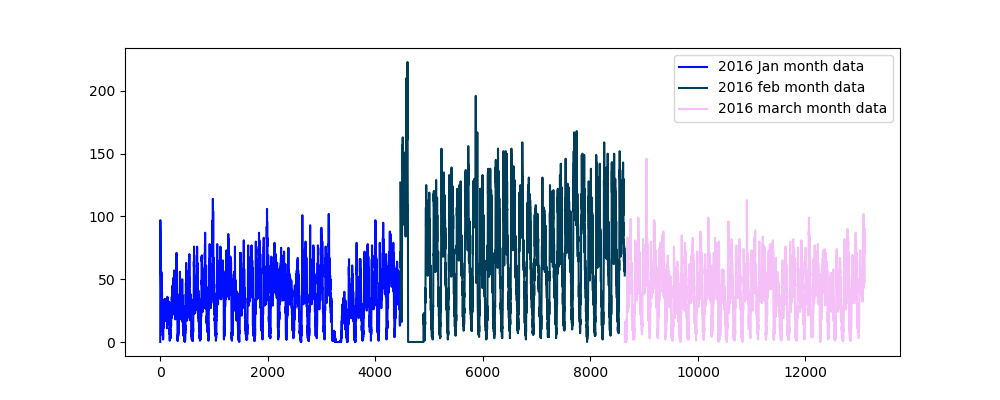

<IPython.core.display.Javascript object>


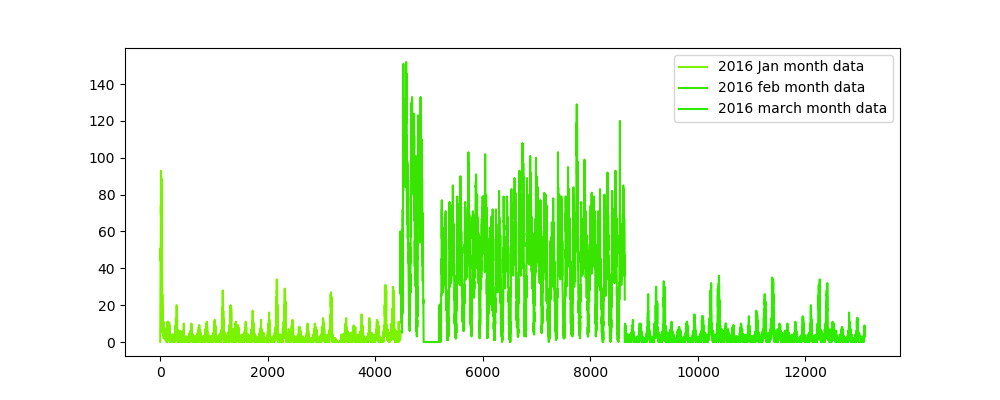

<IPython.core.display.Javascript object>


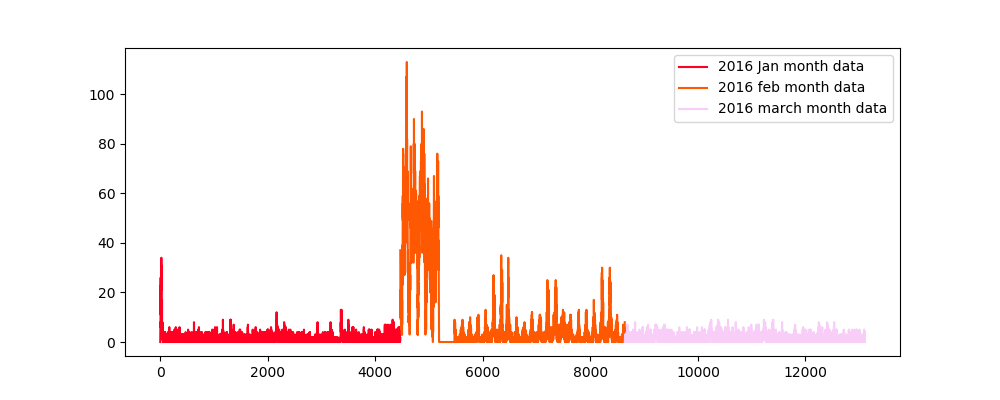

<IPython.core.display.Javascript object>


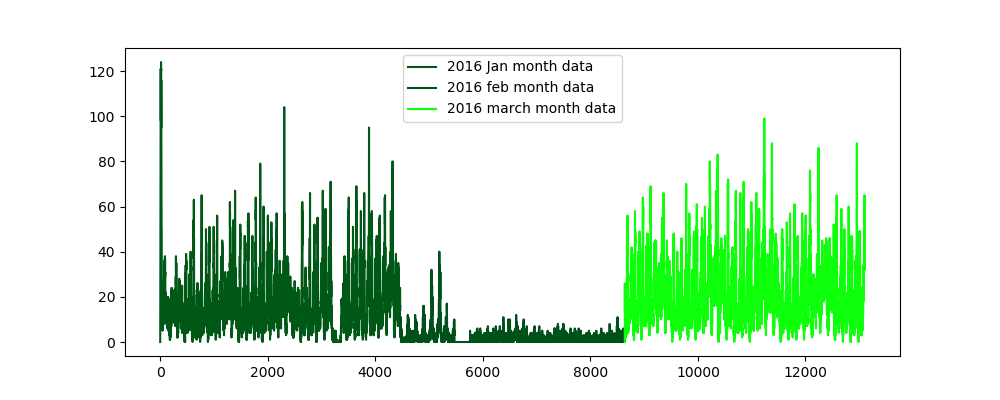

<IPython.core.display.Javascript object>


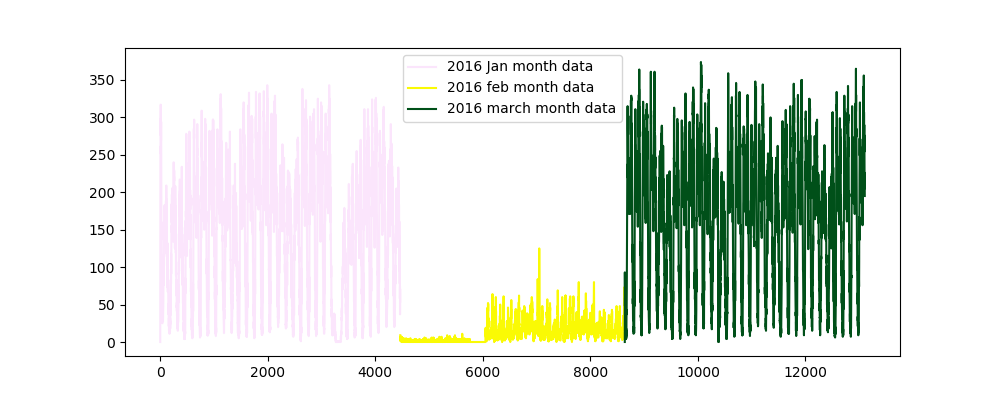

<IPython.core.display.Javascript object>


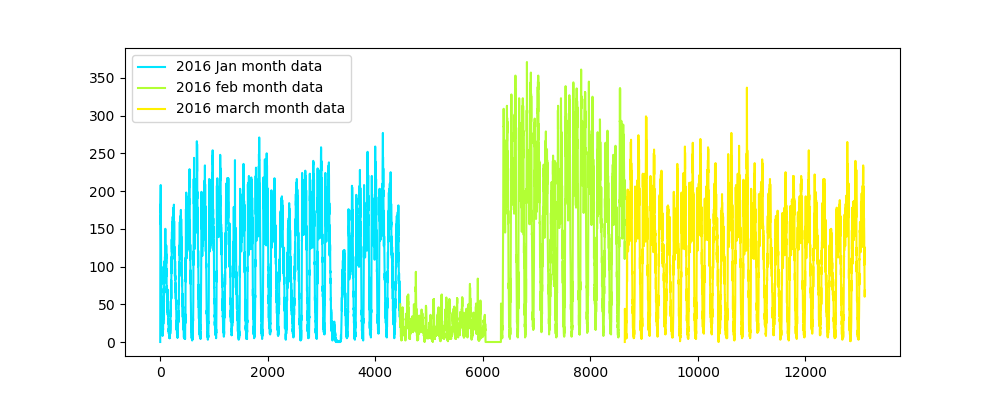

<IPython.core.display.Javascript object>


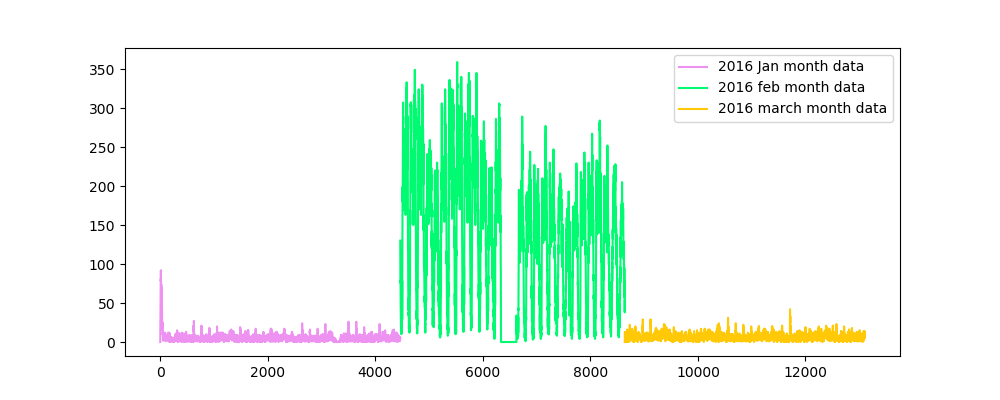

<IPython.core.display.Javascript object>


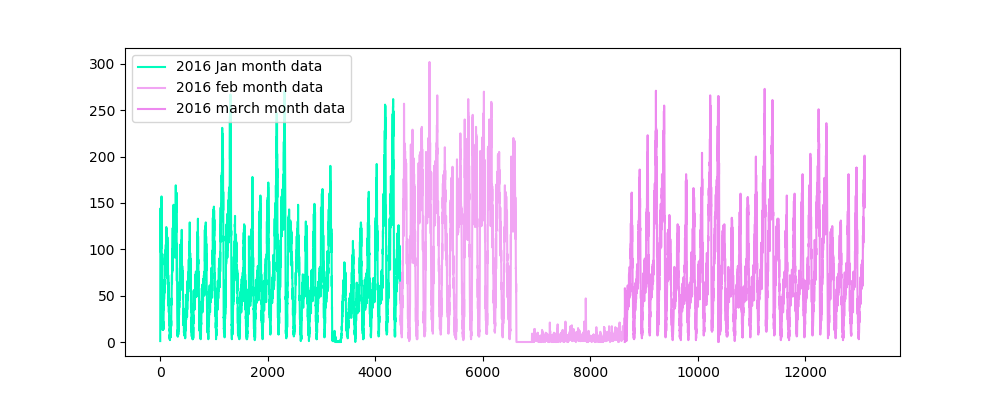

<IPython.core.display.Javascript object>


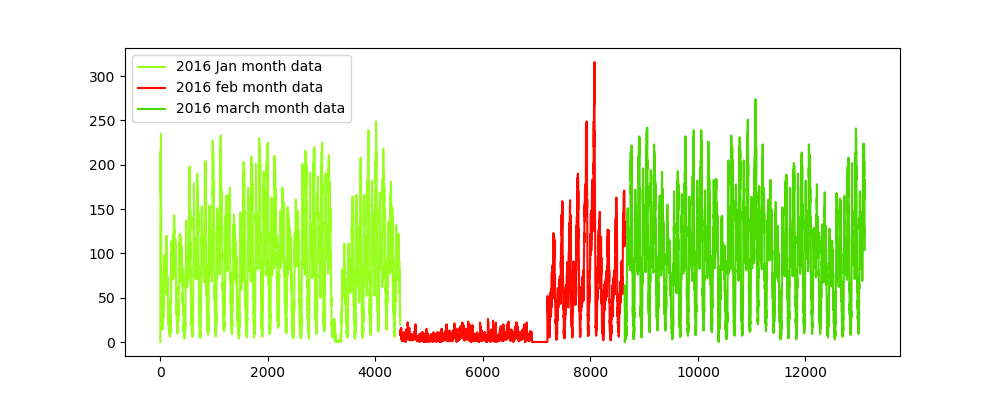

<IPython.core.display.Javascript object>


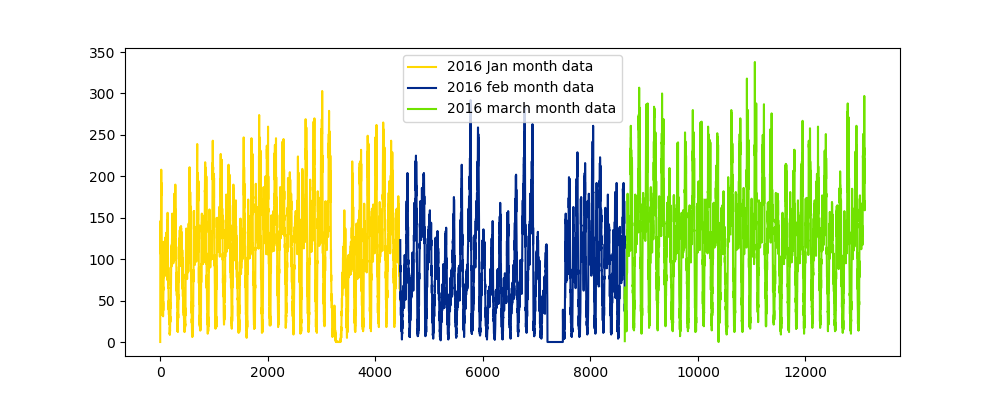

<IPython.core.display.Javascript object>


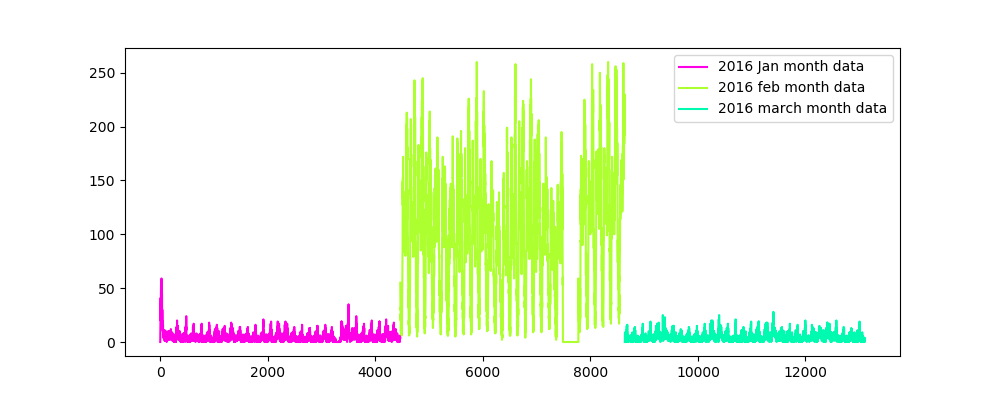

<IPython.core.display.Javascript object>


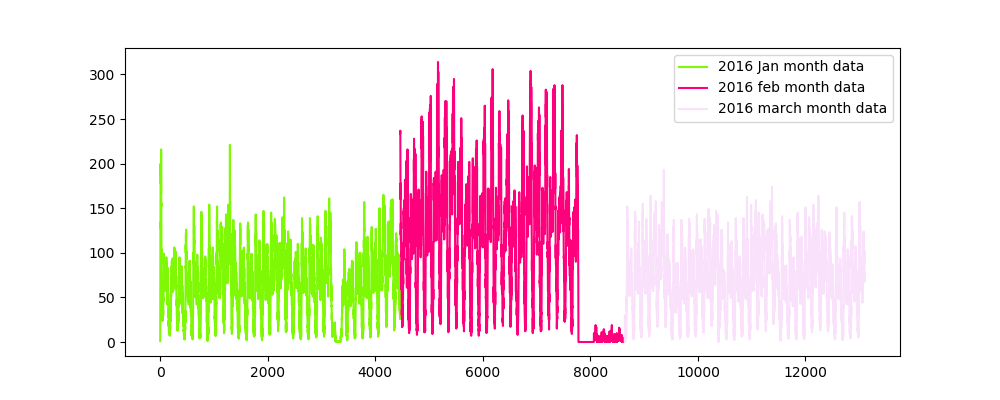

<IPython.core.display.Javascript object>


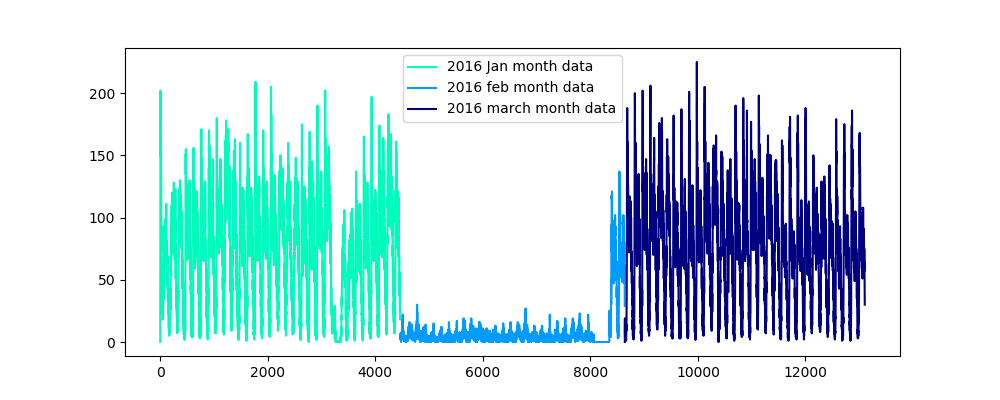

<IPython.core.display.Javascript object>


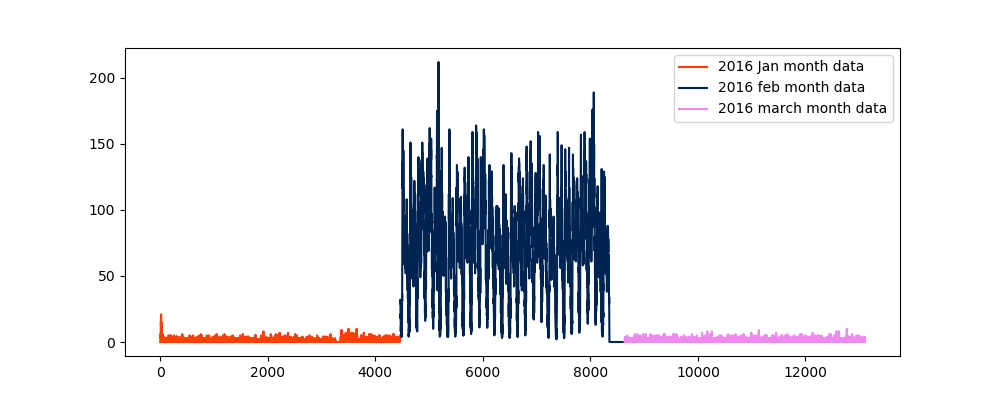

<IPython.core.display.Javascript object>


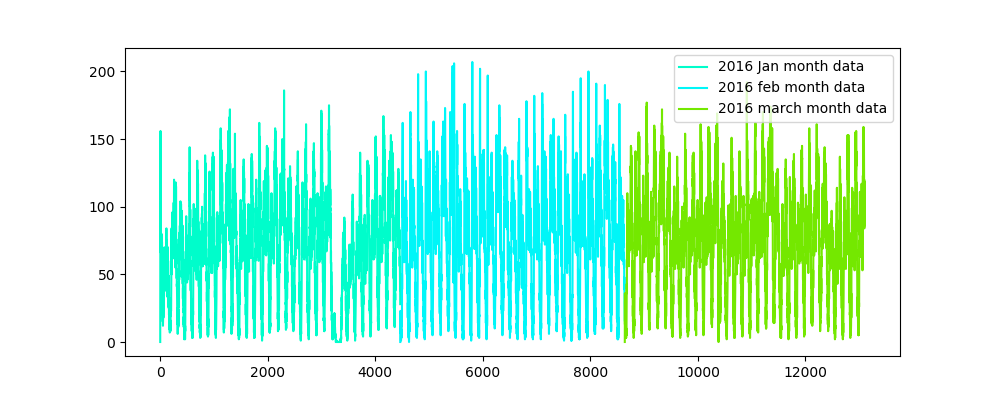

<IPython.core.display.Javascript object>


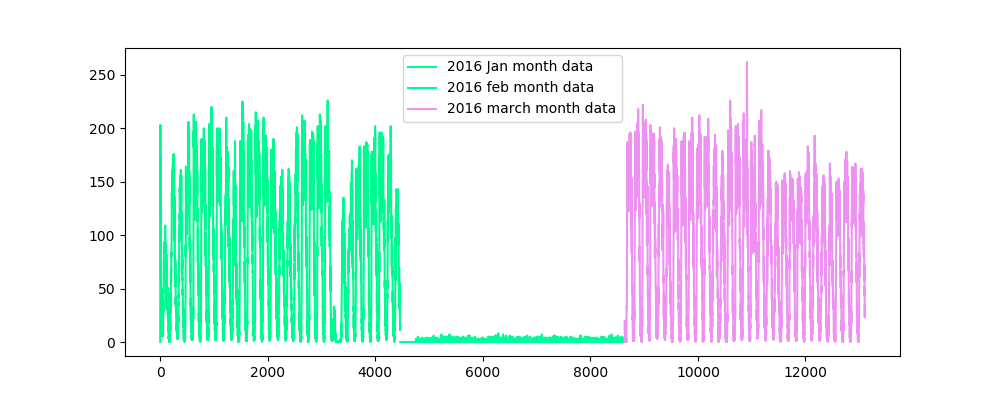

<IPython.core.display.Javascript object>


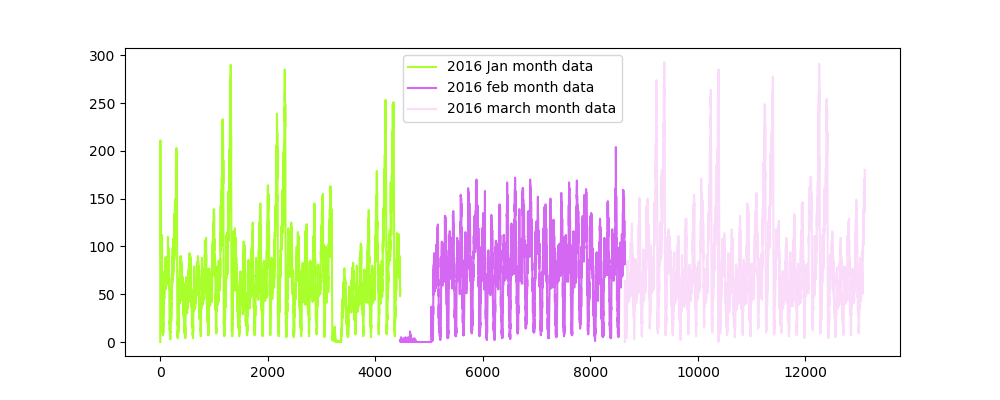

<IPython.core.display.Javascript object>


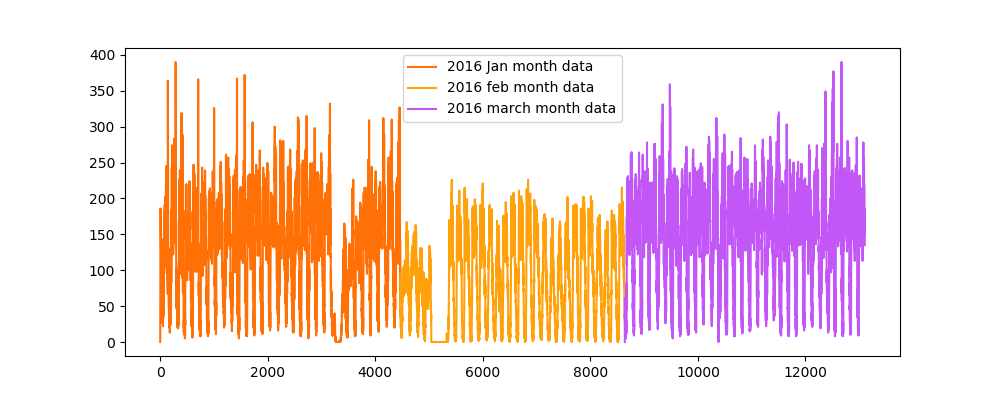

<IPython.core.display.Javascript object>


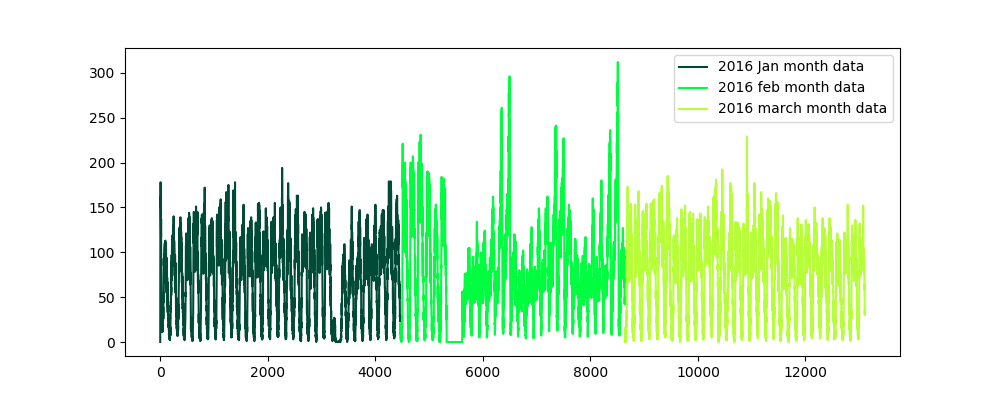

<IPython.core.display.Javascript object>


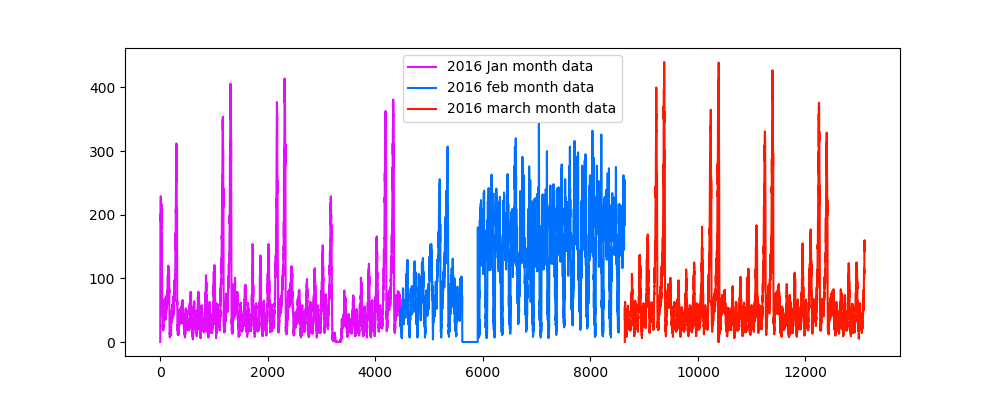

<IPython.core.display.Javascript object>


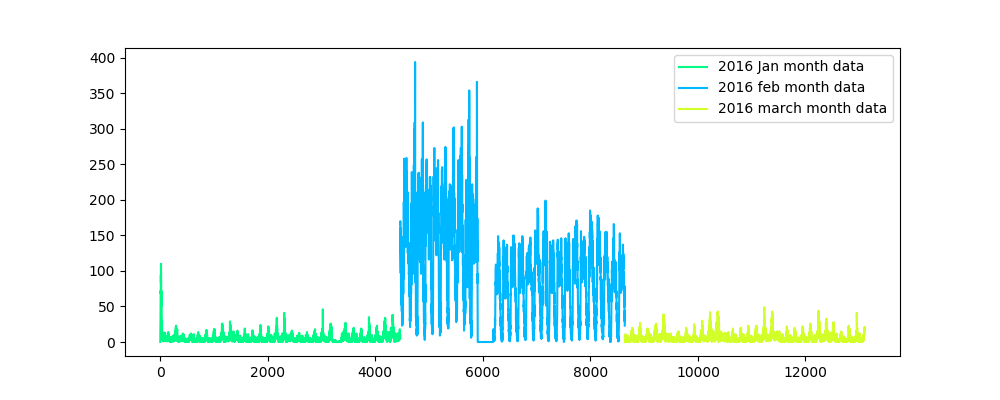

<IPython.core.display.Javascript object>


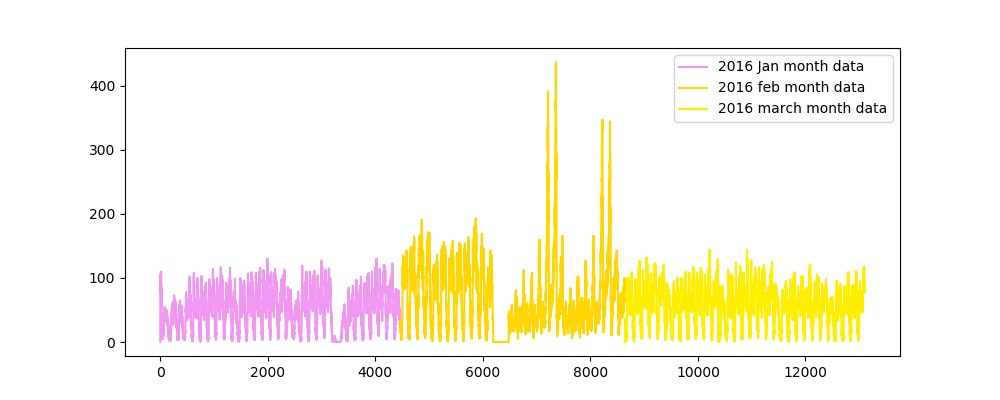

<IPython.core.display.Javascript object>


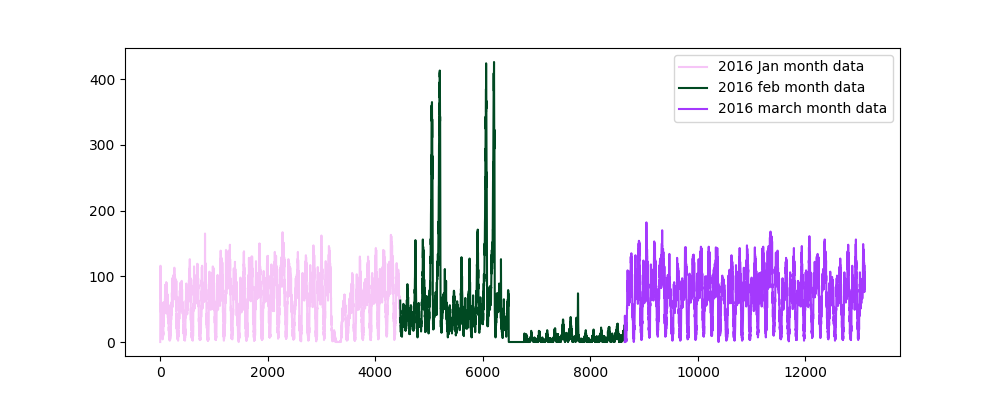

In [16]:
def uniqueish_color():
    """There're better ways to generate unique colors, but this isn't awful."""
    return plt.cm.gist_ncar(np.random.random())

first_x = list(range(0,4464))
second_x = list(range(4464,8640))
third_x = list(range(8640,13104))
for i in range(40):
    plt.figure(figsize=(10,4))
    plt.plot(first_x,regions_cum[i][:4464], color=uniqueish_color(), label='2016 Jan month data')
    plt.plot(second_x,regions_cum[i][4464:8640], color=uniqueish_color(), label='2016 feb month data')
    plt.plot(third_x,regions_cum[i][8640:], color=uniqueish_color(), label='2016 march month data')
    plt.legend()
    plt.show()

<IPython.core.display.Javascript object>


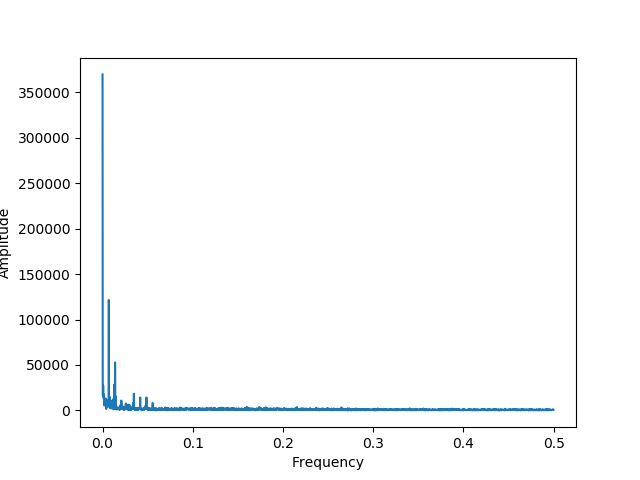

In [15]:
# getting peaks: https://blog.ytotech.com/2015/11/01/findpeaks-in-python/
# read more about fft function : https://docs.scipy.org/doc/numpy/reference/generated/numpy.fft.fft.html
Y=np.fft.fft(np.array(jan_2016_smooth)[0:4460])
# read more about the fftfreq: https://docs.scipy.org/doc/numpy/reference/generated/numpy.fft.fftfreq.html  
freq = np.fft.fftfreq(4460, 1)
n = len(freq)
plt.figure()
plt.plot( freq[:int(n/2)], np.abs(Y)[:int(n/2)] )
plt.xlabel("Frequency")
plt.ylabel("Amplitude")
plt.show()

### Observation:

In the above graphs we have converted the data from a time-domain representation to a frequency domain representation. In this way we are able to extract information from the data. In the fast fourier transformation graph we have multiple frequencies shown in the order of their importance. The pattern which is most repeated will have maximum number of frequencies. We will also have a corresponding amplitude to these frequencies. We will take the most occuring frequencies and their corresponding amplitude as features in our data. 

In teh graph we will have peaks approximately at the 1/144 region, 1/288 region and so on. It is the frequency at which the wave is changing. Here 1/144 corresponds to the daily patters in our data. 1/288 corresponds to maybe quaterly hour patterns. Like the daily patterns of office time, lunch time, school time and so on. There are number of these patterns whcih can be explored. Amplitudes measures how significant the corresponding frequencies are with respect to others. Higher the amplitude, higher will be the frequencies, and more important will be the information. Higher amplitude means we are extracting the most important features from the time series. 

We will take the time series data, transform them using fourier transformation, get the 5 frequencies with most amplitudes and use them as features while training our model. Fourier features are generall considered to be very good in time series problems. 

### Note about DC component.

If we take a closer look at the waves, we can see that the Y axis of teh waves are not centered at zero. The wave is centered around some ther value and oscillating around it. Due to this, during fast fourier transform we will aslo get a peak 0 (corresponding to the fact that the wave is not centered at 0). This peak is called a DC component. DC componenet tells us that the wave is not centered at zero. 

Peak at zero ===> DC Component.
Peak at 1/144 ===> Daily variation.
Peak at 1/188 ===> Morning + Evening peak hours variation and so on. 

In [16]:
#Preparing the Dataframe only with x(i) values as jan-2015 data and y(i) values as jan-2016
ratios_jan = pd.DataFrame()
ratios_jan['Given']=jan_2015_smooth
ratios_jan['Prediction']=jan_2016_smooth
ratios_jan['Ratios']=ratios_jan['Prediction']*1.0/ratios_jan['Given']*1.0

In [17]:
ratios_jan.head()

,Given,Prediction,Ratios
0,53,0,0.000000
1,53,63,1.188679
2,199,217,1.090452
3,208,189,0.908654
4,141,137,0.971631


## Modelling: Baseline Models

Now we get into modelling in order to forecast the pickup densities for the months of Jan, Feb and March of 2016 for which we are using multiple models with two variations 
1. Using Ratios of the 2016 data to the 2015 data i.e $\begin{align} R_{t} = P^{2016}_{t} / P^{2015}_{t} \end{align}$
2. Using Previous known values of the 2016 data itself to predict the future values

Typically time series are broken into windows and we will use the windows at the previous time intervals to predict the outcome at a future time interval. For each cluster we will have a time series. If we compare between two days exactly one year appart(like 15th Jan 2015 and 15th Jan 2016), we can get the Ratio feature, then use this ratio feature to predict the outcome for 16th jan 2016. We will use the recent ratio values to make predictions. There are various ways by which we can explore these ratio features. Using moving averages, using weighted moving averages, using exponential smoothing etc. We will use some ratio and previous value features to make some baseline models and compute their MAPE. This will give us an idea about the upper limit for the MAPE. In simple words we willuse data till time t-1 to predict the result at time t.

### Simple Moving Averages
The First Model used is the Moving Averages Model which uses the previous n values in order to predict the next value <br> 

Using Ratio Values - $\begin{align}R_{t} = ( R_{t-1} + R_{t-2} + R_{t-3} .... R_{t-n} )/n \end{align}$

In [18]:
def MA_R_Predictions(ratios,month):
    predicted_ratio=(ratios['Ratios'].values)[0]
    error=[]
    predicted_values=[]
    window_size=3
    predicted_ratio_values=[]
    for i in range(0,4464*40):
        if i%4464==0:
            predicted_ratio_values.append(0)
            predicted_values.append(0)
            error.append(0)
            continue
        predicted_ratio_values.append(predicted_ratio)
        predicted_values.append(int(((ratios['Given'].values)[i])*predicted_ratio))
        error.append(abs((math.pow(int(((ratios['Given'].values)[i])*predicted_ratio)-(ratios['Prediction'].values)[i],1))))
        if i+1>=window_size:
            predicted_ratio=sum((ratios['Ratios'].values)[(i+1)-window_size:(i+1)])/window_size
        else:
            predicted_ratio=sum((ratios['Ratios'].values)[0:(i+1)])/(i+1)
            
    
    ratios['MA_R_Predicted'] = predicted_values
    ratios['MA_R_Error'] = error
    mape_err = (sum(error)/len(error))/(sum(ratios['Prediction'].values)/len(ratios['Prediction'].values))
    mse_err = sum([e**2 for e in error])/len(error)
    return ratios,mape_err,mse_err

For the above the Hyperparameter is the window-size (n) which is tuned manually and it is found that the window-size of 3 is optimal for getting the best results using Moving Averages using previous Ratio values therefore we get $\begin{align}R_{t} = ( R_{t-1} + R_{t-2} + R_{t-3})/3 \end{align}$

Next we use the Moving averages of the 2016  values itself to predict the future value using $\begin{align}P_{t} = ( P_{t-1} + P_{t-2} + P_{t-3} .... P_{t-n} )/n \end{align}$

In [19]:
def MA_P_Predictions(ratios,month):
    predicted_value=(ratios['Prediction'].values)[0]
    error=[]
    predicted_values=[]
    window_size=1
    predicted_ratio_values=[]
    for i in range(0,4464*40):
        predicted_values.append(predicted_value)
        error.append(abs((math.pow(predicted_value-(ratios['Prediction'].values)[i],1))))
        if i+1>=window_size:
            predicted_value=int(sum((ratios['Prediction'].values)[(i+1)-window_size:(i+1)])/window_size)
        else:
            predicted_value=int(sum((ratios['Prediction'].values)[0:(i+1)])/(i+1))
            
    ratios['MA_P_Predicted'] = predicted_values
    ratios['MA_P_Error'] = error
    mape_err = (sum(error)/len(error))/(sum(ratios['Prediction'].values)/len(ratios['Prediction'].values))
    mse_err = sum([e**2 for e in error])/len(error)
    return ratios,mape_err,mse_err

For the above the Hyperparameter is the window-size (n) which is tuned manually and it is found that the window-size of 1 is optimal for getting the best results using Moving Averages using previous 2016 values therefore we get $\begin{align}P_{t} = P_{t-1} \end{align}$

### Weighted Moving Averages
The Moving Avergaes Model used gave equal importance to all the values in the window used, but we know intuitively that the future is more likely to be similar to the latest values and less similar to the older values. Weighted Averages converts this analogy into a mathematical relationship giving the highest weight while computing the averages to the latest previous value and decreasing weights to the subsequent older ones<br>

Weighted Moving Averages using Ratio Values - $\begin{align}R_{t} = ( N*R_{t-1} + (N-1)*R_{t-2} + (N-2)*R_{t-3} .... 1*R_{t-n} )/(N*(N+1)/2) \end{align}$

The problem with simple moving average approach is that it gives equal priorities to all the previous time intervals. So we will use weghted moving average because by using weighted moving average we can give most importance to the time-series data which is most recent and reduce the importance for time-series data which has occured a few time steps back. 

The value of N is often determined using hyperparameter search and tuning. 

In [20]:
def WA_R_Predictions(ratios,month):
    predicted_ratio=(ratios['Ratios'].values)[0]
    alpha=0.5
    error=[]
    predicted_values=[]
    window_size=5
    predicted_ratio_values=[]
    for i in range(0,4464*40):
        if i%4464==0:
            predicted_ratio_values.append(0)
            predicted_values.append(0)
            error.append(0)
            continue
        predicted_ratio_values.append(predicted_ratio)
        predicted_values.append(int(((ratios['Given'].values)[i])*predicted_ratio))
        error.append(abs((math.pow(int(((ratios['Given'].values)[i])*predicted_ratio)-(ratios['Prediction'].values)[i],1))))
        if i+1>=window_size:
            sum_values=0
            sum_of_coeff=0
            for j in range(window_size,0,-1):
                sum_values += j*(ratios['Ratios'].values)[i-window_size+j]
                sum_of_coeff+=j
            predicted_ratio=sum_values/sum_of_coeff
        else:
            sum_values=0
            sum_of_coeff=0
            for j in range(i+1,0,-1):
                sum_values += j*(ratios['Ratios'].values)[j-1]
                sum_of_coeff+=j
            predicted_ratio=sum_values/sum_of_coeff
            
    ratios['WA_R_Predicted'] = predicted_values
    ratios['WA_R_Error'] = error
    mape_err = (sum(error)/len(error))/(sum(ratios['Prediction'].values)/len(ratios['Prediction'].values))
    mse_err = sum([e**2 for e in error])/len(error)
    return ratios,mape_err,mse_err

For the above the Hyperparameter is the window-size (n) which is tuned manually and it is found that the window-size of 5 is optimal for getting the best results using Weighted Moving Averages using previous Ratio values therefore we get $\begin{align} R_{t} = ( 5*R_{t-1} + 4*R_{t-2} + 3*R_{t-3} + 2*R_{t-4} + R_{t-5} )/15 \end{align}$

Weighted Moving Averages using Previous 2016 Values - $\begin{align}P_{t} = ( N*P_{t-1} + (N-1)*P_{t-2} + (N-2)*P_{t-3} .... 1*P_{t-n} )/(N*(N+1)/2) \end{align}$

In [21]:
def WA_P_Predictions(ratios,month):
    predicted_value=(ratios['Prediction'].values)[0]
    error=[]
    predicted_values=[]
    window_size=2
    for i in range(0,4464*40):
        predicted_values.append(predicted_value)
        error.append(abs((math.pow(predicted_value-(ratios['Prediction'].values)[i],1))))
        if i+1>=window_size:
            sum_values=0
            sum_of_coeff=0
            for j in range(window_size,0,-1):
                sum_values += j*(ratios['Prediction'].values)[i-window_size+j]
                sum_of_coeff+=j
            predicted_value=int(sum_values/sum_of_coeff)

        else:
            sum_values=0
            sum_of_coeff=0
            for j in range(i+1,0,-1):
                sum_values += j*(ratios['Prediction'].values)[j-1]
                sum_of_coeff+=j
            predicted_value=int(sum_values/sum_of_coeff)
    
    ratios['WA_P_Predicted'] = predicted_values
    ratios['WA_P_Error'] = error
    mape_err = (sum(error)/len(error))/(sum(ratios['Prediction'].values)/len(ratios['Prediction'].values))
    mse_err = sum([e**2 for e in error])/len(error)
    return ratios,mape_err,mse_err

For the above the Hyperparameter is the window-size (n) which is tuned manually and it is found that the window-size of 2 is optimal for getting the best results using Weighted Moving Averages using previous 2016 values therefore we get $\begin{align} P_{t} = ( 2*P_{t-1} + P_{t-2} )/3 \end{align}$

### Exponential  Weighted Moving Averages
 https://en.wikipedia.org/wiki/Moving_average#Exponential_moving_average
Through weighted averaged we have satisfied the analogy of giving higher weights to the latest value and decreasing weights to the subsequent ones but we still do not know which is the correct weighting scheme as there are infinetly many possibilities in which we can assign weights in a non-increasing order and tune the the hyperparameter window-size. To simplify this process we use Exponential Moving Averages which is a more logical way towards assigning weights and at the same time also using an optimal window-size.

In exponential moving averages we use a single hyperparameter alpha $\begin{align}(\alpha)\end{align}$ which is a value between 0 & 1 and based on the value of the hyperparameter alpha the weights and the window sizes are configured.<br>
For eg. If $\begin{align}\alpha=0.9\end{align}$ then the number of days on which the value of the current iteration is based is~$\begin{align}1/(1-\alpha)=10\end{align}$ i.e. we consider values 10 days prior before we predict the value for the current iteration. Also the weights are assigned using $\begin{align}2/(N+1)=0.18\end{align}$ ,where N = number of prior values being considered, hence from this it is implied that the first or latest value is assigned a weight of 0.18 which keeps exponentially decreasing for the subsequent values.

Can I use my prediction at time t-1 to improve my predcition at time t? Yes we can. EWMA is the answer. 

$\begin{align}R^{'}_{t} = \alpha*R_{t-1} + (1-\alpha)*R^{'}_{t-1}  \end{align}$

In [22]:
def EA_R1_Predictions(ratios,month):
    predicted_ratio=(ratios['Ratios'].values)[0]
    alpha=0.6
    error=[]
    predicted_values=[]
    predicted_ratio_values=[]
    for i in range(0,4464*40):
        if i%4464==0:
            predicted_ratio_values.append(0)
            predicted_values.append(0)
            error.append(0)
            continue
        predicted_ratio_values.append(predicted_ratio)
        predicted_values.append(int(((ratios['Given'].values)[i])*predicted_ratio))
        error.append(abs((math.pow(int(((ratios['Given'].values)[i])*predicted_ratio)-(ratios['Prediction'].values)[i],1))))
        predicted_ratio = (alpha*predicted_ratio) + (1-alpha)*((ratios['Ratios'].values)[i])
    
    ratios['EA_R1_Predicted'] = predicted_values
    ratios['EA_R1_Error'] = error
    mape_err = (sum(error)/len(error))/(sum(ratios['Prediction'].values)/len(ratios['Prediction'].values))
    mse_err = sum([e**2 for e in error])/len(error)
    return ratios,mape_err,mse_err

$\begin{align}P^{'}_{t} = \alpha*P_{t-1} + (1-\alpha)*P^{'}_{t-1}  \end{align}$

In [23]:
def EA_P1_Predictions(ratios,month):
    predicted_value= (ratios['Prediction'].values)[0]
    alpha=0.3
    error=[]
    predicted_values=[]
    for i in range(0,4464*40):
        if i%4464==0:
            predicted_values.append(0)
            error.append(0)
            continue
        predicted_values.append(predicted_value)
        error.append(abs((math.pow(predicted_value-(ratios['Prediction'].values)[i],1))))
        predicted_value =int((alpha*predicted_value) + (1-alpha)*((ratios['Prediction'].values)[i]))
    
    ratios['EA_P1_Predicted'] = predicted_values
    ratios['EA_P1_Error'] = error
    mape_err = (sum(error)/len(error))/(sum(ratios['Prediction'].values)/len(ratios['Prediction'].values))
    mse_err = sum([e**2 for e in error])/len(error)
    return ratios,mape_err,mse_err

In [24]:
mean_err=[0]*10
median_err=[0]*10
ratios_jan,mean_err[0],median_err[0]=MA_R_Predictions(ratios_jan,'jan')
ratios_jan,mean_err[1],median_err[1]=MA_P_Predictions(ratios_jan,'jan')
ratios_jan,mean_err[2],median_err[2]=WA_R_Predictions(ratios_jan,'jan')
ratios_jan,mean_err[3],median_err[3]=WA_P_Predictions(ratios_jan,'jan')
ratios_jan,mean_err[4],median_err[4]=EA_R1_Predictions(ratios_jan,'jan')
ratios_jan,mean_err[5],median_err[5]=EA_P1_Predictions(ratios_jan,'jan')

## Comparison between baseline models
We have chosen our error metric for comparison between models as <b>MAPE (Mean Absolute Percentage Error)</b> so that we can know that on an average how good is our model with predictions and <b>MSE (Mean Squared Error)</b> is also used so that we have a clearer understanding as to how well our forecasting model performs with outliers so that we make sure that there is not much of a error margin between our prediction and the actual value

In [25]:
print ("Error Metric Matrix (Forecasting Methods) - MAPE & MSE")
print ("--------------------------------------------------------------------------------------------------------")
print ("Moving Averages (Ratios) -                             MAPE: ",mean_err[0],"      MSE: ",median_err[0])
print ("Moving Averages (2016 Values) -                        MAPE: ",mean_err[1],"       MSE: ",median_err[1])
print ("--------------------------------------------------------------------------------------------------------")
print ("Weighted Moving Averages (Ratios) -                    MAPE: ",mean_err[2],"      MSE: ",median_err[2])
print ("Weighted Moving Averages (2016 Values) -               MAPE: ",mean_err[3],"      MSE: ",median_err[3])
print ("--------------------------------------------------------------------------------------------------------")
print ("Exponential Moving Averages (Ratios) -              MAPE: ",mean_err[4],"      MSE: ",median_err[4])
print ("Exponential Moving Averages (2016 Values) -         MAPE: ",mean_err[5],"      MSE: ",median_err[5])

Error Metric Matrix (Forecasting Methods) - MAPE & MSE
--------------------------------------------------------------------------------------------------------
Moving Averages (Ratios) -                             MAPE:  0.1821155173392136       MSE:  400.0625504032258
Moving Averages (2016 Values) -                        MAPE:  0.14292849686975506        MSE:  174.84901993727598
--------------------------------------------------------------------------------------------------------
Weighted Moving Averages (Ratios) -                    MAPE:  0.1784869254376018       MSE:  384.01578741039424
Weighted Moving Averages (2016 Values) -               MAPE:  0.13551088436182082       MSE:  162.46707549283155
--------------------------------------------------------------------------------------------------------
Exponential Moving Averages (Ratios) -              MAPE:  0.17783550194861494       MSE:  378.34610215053766
Exponential Moving Averages (2016 Values) -         MAPE:  0.135091526

<b>Plese Note:-</b> The above comparisons are made using Jan 2015 and Jan 2016 only

From the above matrix it is inferred that the best forecasting model for our prediction would be:-
$\begin{align}P^{'}_{t} = \alpha*P_{t-1} + (1-\alpha)*P^{'}_{t-1}  \end{align}$ i.e Exponential Moving Averages using 2016 Values

## Regression Models

### Train-Test Split
Before we start predictions using the tree based regression models we take 3 months of 2016 pickup data and split it such that for every region we have 70% data in train and 30% in test, ordered date-wise for every region

In [26]:
# Preparing data to be split into train and test, The below prepares data in cumulative form which will be later split into test and train
# number of 10min indices for jan 2015= 24*31*60/10 = 4464
# number of 10min indices for jan 2016 = 24*31*60/10 = 4464
# number of 10min indices for feb 2016 = 24*29*60/10 = 4176
# number of 10min indices for march 2016 = 24*31*60/10 = 4464
# regions_cum: it will contain 40 lists, each list will contain 4464+4176+4464 values which represents the number of pickups 
# that are happened for three months in 2016 data

# print(len(regions_cum))
# 40
# print(len(regions_cum[0]))
# 13104

# we take number of pickups that are happened in last 5 10min intravels
number_of_time_stamps = 5

# output varaible
# it is list of lists
# it will contain number of pickups 13099 for each cluster
output = []


# tsne_lat will contain 13104-5=13099 times lattitude of cluster center for every cluster
# Ex: [[cent_lat 13099times],[cent_lat 13099times], [cent_lat 13099times].... 40 lists]
# it is list of lists
tsne_lat = []


# tsne_lon will contain 13104-5=13099 times logitude of cluster center for every cluster
# Ex: [[cent_long 13099times],[cent_long 13099times], [cent_long 13099times].... 40 lists]
# it is list of lists
tsne_lon = []

# we will code each day 
# sunday = 0, monday=1, tue = 2, wed=3, thur=4, fri=5,sat=6
# for every cluster we will be adding 13099 values, each value represent to which day of the week that pickup bin belongs to
# it is list of lists
tsne_weekday = []

# its an numbpy array, of shape (523960, 5)
# each row corresponds to an entry in out data
# for the first row we will have [f0,f1,f2,f3,f4] fi=number of pickups happened in i+1th 10min intravel(bin)
# the second row will have [f1,f2,f3,f4,f5]
# the third row will have [f2,f3,f4,f5,f6]
# and so on...
tsne_feature = []


tsne_feature = [0]*number_of_time_stamps
for i in range(0,40):
    tsne_lat.append([kmeans.cluster_centers_[i][0]]*13099)
    tsne_lon.append([kmeans.cluster_centers_[i][1]]*13099)
    # jan 1st 2016 is thursday, so we start our day from 4: "(int(k/144))%7+4"
    # our prediction start from 5th 10min intravel since we need to have number of pickups that are happened in last 5 pickup bins
    tsne_weekday.append([int(((int(k/144))%7+4)%7) for k in range(5,4464+4176+4464)])
    # regions_cum is a list of lists [[x1,x2,x3..x13104], [x1,x2,x3..x13104], [x1,x2,x3..x13104], [x1,x2,x3..x13104], [x1,x2,x3..x13104], .. 40 lsits]
    tsne_feature = np.vstack((tsne_feature, [regions_cum[i][r:r+number_of_time_stamps] for r in range(0,len(regions_cum[i])-number_of_time_stamps)]))
    output.append(regions_cum[i][5:])
tsne_feature = tsne_feature[1:]

In [27]:
len(tsne_lat[0])*len(tsne_lat) == tsne_feature.shape[0] == len(tsne_weekday)*len(tsne_weekday[0]) == 40*13099 == len(output)*len(output[0])

True

In [28]:
# Getting the predictions of exponential moving averages to be used as a feature in cumulative form

# upto now we computed 8 features for every data point that starts from 50th min of the day
# 1. cluster center lattitude
# 2. cluster center longitude
# 3. day of the week 
# 4. f_t_1: number of pickups that are happened previous t-1th 10min intravel
# 5. f_t_2: number of pickups that are happened previous t-2th 10min intravel
# 6. f_t_3: number of pickups that are happened previous t-3th 10min intravel
# 7. f_t_4: number of pickups that are happened previous t-4th 10min intravel
# 8. f_t_5: number of pickups that are happened previous t-5th 10min intravel

# from the baseline models we said the exponential weighted moving avarage gives us the best error
# we will try to add the same exponential weighted moving avarage at t as a feature to our data
# exponential weighted moving avarage => p'(t) = alpha*p'(t-1) + (1-alpha)*P(t-1) 
alpha=0.3

# it is a temporary array that store exponential weighted moving avarage for each 10min intravel, 
# for each cluster it will get reset
# for every cluster it contains 13104 values
predicted_values=[]

# it is similar like tsne_lat
# it is list of lists
# predict_list is a list of lists [[x5,x6,x7..x13104], [x5,x6,x7..x13104], [x5,x6,x7..x13104], [x5,x6,x7..x13104], [x5,x6,x7..x13104], .. 40 lsits]
predict_list = []
tsne_flat_exp_avg = []
for r in range(0,40):
    for i in range(0,13104):
        if i==0:
            predicted_value= regions_cum[r][0]
            predicted_values.append(0)
            continue
        predicted_values.append(predicted_value)
        predicted_value =int((alpha*predicted_value) + (1-alpha)*(regions_cum[r][i]))
    predict_list.append(predicted_values[5:])
    predicted_values=[]

## Feature Engineering Section 1: 

## Assignment Task 1: Incorporating Fourier transform features.

#### Time series and Fourier Transforms

Time Series: In the below graph, we can see repeated patterns like each day the number of cabs are highest during the office hours. It's least during midnight and increases as the day progresses. It decreases during noon time. Then again starts increasing during evening time. We will explore all such data dependendies using Fourier transformed features. 

Fourier transform generally means decomposition of a wave into sum of multiple sine waves. Whenever there is are repeated patterns in data, we can leverage the most out of them by using Fourier transform. Using fourier transform we can decompose any given waveform(or a function) into it's constituent frequencies. The graph obtained after fourier transform will have unique frequencies and amplitudes corresonding to their most frequent occurences in the original wave. 

Each fourier transformed features are basically multiple sine waves. Each sine wave has a specific time period, frequency and amplitude. From the time period we can easily get the frequencies for each of the sine waves. We are basically converting the time series data from time domain to frequency domain. We will plot these frequencies and it's corresponding amplitudes in a fourier transformed graph. The X axis will represent the frequencies of the sine waves and the Y axis will represent the correspondin amplitudes.

Whenever we have repeated patterns in our data we can explore them using fourier transformation and use them as features. Because they help us understand the hidden repeated patterns which can be very useful for extracting important features from the data. 

#### Observation:

In the above graphs we have converted the data from a time-domain representation to a frequency domain representation. In this way we are able to extract information from the data. In the fast fourier transformation graph we have multiple frequencies shown in the order of their importance. The pattern which is most repeated will have maximum number of frequencies. We will also have a corresponding amplitude to these frequencies. We will take the most occuring frequencies and their corresponding amplitude as features in our data. 

In teh graph we will have peaks approximately at the 1/144 region, 1/288 region and so on. It is the frequency at which the wave is changing. Here 1/144 corresponds to the daily patters in our data. 1/288 corresponds to maybe quaterly hour patterns. Like the daily patterns of office time, lunch time, school time and so on. There are number of these patterns whcih can be explored. Amplitudes measures how significant the corresponding frequencies are with respect to others. Higher the amplitude, higher will be the frequencies, and more important will be the information. Higher amplitude means we are extracting the most important features from the time series. 

We will take the time series data, transform them using fourier transformation, get the 5 frequencies with most amplitudes and use them as features while training our model. Fourier features are generall considered to be very good in time series problems. 

#### Note about DC component.

If we take a closer look at the waves, we can see that the Y axis of teh waves are not centered at zero. The wave is centered around some ther value and oscillating around it. Due to this, during fast fourier transform we will aslo get a peak 0 (corresponding to the fact that the wave is not centered at 0). This peak is called a DC component. DC componenet tells us that the wave is not centered at zero. 

Peak at zero ===> DC Component.
Peak at 1/144 ===> Daily variation.
Peak at 1/188 ===> Morning + Evening peak hours variation and so on.

<IPython.core.display.Javascript object>


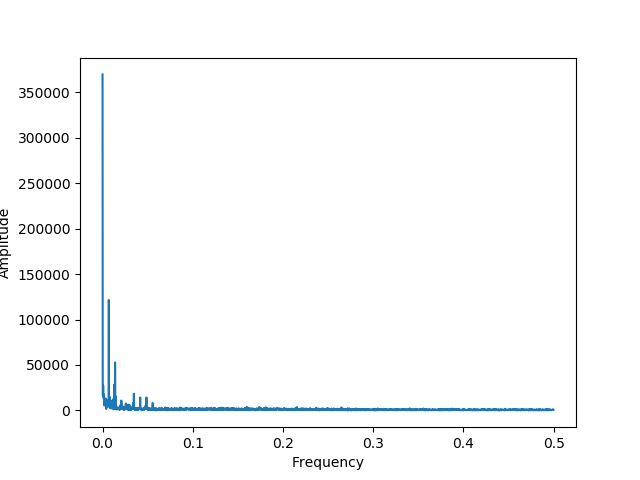

<IPython.core.display.Javascript object>


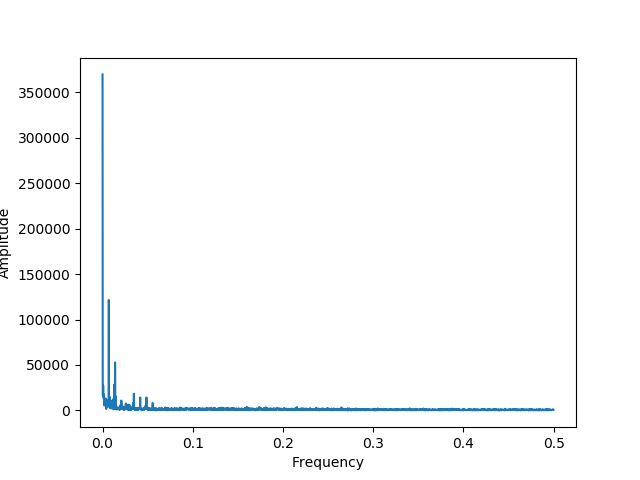

<IPython.core.display.Javascript object>


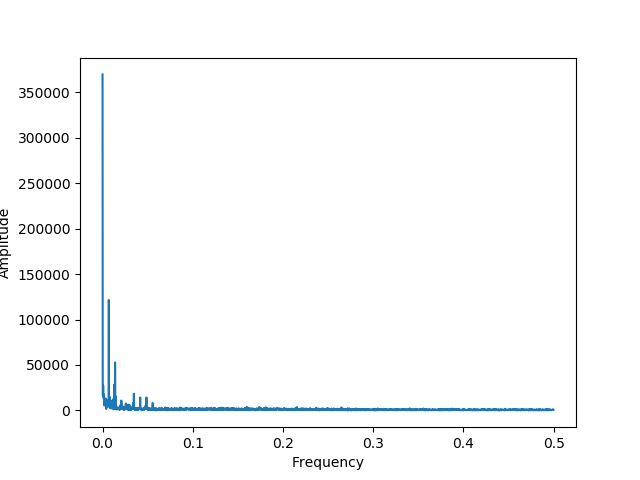

<IPython.core.display.Javascript object>


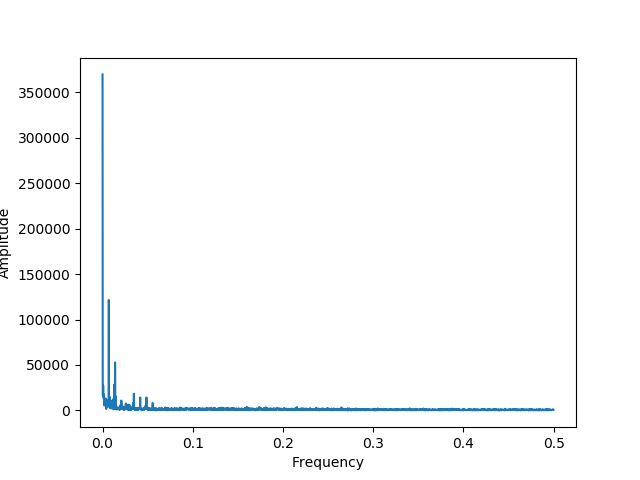

<IPython.core.display.Javascript object>


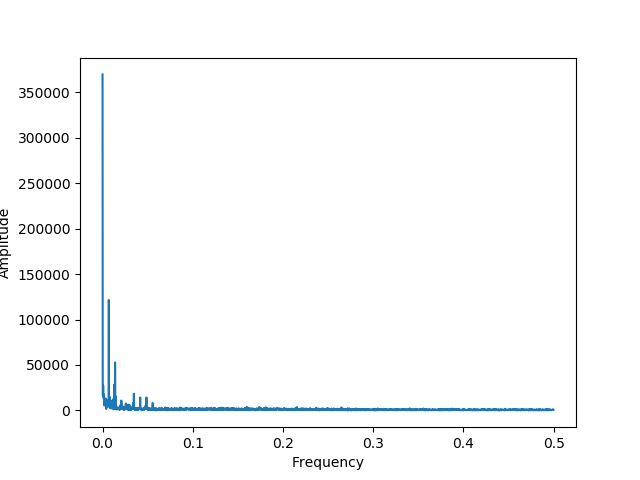

<IPython.core.display.Javascript object>


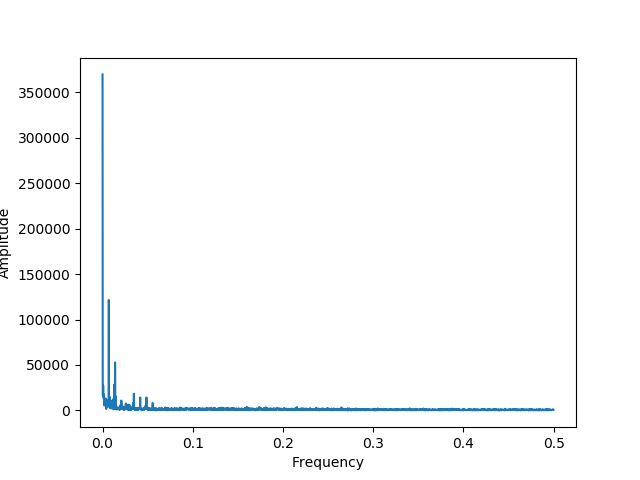

<IPython.core.display.Javascript object>


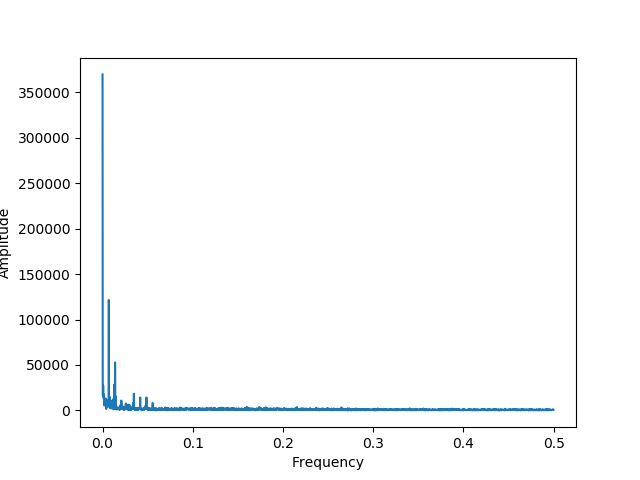

<IPython.core.display.Javascript object>


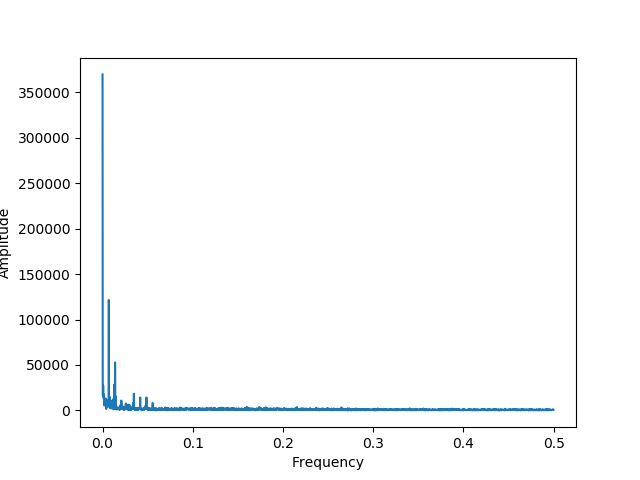

<IPython.core.display.Javascript object>


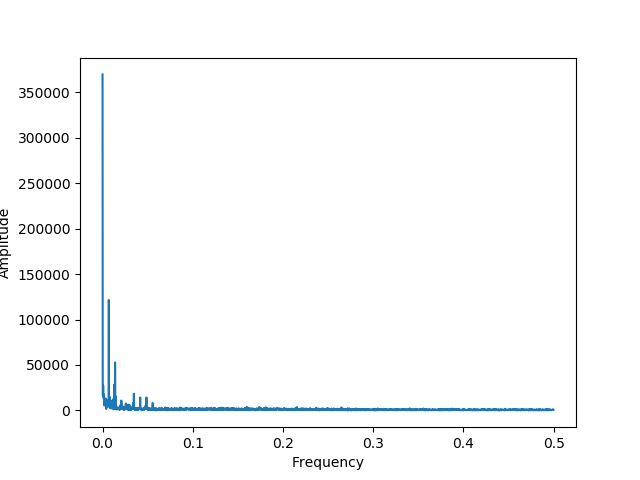

<IPython.core.display.Javascript object>


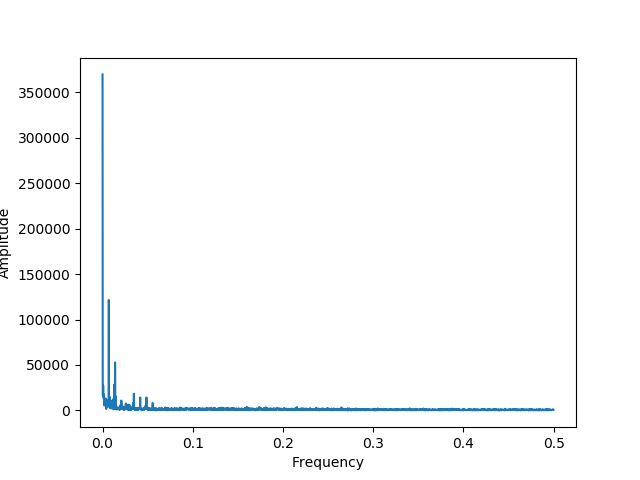

<IPython.core.display.Javascript object>


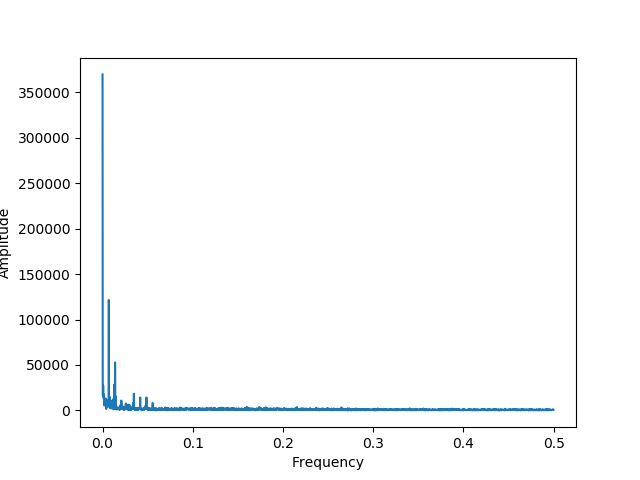

<IPython.core.display.Javascript object>


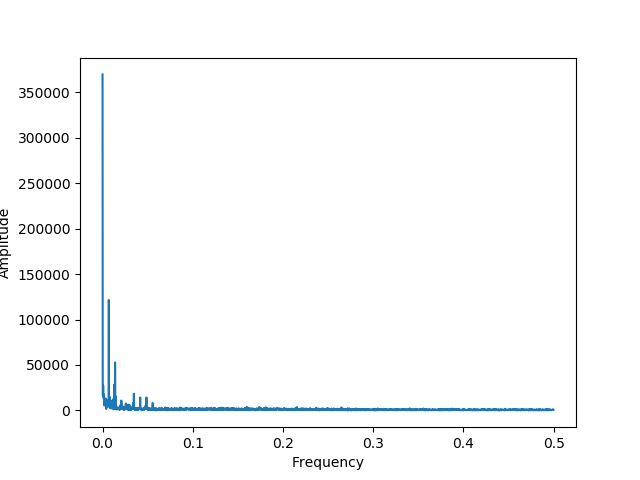

<IPython.core.display.Javascript object>


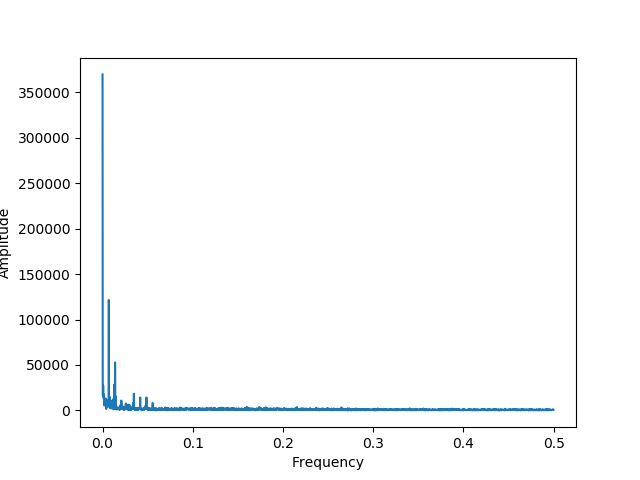

<IPython.core.display.Javascript object>


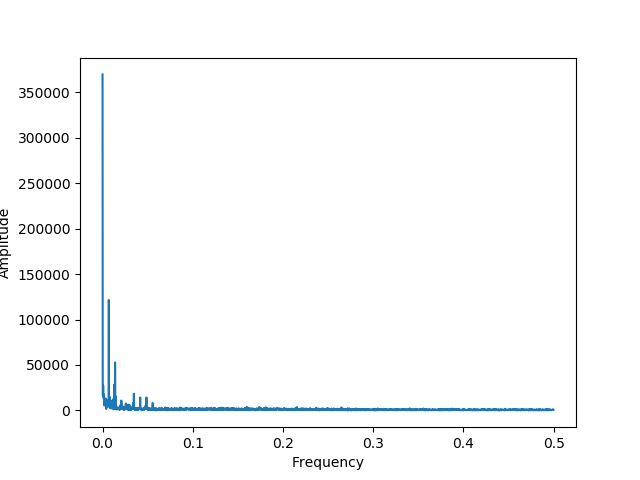

<IPython.core.display.Javascript object>


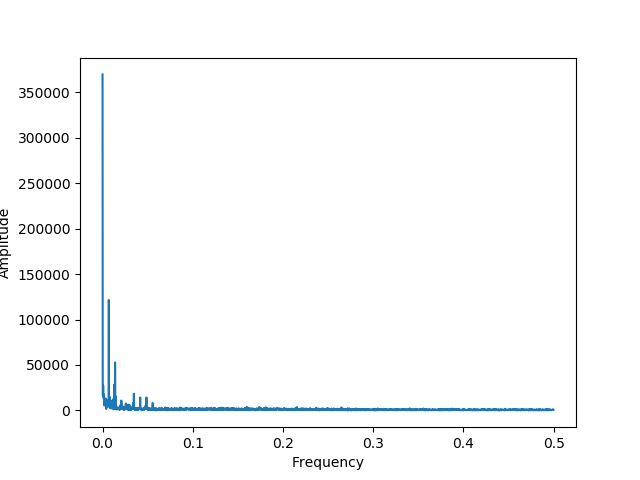

<IPython.core.display.Javascript object>


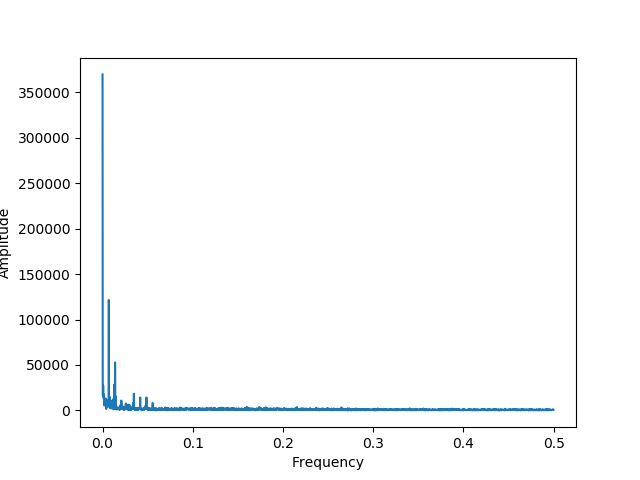

<IPython.core.display.Javascript object>


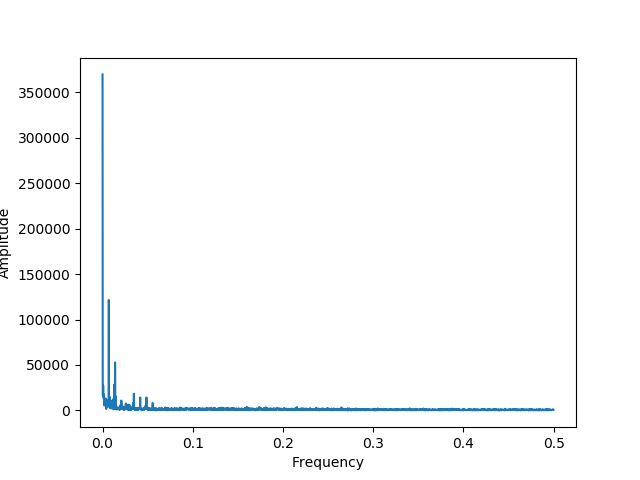

<IPython.core.display.Javascript object>


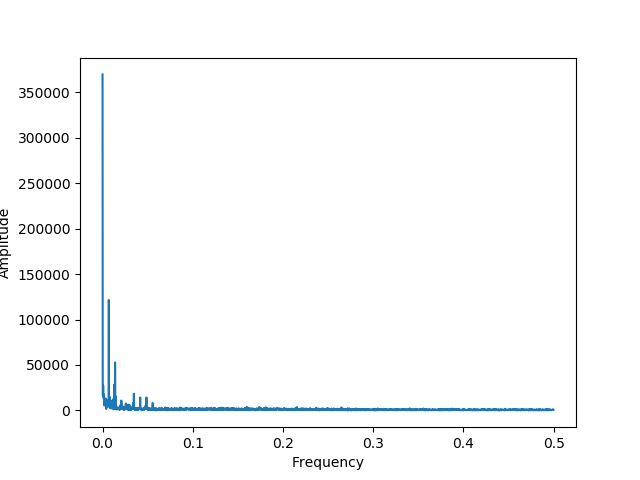

<IPython.core.display.Javascript object>


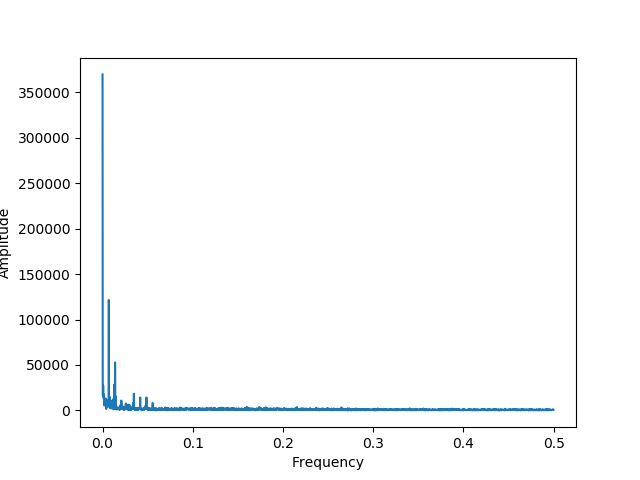

<IPython.core.display.Javascript object>


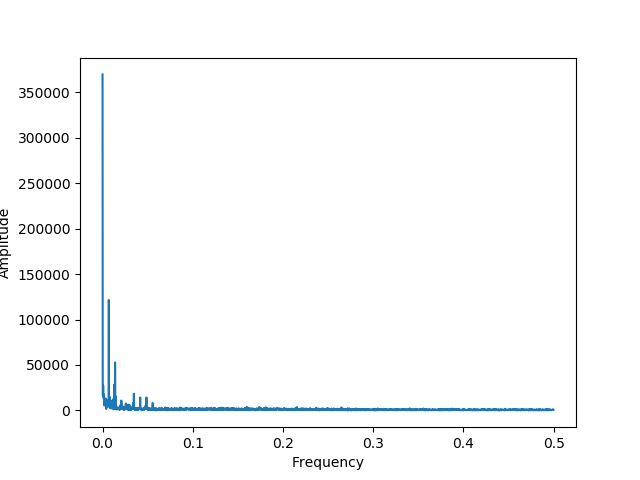

<IPython.core.display.Javascript object>


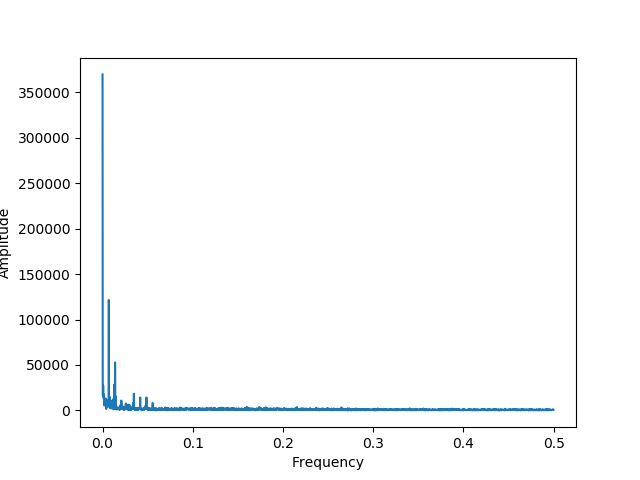

<IPython.core.display.Javascript object>


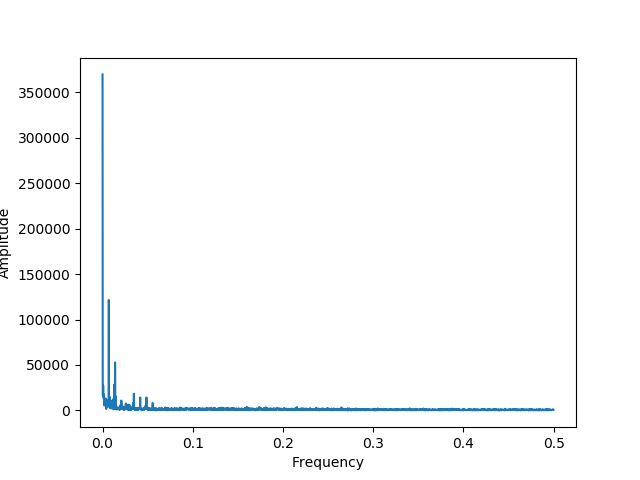

<IPython.core.display.Javascript object>


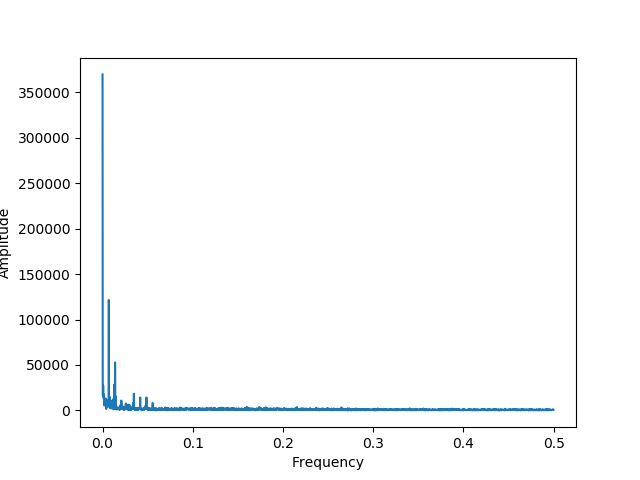

<IPython.core.display.Javascript object>


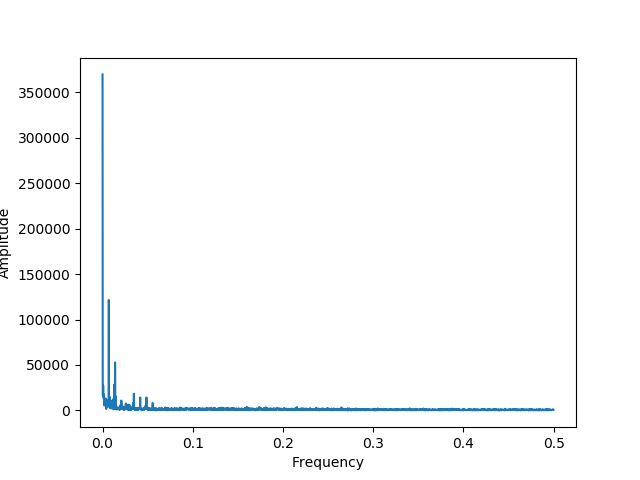

<IPython.core.display.Javascript object>


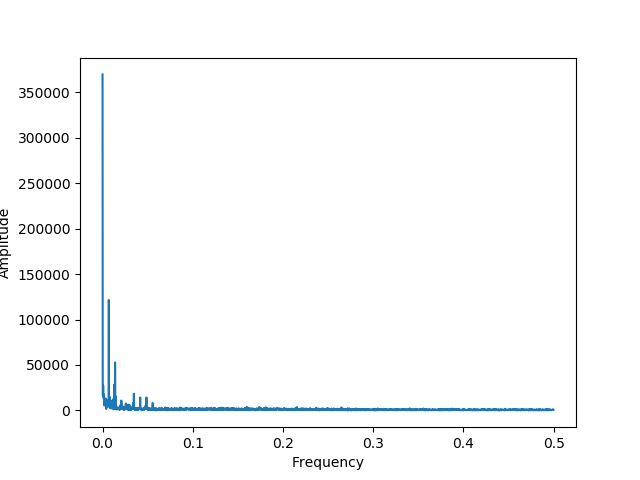

<IPython.core.display.Javascript object>


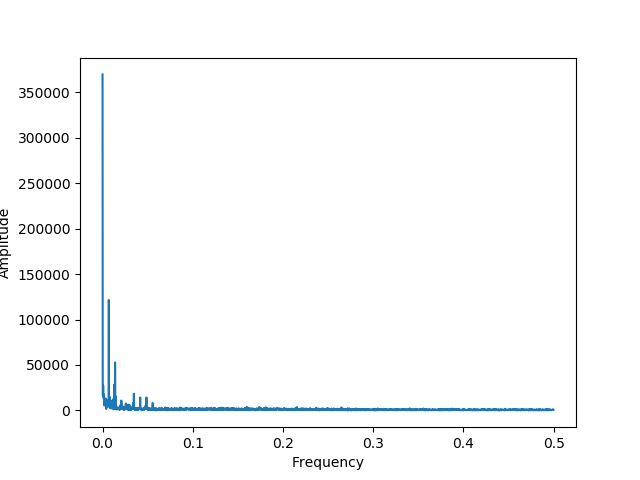

<IPython.core.display.Javascript object>


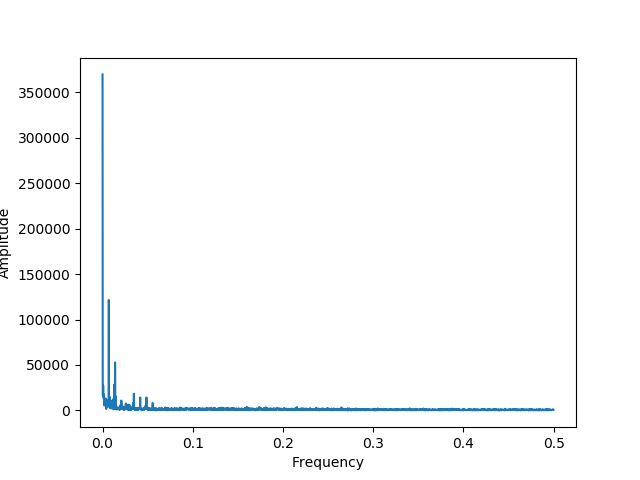

<IPython.core.display.Javascript object>


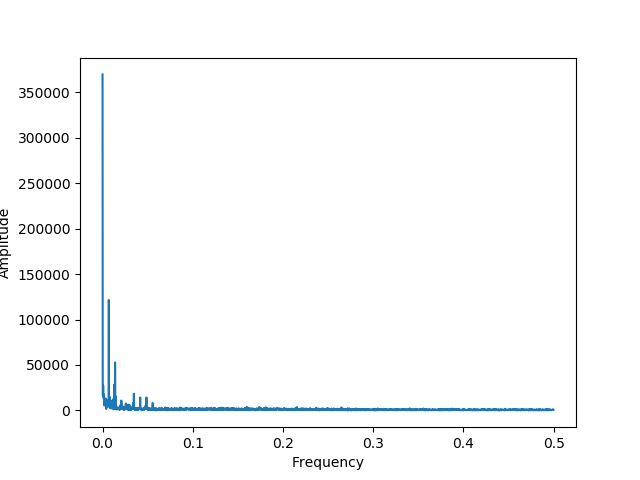

<IPython.core.display.Javascript object>


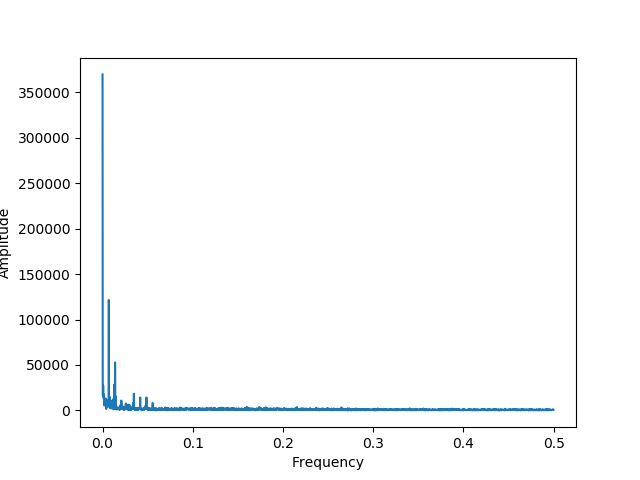

<IPython.core.display.Javascript object>


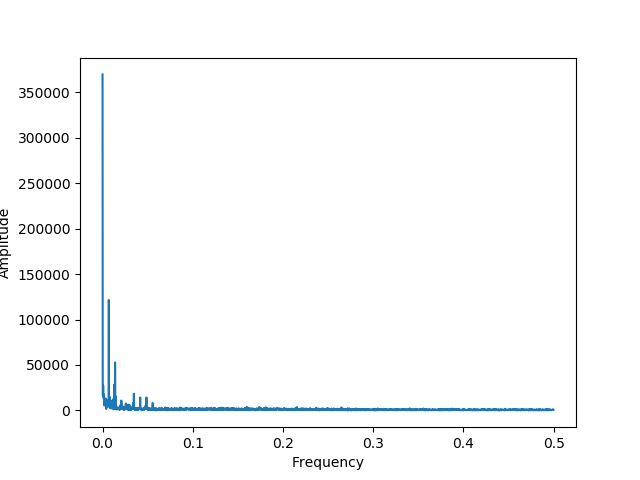

<IPython.core.display.Javascript object>


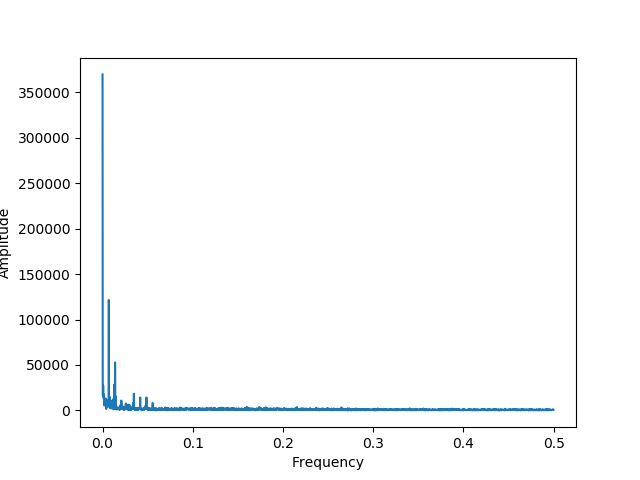

<IPython.core.display.Javascript object>


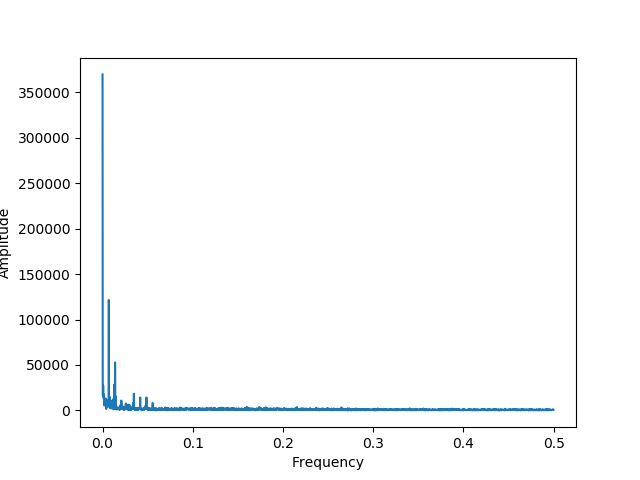

<IPython.core.display.Javascript object>


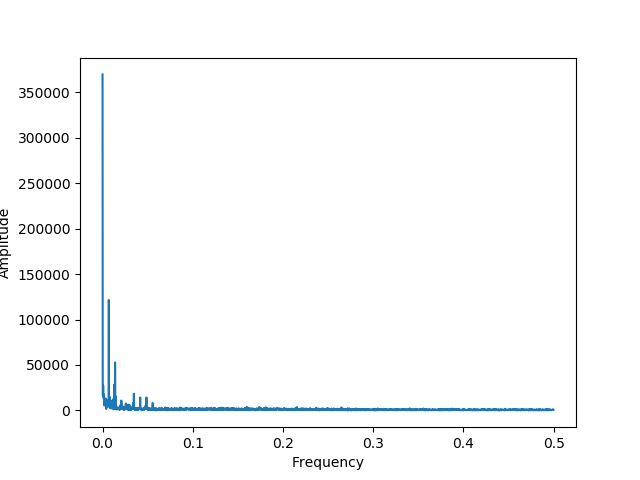

<IPython.core.display.Javascript object>


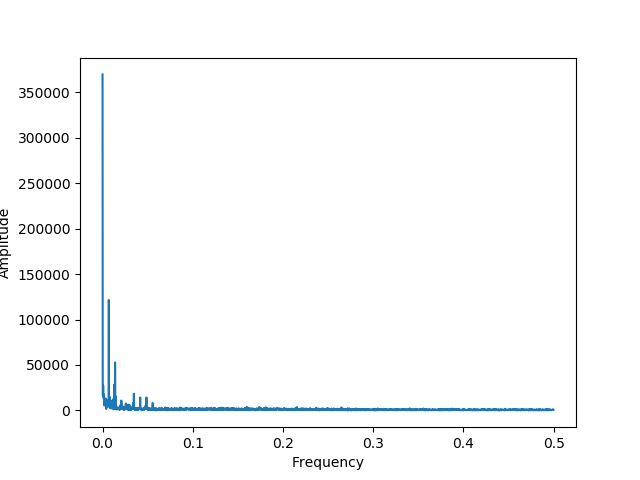

<IPython.core.display.Javascript object>


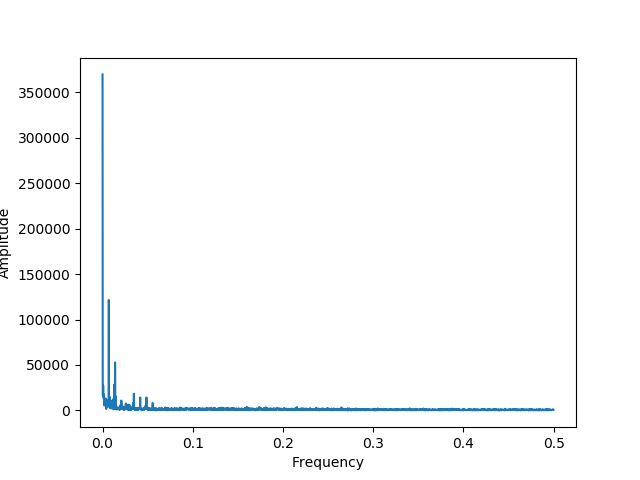

<IPython.core.display.Javascript object>


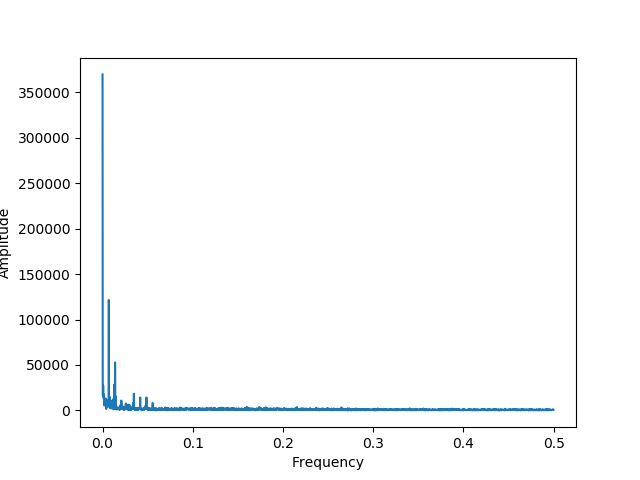

<IPython.core.display.Javascript object>


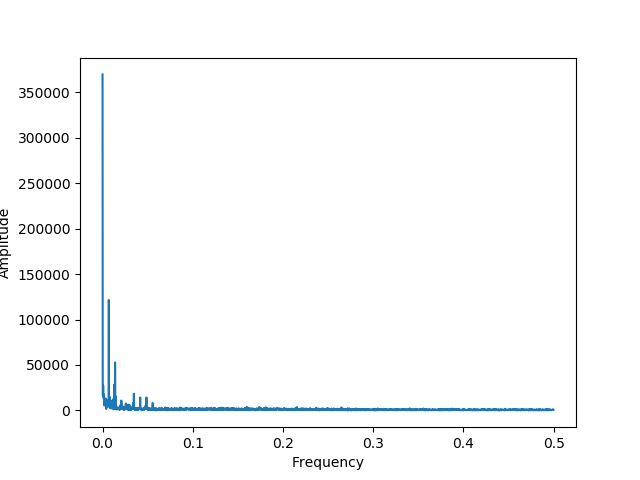

<IPython.core.display.Javascript object>


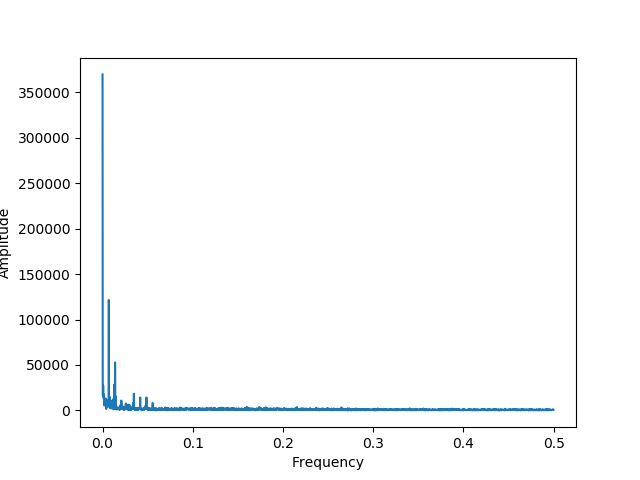

<IPython.core.display.Javascript object>


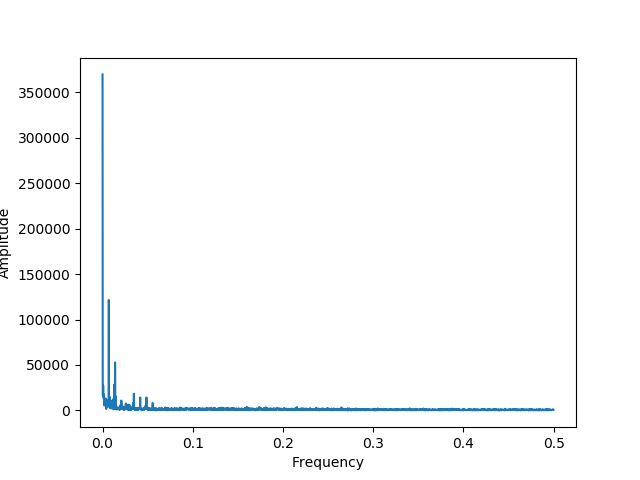

<IPython.core.display.Javascript object>


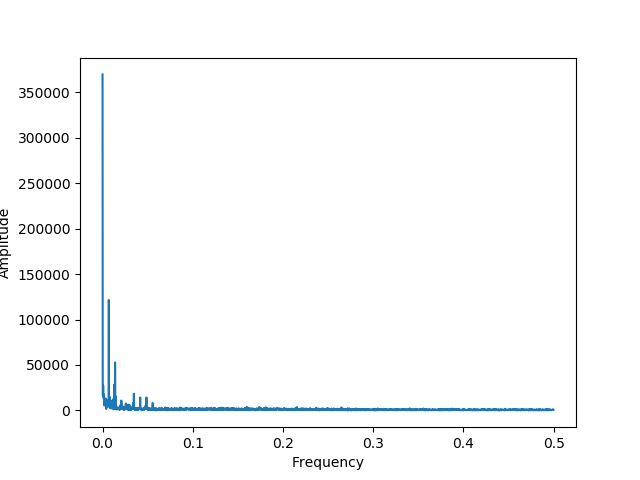

In [30]:
%matplotlib notebook
for i in range(40):
    Y=np.fft.fft(np.array(jan_2016_smooth)[0:4460]) 
    freq = np.fft.fftfreq(4460, 1)
    n = len(freq)
    plt.figure()
    plt.plot( freq[:int(n/2)], np.abs(Y)[:int(n/2)] )
    plt.xlabel("Frequency")
    plt.ylabel("Amplitude")
    plt.show()

In [31]:
"""In this function we will first get the fourier features for each cluster. We will get the fourier frequencies and their correspodning amplitudes,
sort them in decreasing order of importance and take the 5 most relevant amplitudes and frequencies. We will use these 10 values as features. For each 
cluster region we will look at the monthly patterns. The amplitude and frequency will be same for all pickup points belonging to the same region for 
a same given month."""

def get_fourier_feats():
    fourier_features=[]
    fourier_df=pd.DataFrame(columns=["Amplitude1","Amplitude2","Amplitude3","Amplitude4","Amplitude5","Freq1","Freq2","Freq3","Freq4","Freq5"])
    jan_df=pd.DataFrame(columns=["Amplitude1","Amplitude2","Amplitude3","Amplitude4","Amplitude5","Freq1","Freq2","Freq3","Freq4","Freq5"])
    feb_df=pd.DataFrame(columns=["Amplitude1","Amplitude2","Amplitude3","Amplitude4","Amplitude5","Freq1","Freq2","Freq3","Freq4","Freq5"])
    mar_df=pd.DataFrame(columns=["Amplitude1","Amplitude2","Amplitude3","Amplitude4","Amplitude5","Freq1","Freq2","Freq3","Freq4","Freq5"])
    
    for k in range(40):
        #For each month, we get the top 5 freqs and amplitudes and concatenate them into one single array.
        jan_data=regions_cum[k][0:4464]
        jan_data_fft_amp=sorted(np.fft.fft(jan_data),reverse=True)[0:5]
        jan_data_fft_freq=sorted(np.fft.fftfreq(4464,1),reverse=True)[0:5]
        jan_array=np.concatenate([jan_data_fft_amp,jan_data_fft_freq]) #Contains top 5 amp and freq data for Jan

        feb_data=regions_cum[k][4464:8640]
        feb_data_fft_amp=sorted(np.fft.fft(feb_data),reverse=True)[0:5] #Get amplitudes after fourier transform
        feb_data_fft_freq=sorted(np.fft.fftfreq(4176,1),reverse=True)[0:5] #Get frequencies after fourier transform 
        feb_array=np.concatenate([feb_data_fft_amp,feb_data_fft_freq]) #Contains top 5 amp and freq data for Feb

        mar_data=regions_cum[k][8640:]
        mar_data_fft_amp=sorted(np.fft.fft(mar_data),reverse=True)[0:5]
        mar_data_fft_freq=sorted(np.fft.fftfreq(4464,1),reverse=True)[0:5]
        mar_array=np.concatenate([mar_data_fft_amp,mar_data_fft_freq]) #Contains top 5 amp and freq data for Mar
        
        #For each month the FFT features will be the same for all datapoints belonging to that given month.
        #We will just create 3 dataframes corresponding to jan, feb, march each of the mentioned sizes.
        #Finally we will construct a dataframe which contains only the fourier features.
        for i in range(10):
            jan_df[jan_df.columns[i]]=[jan_array[i]]*4464
            feb_df[feb_df.columns[i]]=[feb_array[i]]*4176
            mar_df[mar_df.columns[i]]=[mar_array[i]]*4464
            
        
        fourier_df=pd.concat([jan_df,feb_df,mar_df],ignore_index=True)
        fourier_features.append(fourier_df)

    return fourier_features

In [32]:
#Here we will construct a final fourier features dataframe. We will merge this dataframe with our training data and use it for feature engineering.
fourier_features_df=pd.DataFrame(columns=["Amplitude1","Amplitude2","Amplitude3","Amplitude4","Amplitude5","Freq1","Freq2","Freq3","Freq4","Freq5"])
fourier_features=get_fourier_feats()

fourier_features_df = fourier_features[0]

for i in range(1, len(fourier_features)):
    fourier_features_df = pd.concat([fourier_features_df, fourier_features[i]], ignore_index=True)
    
fourier_features_df = fourier_features_df.fillna(0)
fourier_features_df = fourier_features_df.astype(np.float)
print("Shape of the fourier transformed features for all regions:", fourier_features_df.shape)
fourier_features_df.head()

Shape of the fourier transformed features for all regions: (524160, 10)


,Amplitude1,Amplitude2,Amplitude3,Amplitude4,Amplitude5,Freq1,Freq2,Freq3,Freq4,Freq5
0,369774.0,24998.122651,24998.122651,15434.851794,15434.851794,0.499776,0.499552,0.499328,0.499104,0.49888
1,369774.0,24998.122651,24998.122651,15434.851794,15434.851794,0.499776,0.499552,0.499328,0.499104,0.49888
2,369774.0,24998.122651,24998.122651,15434.851794,15434.851794,0.499776,0.499552,0.499328,0.499104,0.49888
3,369774.0,24998.122651,24998.122651,15434.851794,15434.851794,0.499776,0.499552,0.499328,0.499104,0.49888
4,369774.0,24998.122651,24998.122651,15434.851794,15434.851794,0.499776,0.499552,0.499328,0.499104,0.49888


In [33]:
#Splitting the fouriers features df into train and test such that every region will contain 70% points in the train data and 30% in test data.
#Split just like the way shown above in the tsne feature extraction part.

fourier_train_df = pd.DataFrame(columns=["Amplitude1","Amplitude2","Amplitude3","Amplitude4","Amplitude5","Freq1","Freq2","Freq3","Freq4","Freq5"])
fourier_test_df = pd.DataFrame(columns=["Amplitude1","Amplitude2","Amplitude3","Amplitude4","Amplitude5","Freq1","Freq2","Freq3","Freq4","Freq5"])

#Train data
for i in range(40):
    fourier_train_df = fourier_train_df.append(fourier_features_df[i*13099 : 13099*i + 9169])

#Test data
for i in range(40):
    fourier_test_df = fourier_test_df.append(fourier_features_df[i*13099 + 9169 : 13099*(i+1)])

#Reset all the indexes in train and test data
fourier_train_df.reset_index(inplace=True)
fourier_test_df.reset_index(inplace = True)

fourier_train_df=fourier_train_df.drop(labels="index", axis=1)
fourier_test_df=fourier_test_df.drop(labels="index", axis=1)

print("Shape of the fourier transformed train dataframe: ",fourier_train_df.shape)
print("Shape of the fourier transformed test dataframe: ",fourier_test_df.shape)
fourier_test_df.head()

Shape of the fourier transformed train dataframe:  (366760, 10)
Shape of the fourier transformed test dataframe:  (157200, 10)


,Amplitude1,Amplitude2,Amplitude3,Amplitude4,Amplitude5,Freq1,Freq2,Freq3,Freq4,Freq5
0,391598.0,10930.478599,10930.478599,10662.395979,10662.395979,0.499776,0.499552,0.499328,0.499104,0.49888
1,391598.0,10930.478599,10930.478599,10662.395979,10662.395979,0.499776,0.499552,0.499328,0.499104,0.49888
2,391598.0,10930.478599,10930.478599,10662.395979,10662.395979,0.499776,0.499552,0.499328,0.499104,0.49888
3,391598.0,10930.478599,10930.478599,10662.395979,10662.395979,0.499776,0.499552,0.499328,0.499104,0.49888
4,391598.0,10930.478599,10930.478599,10662.395979,10662.395979,0.499776,0.499552,0.499328,0.499104,0.49888


## Feature Engineering Section 2: 

## Assignment Task 2: Incorporating Double + Tripple Exponential Smoothing

I have referred to these awesome blogs related to time series features.
1. https://machinelearningmastery.com/time-series-forecasting-methods-in-python-cheat-sheet/
2. https://grisha.org/blog/2016/02/17/triple-exponential-smoothing-forecasting-part-ii/
3. https://medium.com/datadriveninvestor/how-to-build-exponential-smoothing-models-using-python-simple-exponential-smoothing-holt-and-da371189e1a1

### Double Exponential Smoothing

<b>Double exponential smoothing</b> is applying exponential smoothing to level and trends. The code references is used from the above link.

The code is used from: https://grisha.org/blog/2016/02/16/triple-exponential-smoothing-forecasting-part-ii/

In [96]:
result = []
def double_exponential_smoothing(series, alpha, beta):
    result = [series[0]]
    for n in range(1, len(series)):
        if n == 1:
            level, trend = series[0], series[1] - series[0]
        if n >= len(series): # we are forecasting
            value = result[-1]
        else:
            value = series[n]
        last_level, level = level, alpha*value + (1-alpha)*(level+trend)
        trend = beta*(level-last_level) + (1-beta)*trend
        result.append(level+trend)
    return result


#Holt Winters initialization of variables: # https://robjhyndman.com/hyndsight/hw-initialization/
alpha = 0.3
beta = 0.15
predict_values_two =[]
predict_list_two = []

#Prepare the features for all points for all clusters
for r in range(0,40):
    predict_values_two = double_exponential_smoothing(regions_cum[r][0:13104], alpha, beta)
    predict_list_two.append(predict_values_two[5:])

#See sample points    
predict_values_two[:10]

[0,
 105.99999999999999,
 148.99499999999998,
 187.92672499999998,
 212.45222987499994,
 225.8797329431249,
 220.6743971083718,
 208.6453141541679,
 194.82591694928757,
 174.5551726431534]

In [98]:
len(predict_list_two)

40

### Triple Exponential Smoothing

<b>Holt-Winters tripple exponential smoothing</b> is considered to be a benchmark algorithm in time series forcasting problems, particularly in problems where it has seasonal trends and variations in addition to level and trends, i.e. patterns which are very repeatative. 

<b>Season: </b> "If a series appears to be repetitive at regular intervals, such an interval is referred to as a season, and the series is said to be seasonal"

<b>Season Length: </b> "Season length is the number of data points after which a new season begins."

<b>Seasonal component: </b> "The seasonal component is an additional deviation from level + trend that repeats itself at the same offset into the season. There is a seasonal component for every point in a season, i.e. if your season length is 12, there are 12 seasonal components. We will use s to denote the seasonal component."

"The idea behind triple exponential smoothing is to apply exponential smoothing to the seasonal components in addition to level and trend. The smoothing is applied across seasons, e.g. the seasonal component of the 3rd point into the season would be exponentially smoothed with the the one from the 3rd point of last season, 3rd point two seasons ago, etc. In math notation we now have four equations." 

The code and references used are from this blog: https://grisha.org/blog/2016/02/17/triple-exponential-smoothing-forecasting-part-iii/

In [99]:
#Code from: https://grisha.org/blog/2016/02/17/triple-exponential-smoothing-forecasting-part-iii/
def initial_trend(series, slen):
    sum = 0.0
    for i in range(slen):
        sum += float(series[i+slen] - series[i]) / slen
        return sum / slen
    
def initial_seasonal_components(series, slen):
    seasonals = {}
    season_averages = []
    n_seasons = int(len(series)/slen)
    # compute season averages
    for j in range(n_seasons):
        season_averages.append(sum(series[slen*j:slen*j+slen])/float(slen))
    # compute initial values
    for i in range(slen):
        sum_of_vals_over_avg = 0.0
        for j in range(n_seasons):
            sum_of_vals_over_avg += series[slen*j+i]-season_averages[j]
        seasonals[i] = sum_of_vals_over_avg/n_seasons
    return seasonals

def triple_exponential_smoothing(series, slen, alpha, beta, gamma, n_preds):
    result = []
    seasonals = initial_seasonal_components(series, slen)
    for i in range(len(series)+n_preds):
        if i == 0: # initial values
            smooth = series[0]
            trend = initial_trend(series, slen)
            result.append(series[0])
            continue
        if i >= len(series): # we are forecasting
            m = i - len(series) + 1
            result.append((smooth + m*trend) + seasonals[i%slen])
        else:
            val = series[i]
            last_smooth, smooth = smooth, alpha*(val-seasonals[i%slen]) + (1-alpha)*(smooth+trend)
            trend = beta * (smooth-last_smooth) + (1-beta)*trend
            seasonals[i%slen] = gamma*(val-smooth) + (1-gamma)*seasonals[i%slen]
            result.append(smooth+trend+seasonals[i%slen])
    return result

#Holt Winters initialization of variables: # https://robjhyndman.com/hyndsight/hw-initialization/
alpha = 0.3
beta = 0.15
gamma = 0.2
season_len = 24

#Prepare the features for all points for all clusters
predict_values_three =[]
predict_list_three = []
for r in range(0,40):
    predict_values_three = triple_exponential_smoothing(regions_cum[r][0:13104], season_len, alpha, beta, gamma, 0)
    predict_list_three.append(predict_values_three[5:])
    
#See sample points    
predict_values_three[:10]

[0,
 26.01034836691086,
 48.79436861072954,
 79.83574205472564,
 100.02777272873792,
 114.53942428123317,
 111.52631909583715,
 108.70292997121615,
 107.0056858085368,
 96.72469419811225]

In [100]:
len(predict_values_three)

13104

<IPython.core.display.Javascript object>


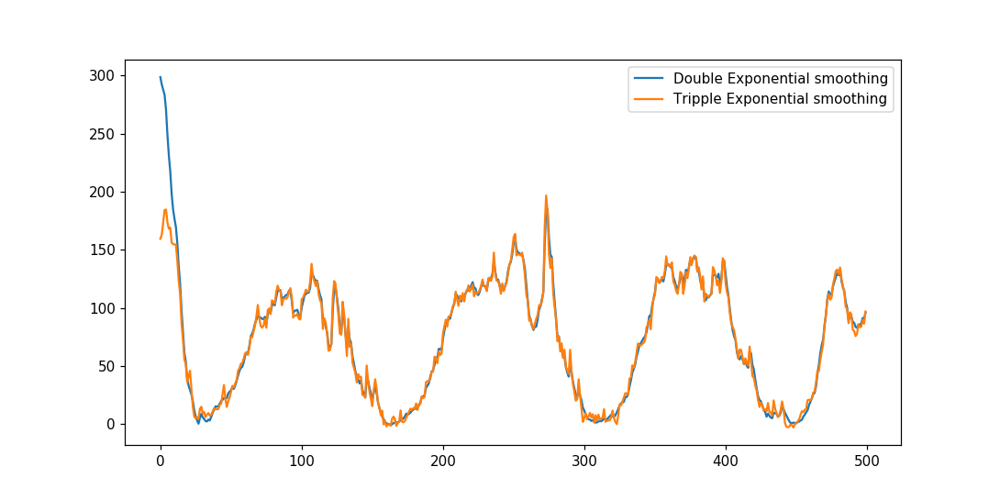

<IPython.core.display.Javascript object>


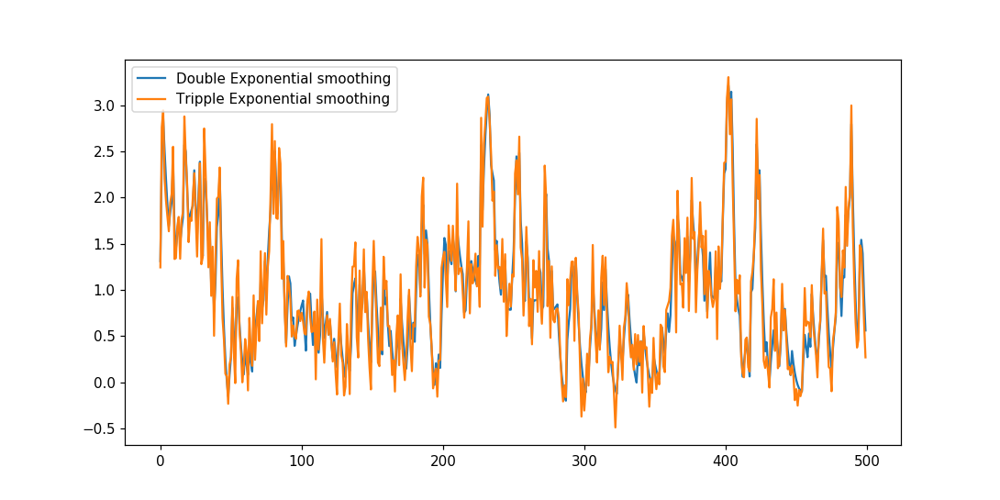

<IPython.core.display.Javascript object>


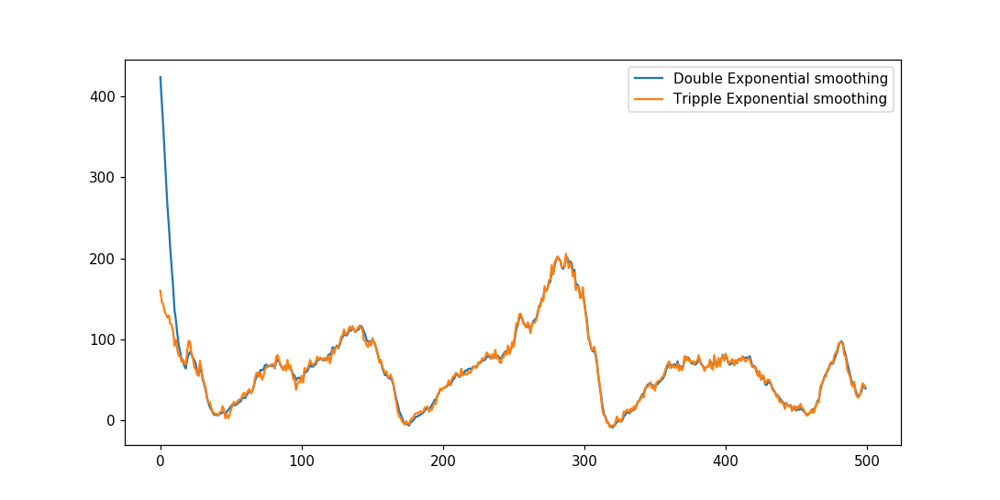

<IPython.core.display.Javascript object>


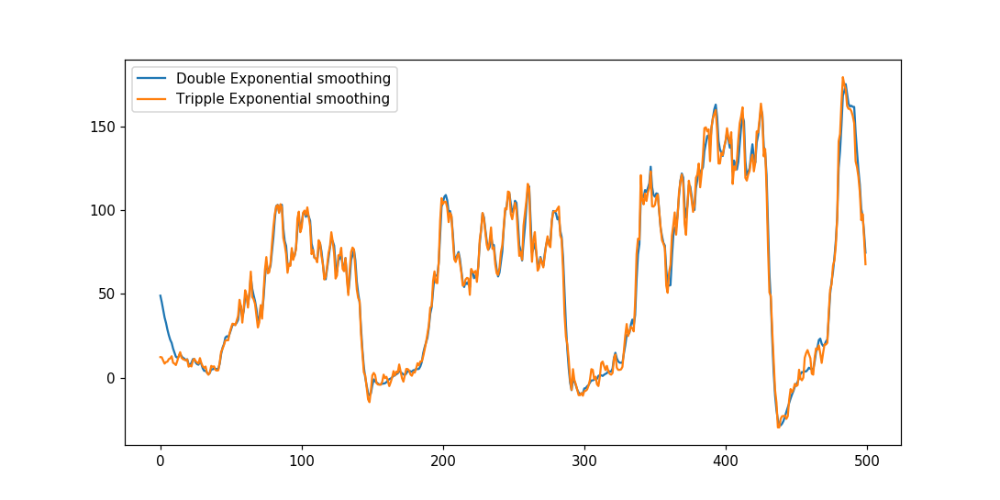

<IPython.core.display.Javascript object>


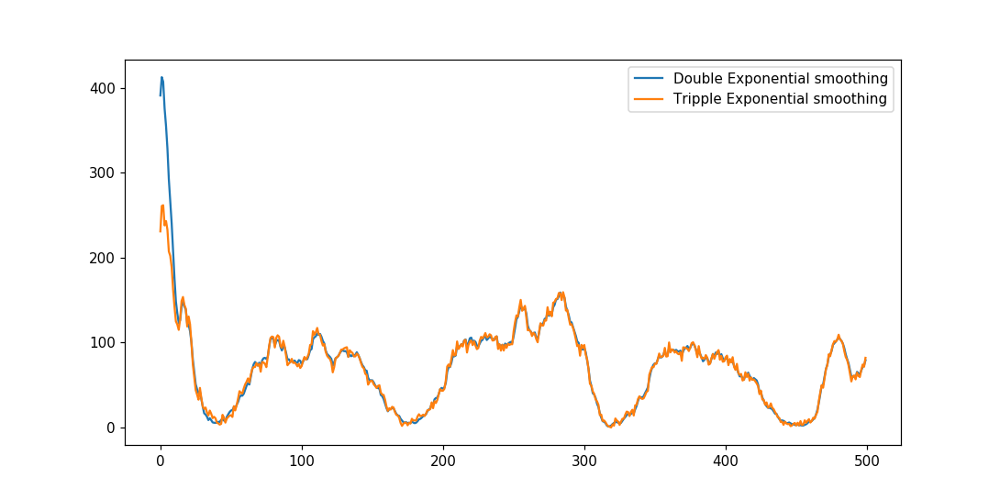

<IPython.core.display.Javascript object>


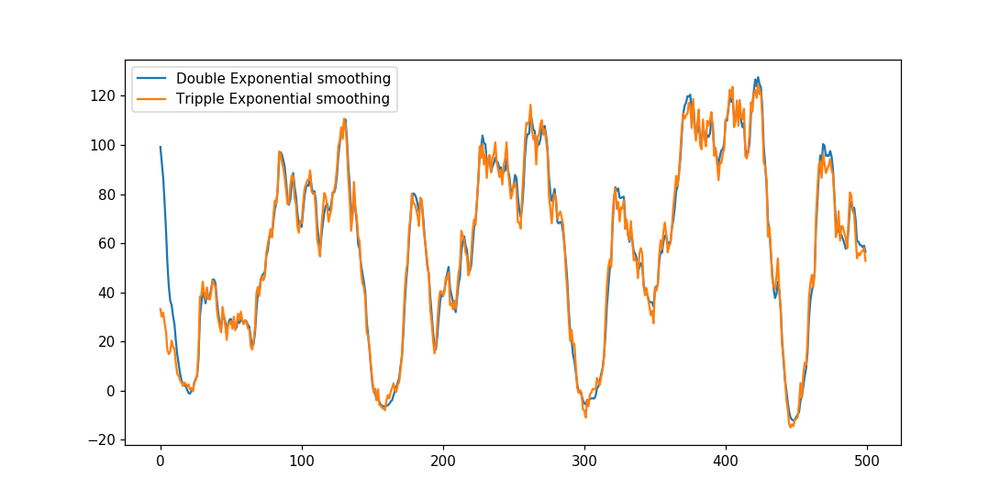

<IPython.core.display.Javascript object>


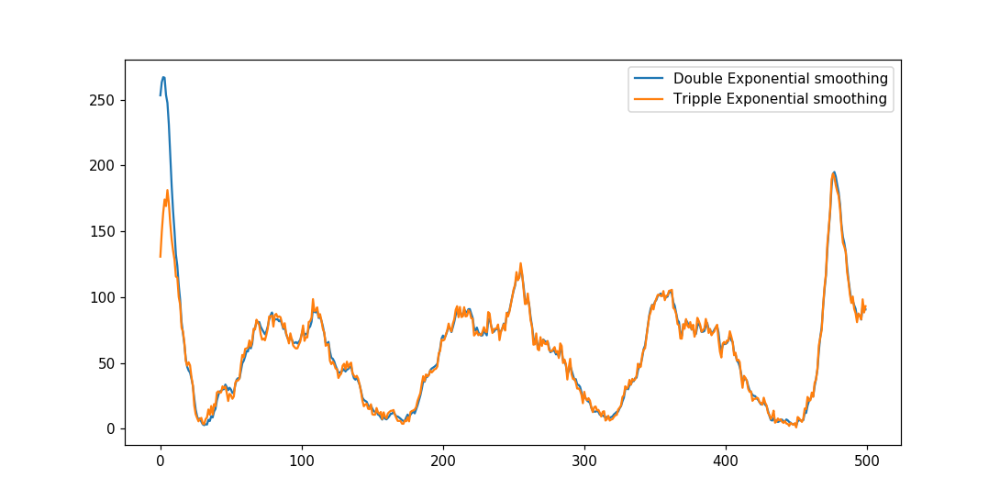

<IPython.core.display.Javascript object>


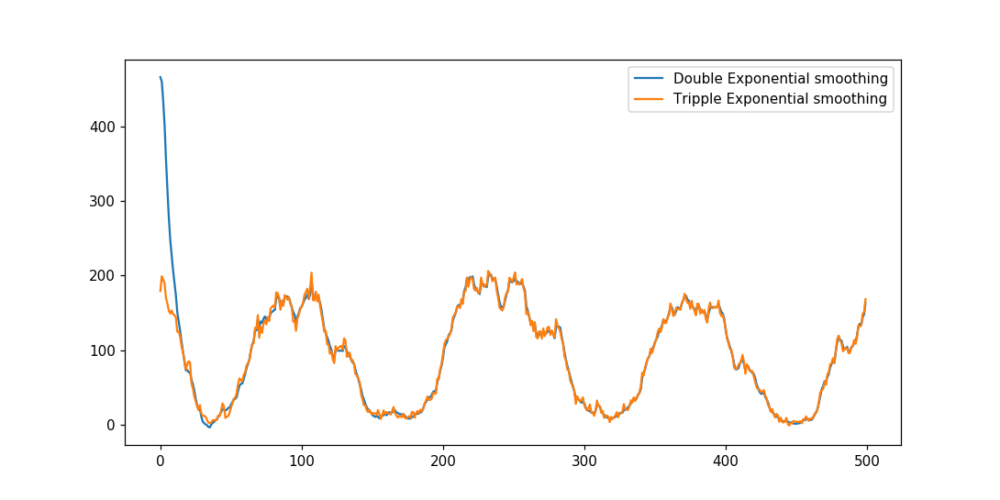

<IPython.core.display.Javascript object>


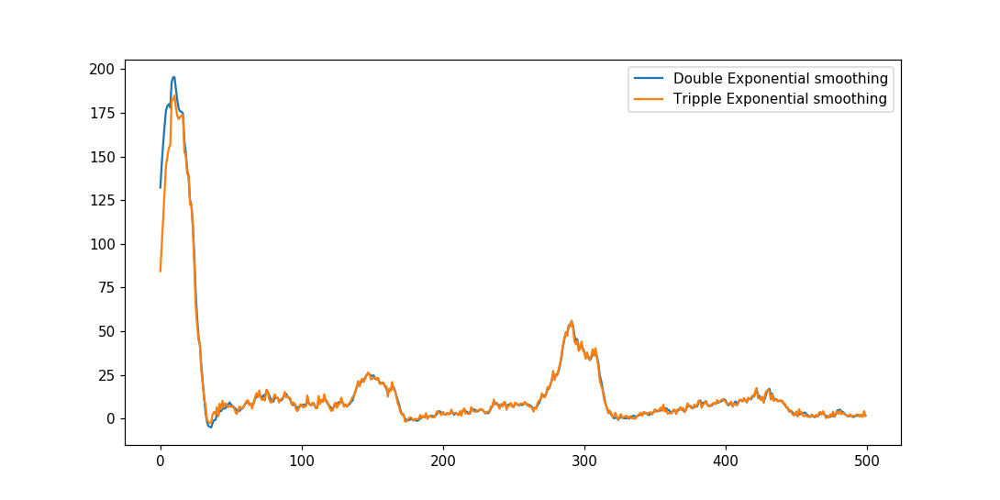

<IPython.core.display.Javascript object>


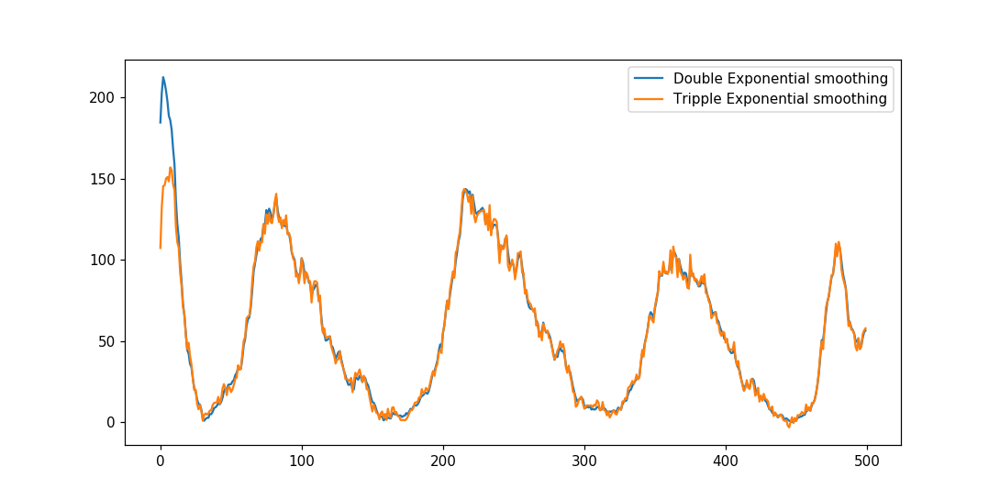

<IPython.core.display.Javascript object>


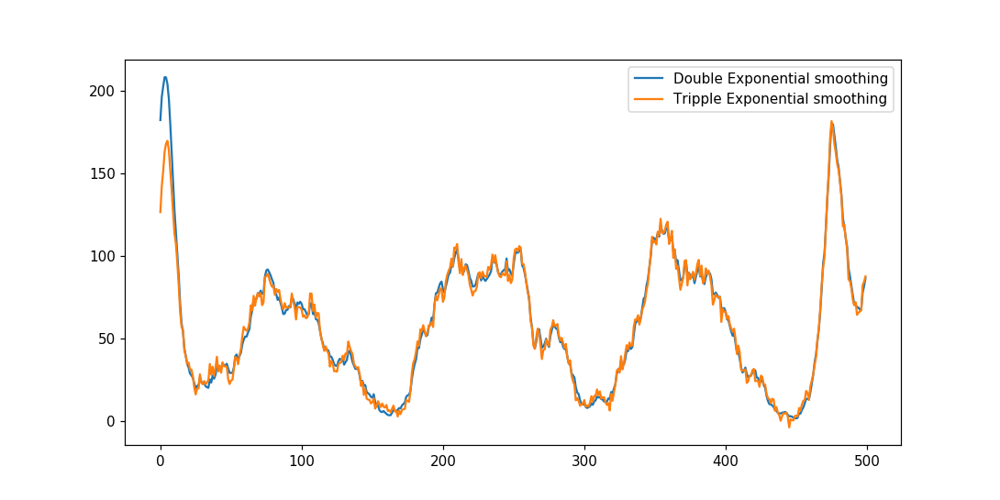

<IPython.core.display.Javascript object>


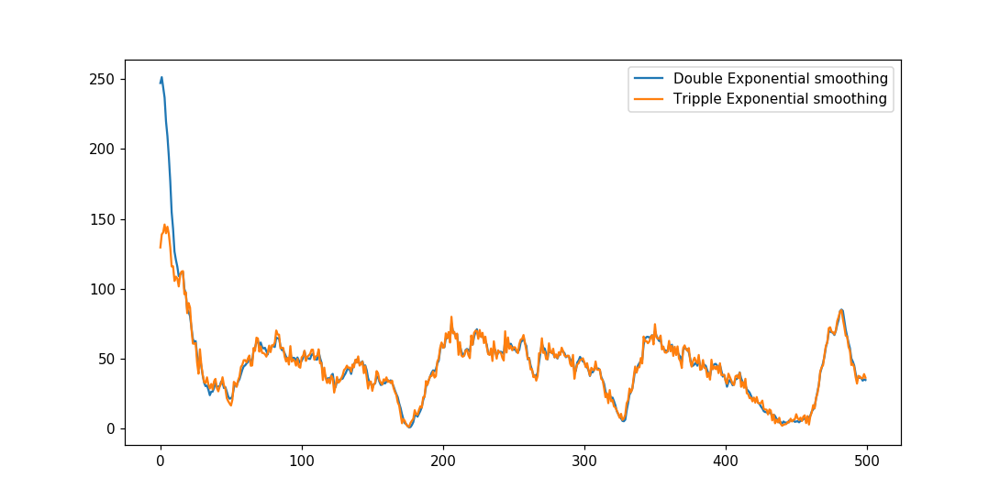

<IPython.core.display.Javascript object>


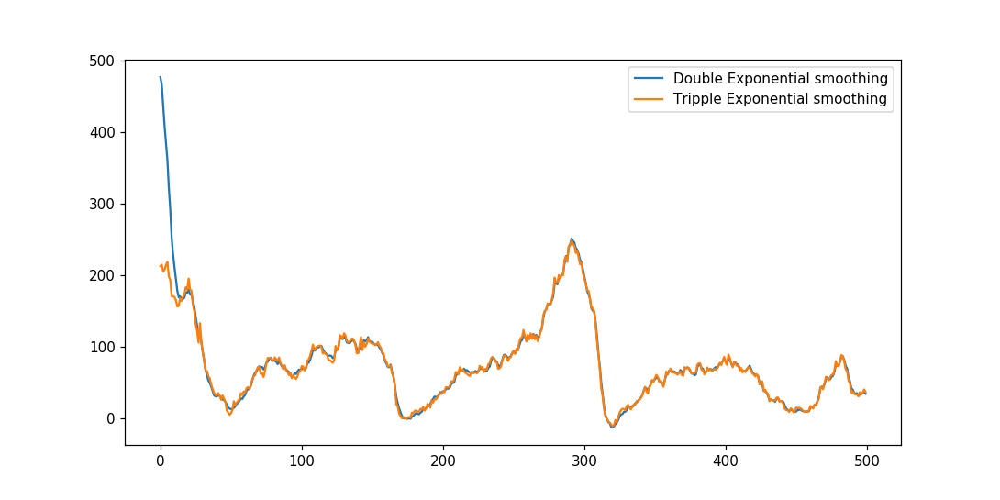

<IPython.core.display.Javascript object>


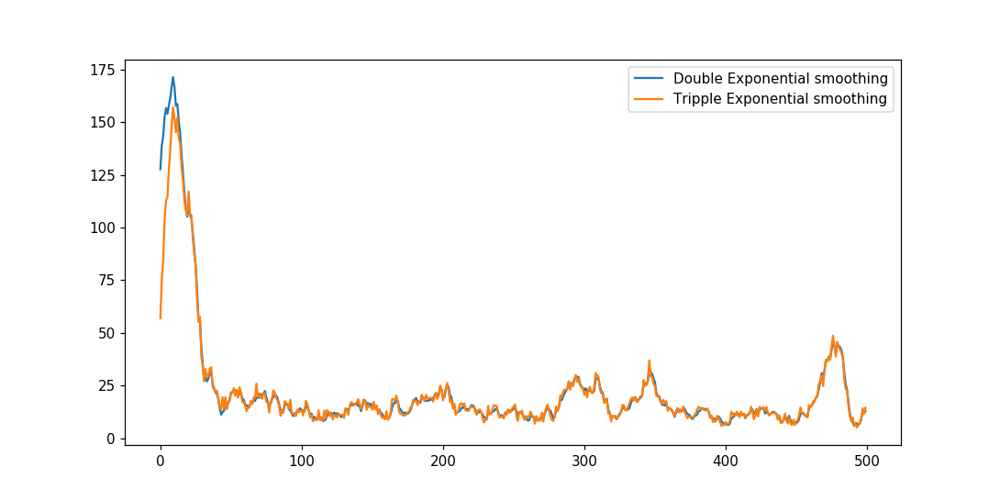

<IPython.core.display.Javascript object>


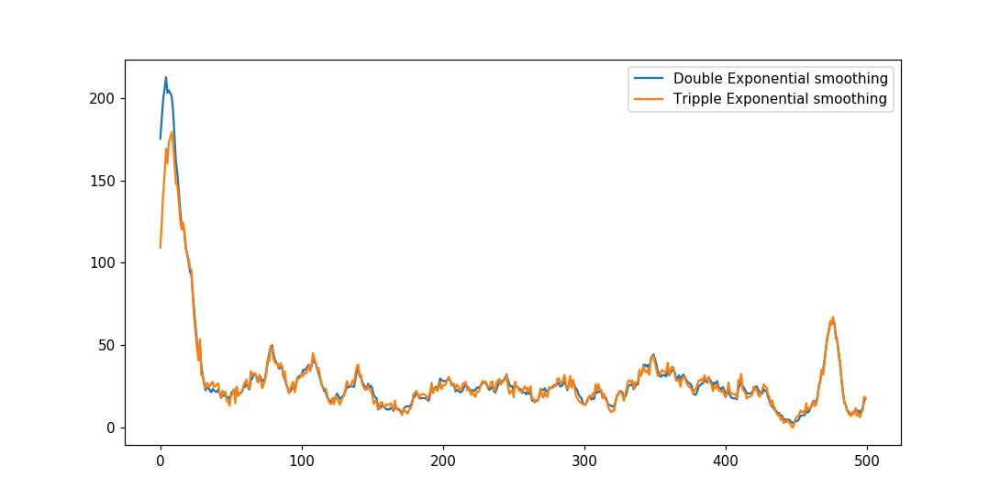

<IPython.core.display.Javascript object>


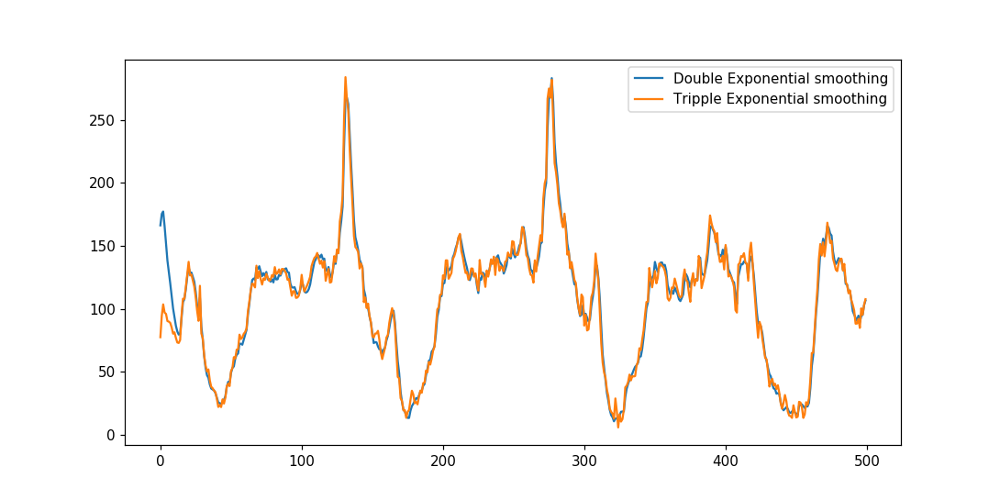

<IPython.core.display.Javascript object>


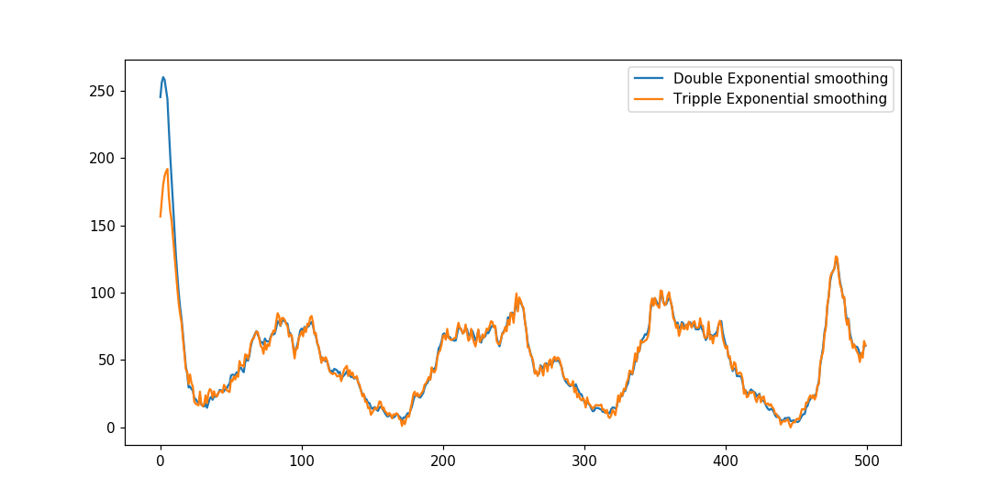

<IPython.core.display.Javascript object>


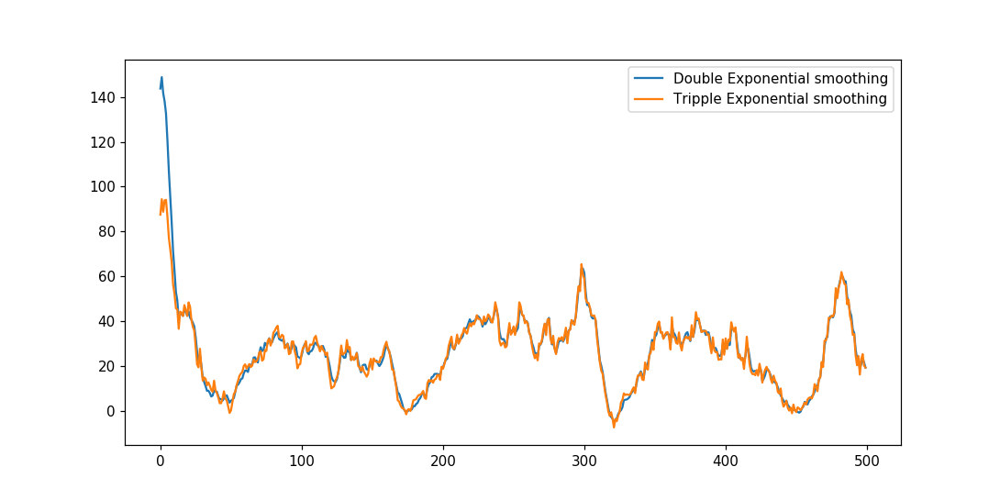

<IPython.core.display.Javascript object>


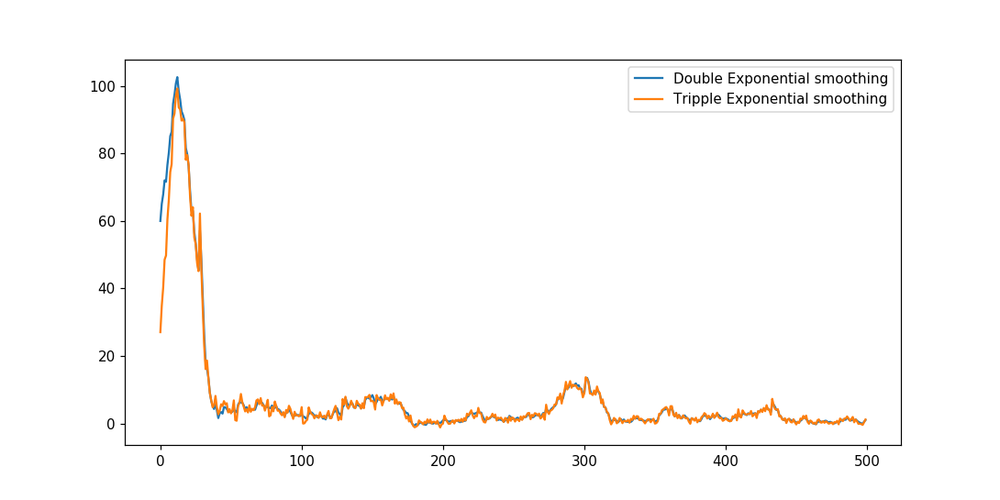

<IPython.core.display.Javascript object>


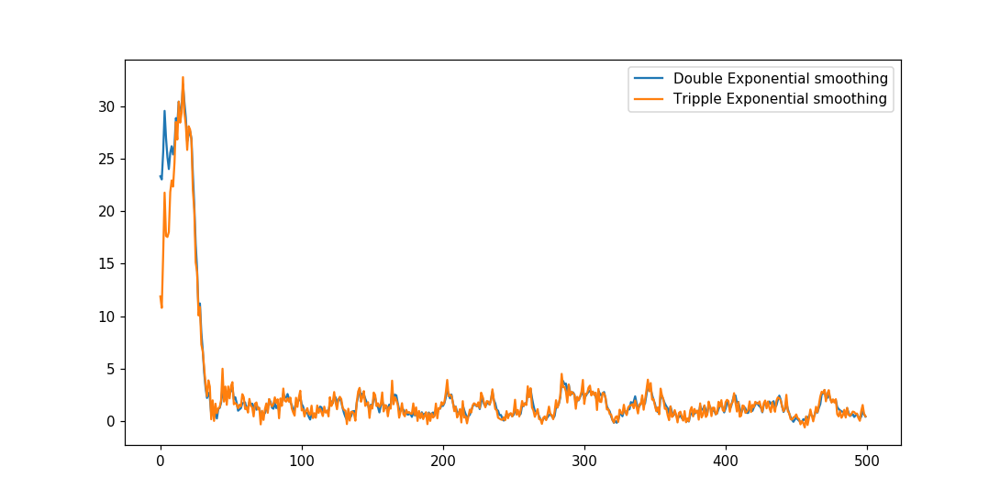

<IPython.core.display.Javascript object>


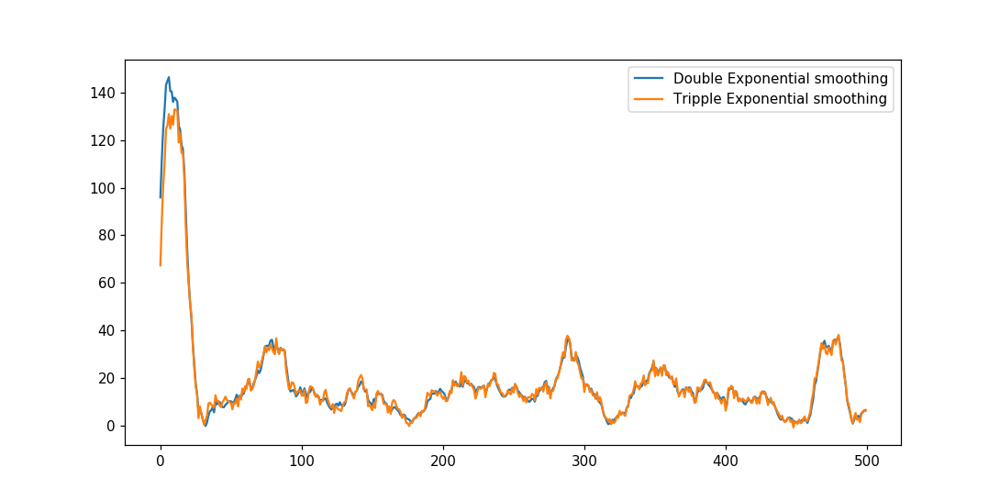

<IPython.core.display.Javascript object>


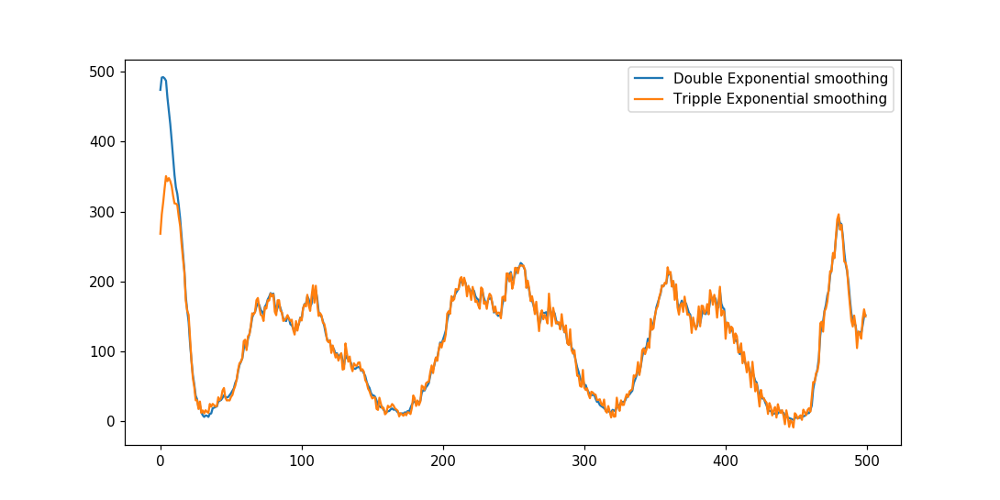

<IPython.core.display.Javascript object>


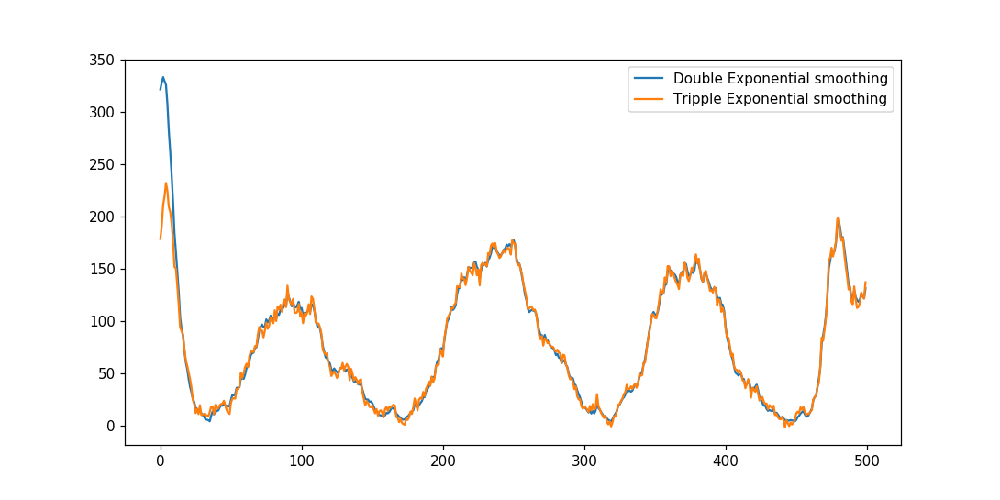

<IPython.core.display.Javascript object>


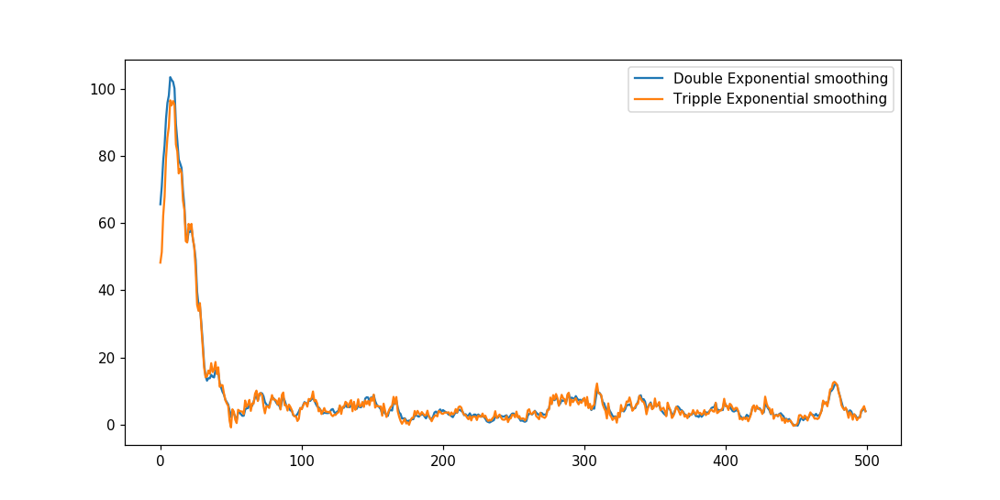

<IPython.core.display.Javascript object>


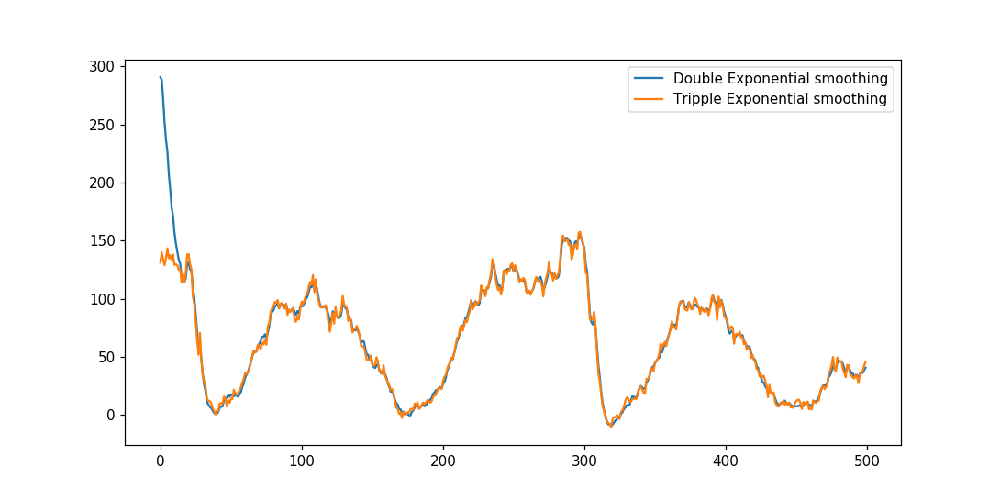

<IPython.core.display.Javascript object>


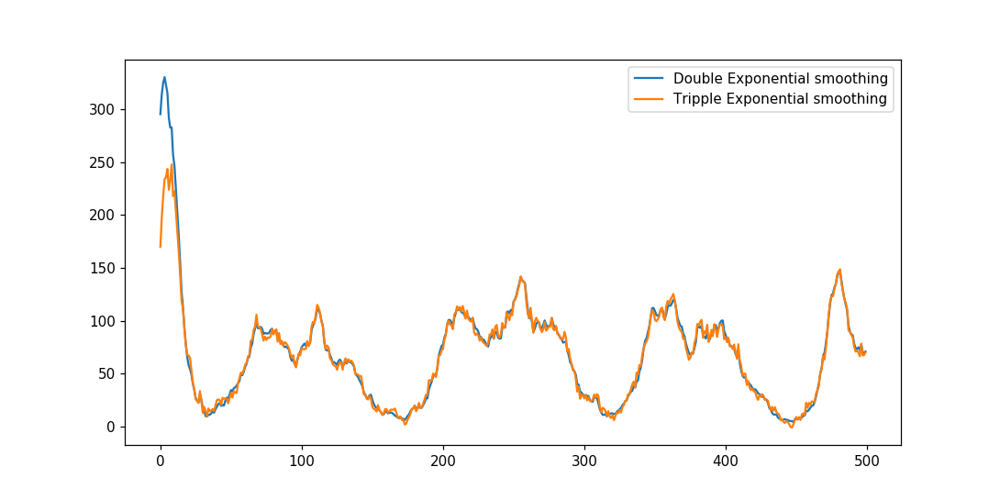

<IPython.core.display.Javascript object>


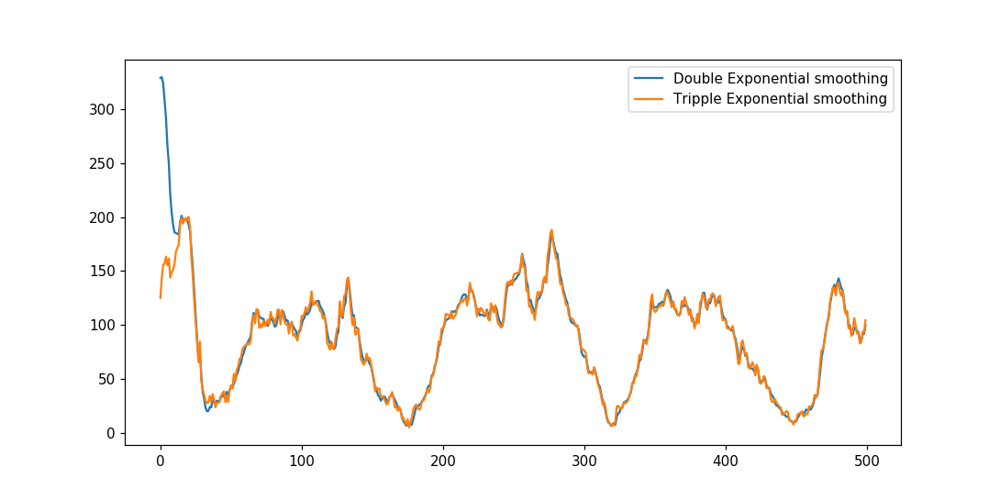

<IPython.core.display.Javascript object>


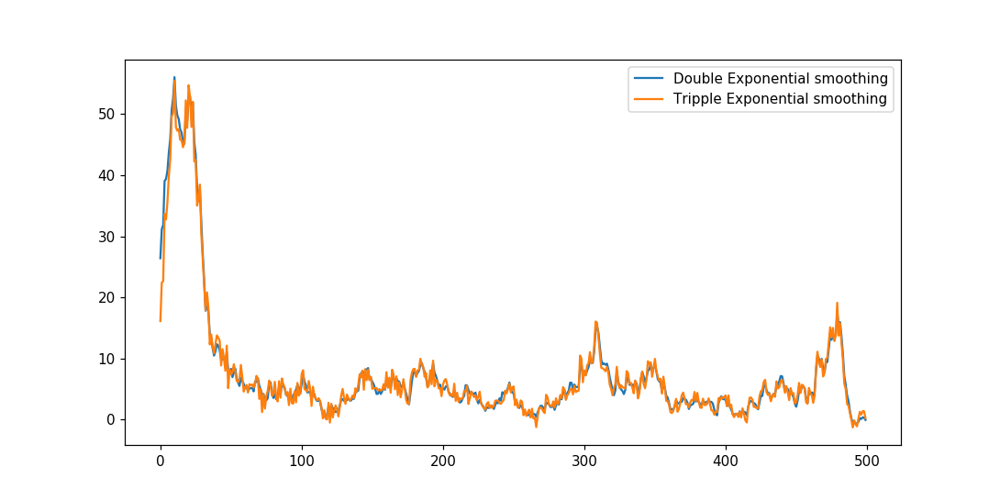

<IPython.core.display.Javascript object>


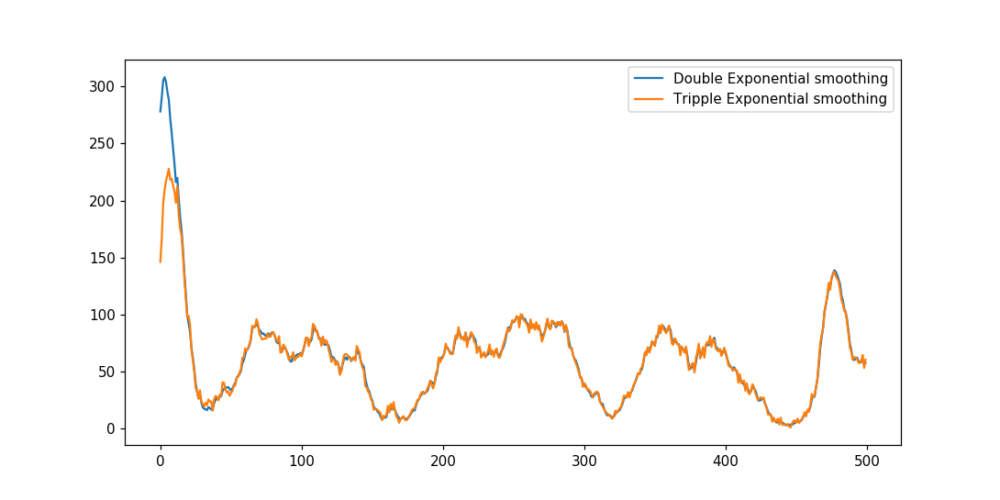

<IPython.core.display.Javascript object>


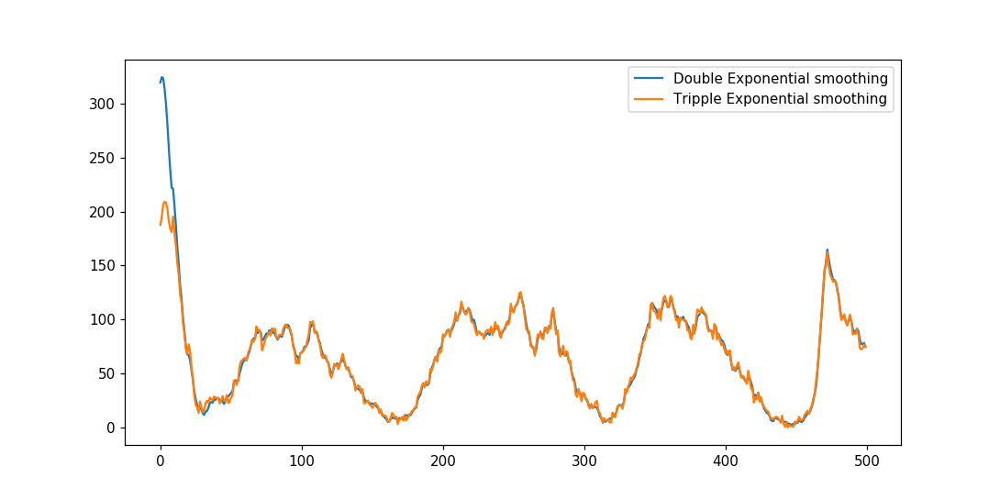

<IPython.core.display.Javascript object>


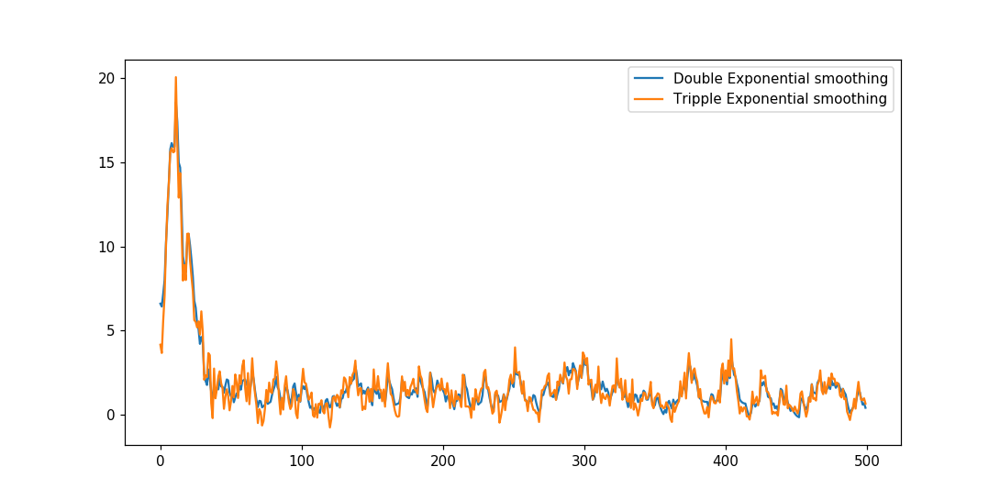

<IPython.core.display.Javascript object>


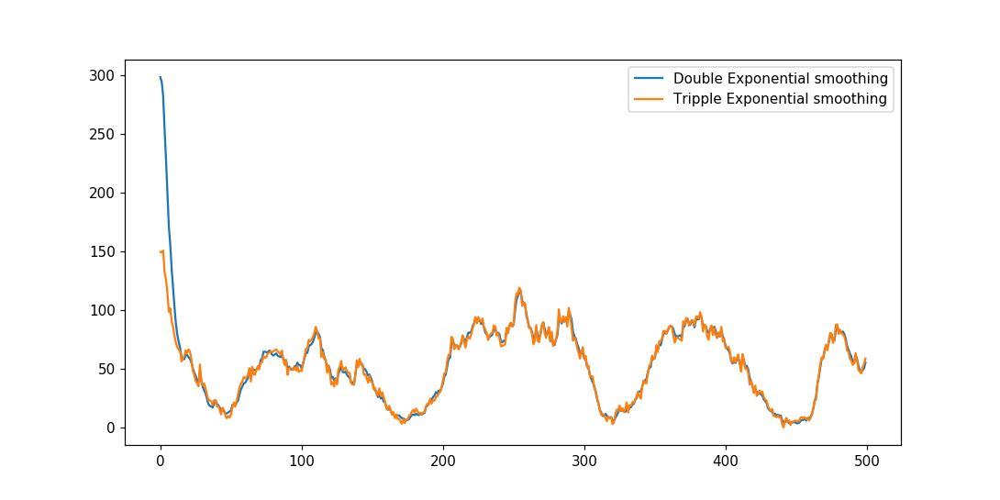

<IPython.core.display.Javascript object>


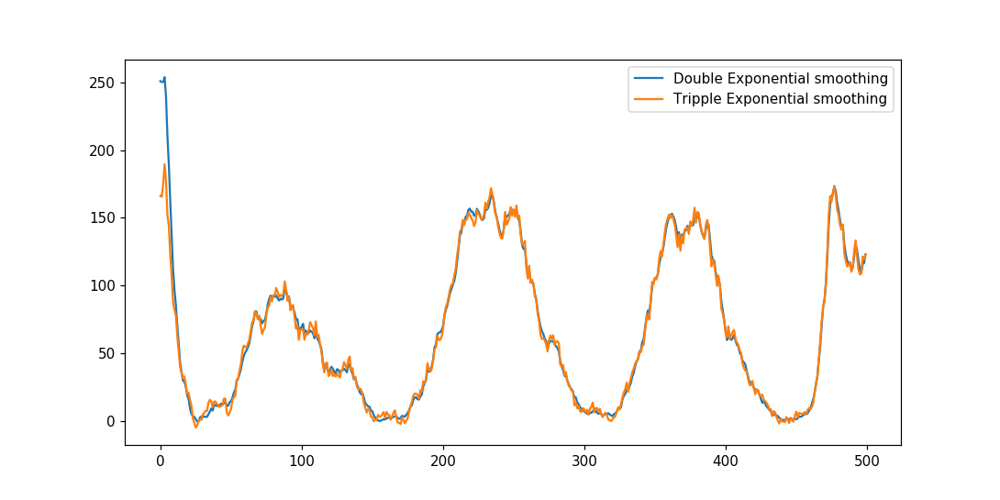

<IPython.core.display.Javascript object>


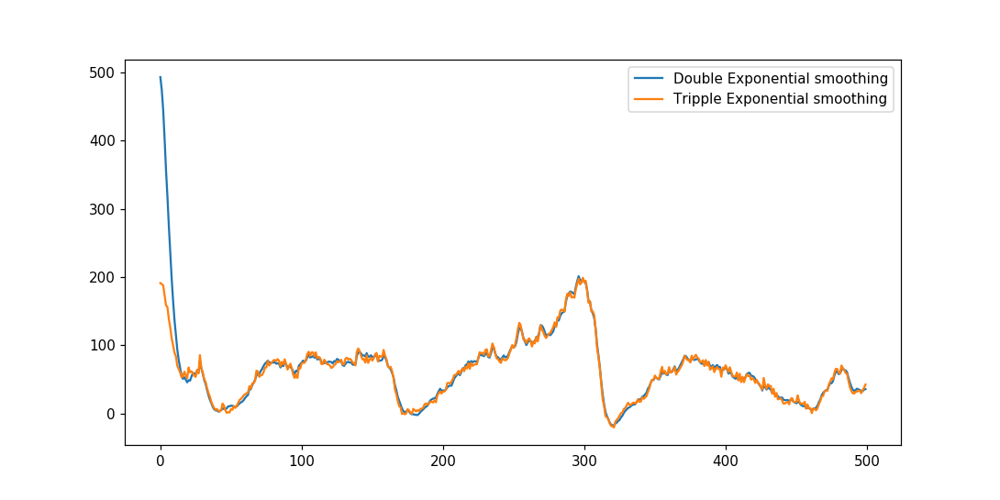

<IPython.core.display.Javascript object>


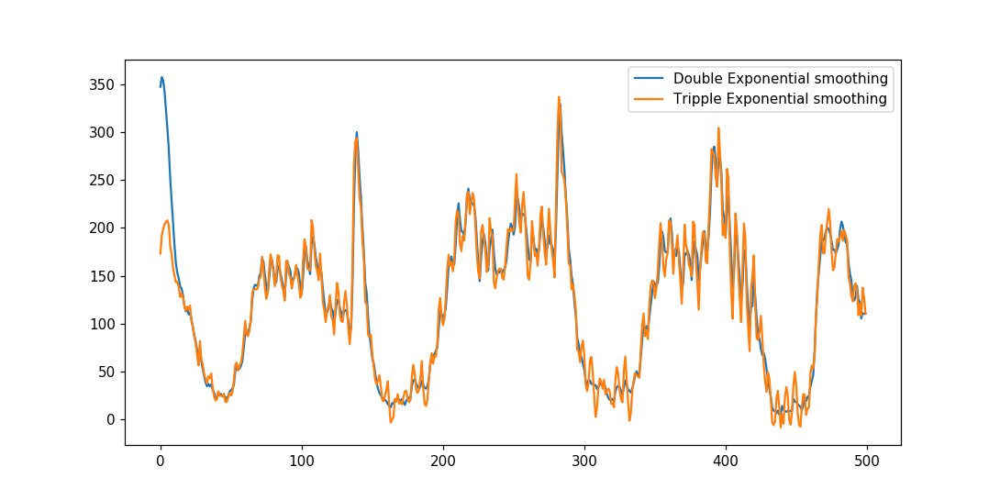

<IPython.core.display.Javascript object>


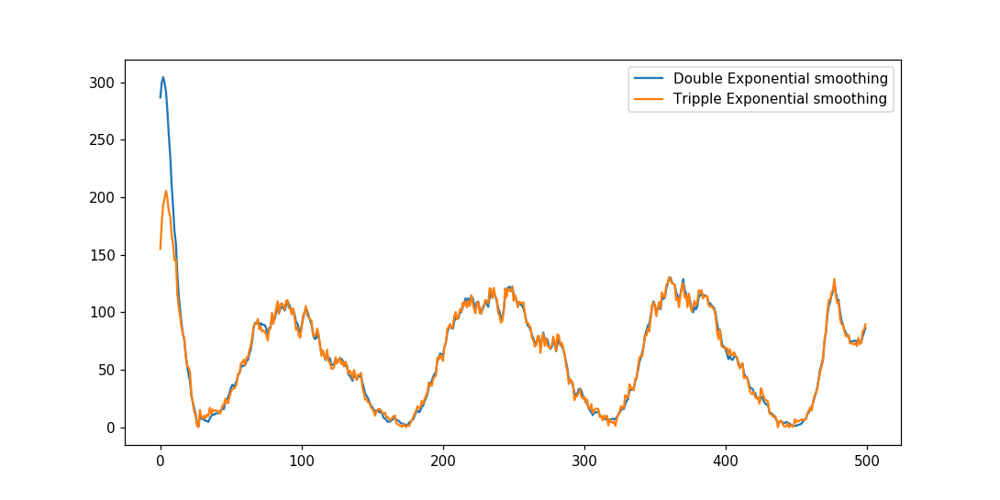

<IPython.core.display.Javascript object>


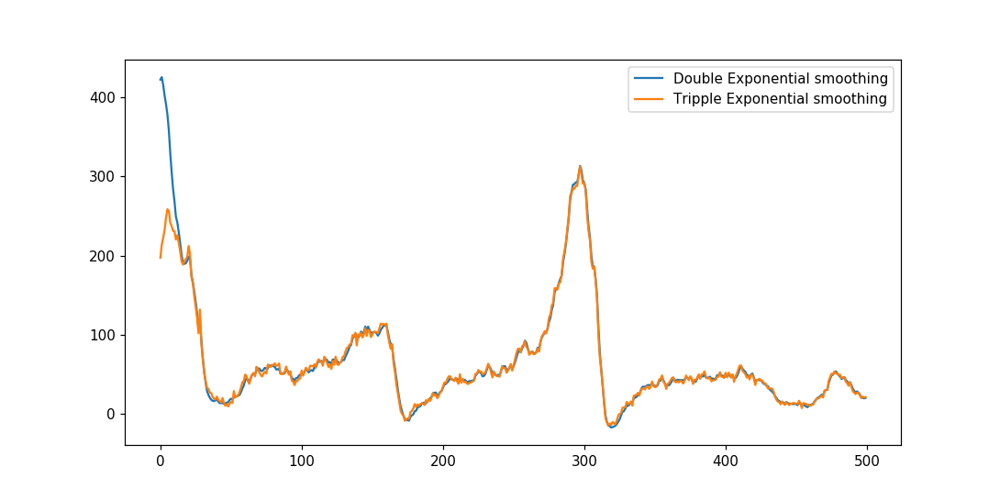

<IPython.core.display.Javascript object>


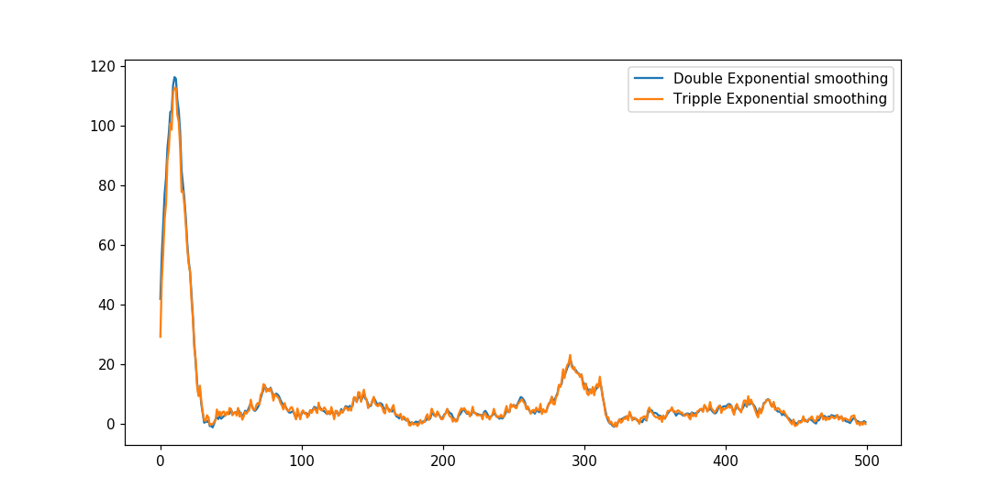

<IPython.core.display.Javascript object>


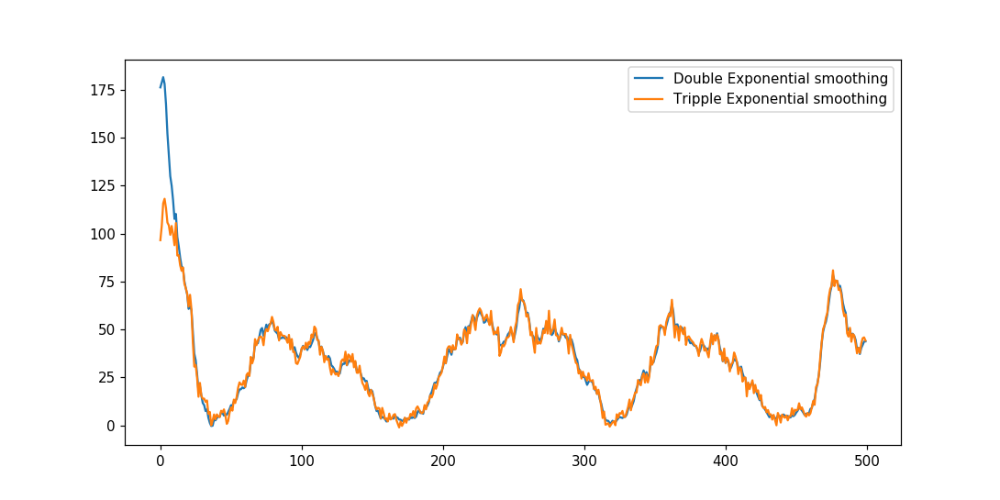

<IPython.core.display.Javascript object>


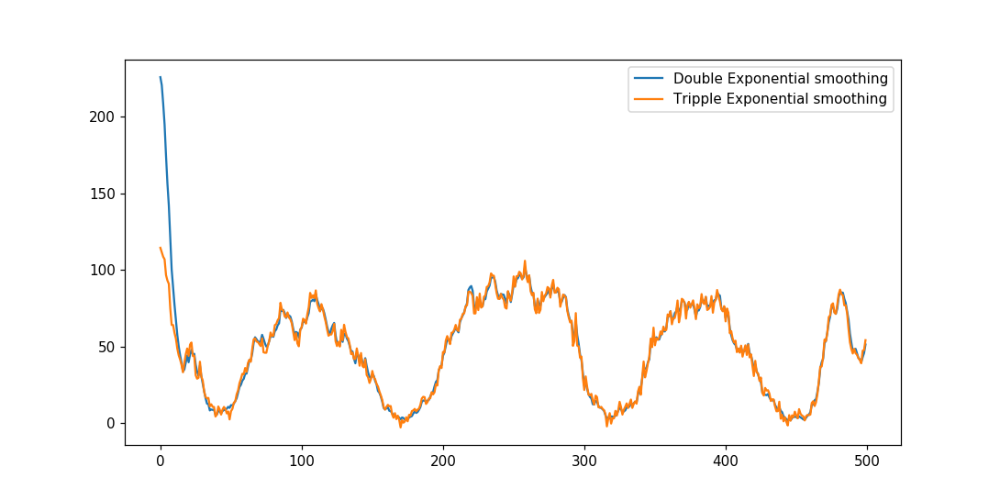

In [70]:
#Comparison between two types of smoothing for all the clusters. We take only the first 500 values in each cluster, just for clarity and see the fit
for k in range((len(regions_cum))):
    plt.figure(figsize=(10,5))
    plt.plot(predict_list_two[k][0:500], label="Double Exponential smoothing")
    plt.plot(predict_list_three[k][0:500], label="Tripple Exponential smoothing")
    plt.legend()
    plt.show()

In [101]:
"""train, test split : 70% 30% split Before we start predictions using the tree based regression models we take 3 
months of 2016 pickup data and split it such that for every region we have 70% data in train and 30% in test, 
ordered date-wise for every region"""

print("Size of train data :", int(13099*0.7))
print("Size of test data :", int(13099*0.3))

Size of train data : 9169
Size of test data : 3929


In [102]:
# extracting first 9169 timestamp values i.e 70% of 13099 (total timestamps) for our training data
train_features =  [tsne_feature[i*13099:(13099*i+9169)] for i in range(0,40)]
# temp = [0]*(12955 - 9068)
test_features = [tsne_feature[(13099*(i))+9169:13099*(i+1)] for i in range(0,40)]

In [103]:
print("Number of data clusters",len(train_features), ", Number of data points in trian data", len(train_features[0]), ", Each data point contains", len(train_features[0][0]),"features")
print("Number of data clusters",len(train_features), ", Number of data points in test data", len(test_features[0]), ", Each data point contains", len(test_features[0][0]),"features")

Number of data clusters 40 , Number of data points in trian data 9169 , Each data point contains 5 features
Number of data clusters 40 , Number of data points in test data 3930 , Each data point contains 5 features


In [105]:
#Extracting first 9169 timestamp values i.e 70% of 13099 (total timestamps) for our training data
tsne_train_flat_lat = [i[:9169] for i in tsne_lat]
tsne_train_flat_lon = [i[:9169] for i in tsne_lon]
tsne_train_flat_weekday = [i[:9169] for i in tsne_weekday]
tsne_train_flat_output = [i[:9169] for i in output]
tsne_train_flat_exp_avg = [i[:9169] for i in predict_list]
tsne_train_flat_double_exp = [i[:9169] for i in predict_list_two]
tsne_train_flat_triple_exp = [i[:9169] for i in predict_list_three]

In [106]:
#Extracting the rest of the timestamp values i.e 30% of 12956 (total timestamps) for our test data
tsne_test_flat_lat = [i[9169:] for i in tsne_lat]
tsne_test_flat_lon = [i[9169:] for i in tsne_lon]
tsne_test_flat_weekday = [i[9169:] for i in tsne_weekday]
tsne_test_flat_output = [i[9169:] for i in output]
tsne_test_flat_exp_avg = [i[9169:] for i in predict_list]
tsne_test_flat_double_exp = [i[9169:] for i in predict_list_two]
tsne_test_flat_triple_exp = [i[9169:] for i in predict_list_three]

In [107]:
# the above contains values in the form of list of lists (i.e. list of values of each region), here we make all of them in one list
train_new_features = []
for i in range(0,40):
    train_new_features.extend(train_features[i])
test_new_features = []
for i in range(0,40):
    test_new_features.extend(test_features[i])

In [108]:
# converting lists of lists into single list i.e flatten
# a  = [[1,2,3,4],[4,6,7,8]]
# print(sum(a,[]))
# [w1, 2, 3, 4, 4, 6, 7, 8]

tsne_train_lat = sum(tsne_train_flat_lat, [])
tsne_train_lon = sum(tsne_train_flat_lon, [])
tsne_train_weekday = sum(tsne_train_flat_weekday, [])
tsne_train_output = sum(tsne_train_flat_output, [])
tsne_train_exp_avg = sum(tsne_train_flat_exp_avg,[])
tsne_train_flat_double_exp = sum(tsne_train_flat_double_exp,[])
tsne_train_flat_triple_exp = sum(tsne_train_flat_triple_exp,[])

In [109]:
# converting lists of lists into sinle list i.e flatten
# a  = [[1,2,3,4],[4,6,7,8]]
# print(sum(a,[]))
# [1, 2, 3, 4, 4, 6, 7, 8]

tsne_test_lat = sum(tsne_test_flat_lat, [])
tsne_test_lon = sum(tsne_test_flat_lon, [])
tsne_test_weekday = sum(tsne_test_flat_weekday, [])
tsne_test_output = sum(tsne_test_flat_output, [])
tsne_test_exp_avg = sum(tsne_test_flat_exp_avg,[])
tsne_test_flat_double_exp = sum(tsne_test_flat_double_exp,[])
tsne_test_flat_triple_exp = sum(tsne_test_flat_triple_exp,[])

In [111]:
# Preparing the data frame for our train data
columns = ['ft_5','ft_4','ft_3','ft_2','ft_1']
df_train = pd.DataFrame(data=train_new_features, columns=columns) 
df_train['lat'] = tsne_train_lat
df_train['lon'] = tsne_train_lon
df_train['weekday'] = tsne_train_weekday
df_train['exp_avg'] = tsne_train_exp_avg
df_train['double_exp'] = tsne_train_flat_double_exp
df_train['triple_exp'] = tsne_train_flat_triple_exp

print(df_train.shape)

(366760, 11)


In [114]:
# Preparing the data frame for our train data
df_test = pd.DataFrame(data=test_new_features, columns=columns) 
df_test['lat'] = tsne_test_lat
df_test['lon'] = tsne_test_lon
df_test['weekday'] = tsne_test_weekday
df_test['exp_avg'] = tsne_test_exp_avg
df_test['double_exp'] = tsne_test_flat_double_exp
df_test['triple_exp'] = tsne_test_flat_triple_exp
print(df_test.shape)

(157200, 11)


In [115]:
#Mering the train and test df with fourier features train and test df
df_train = pd.concat([df_train, fourier_train_df], axis = 1)
df_test = pd.concat([df_test, fourier_test_df], axis = 1)

### Save the train and test dataframes along with the class labels

In [116]:
#Save the final dataframes along with output
df_test.to_csv("df_test.csv", index=None)
df_train.to_csv("df_train.csv", index=None)

import pickle
with open('tsne_train_output.pkl', 'wb') as file:
    pickle.dump(tsne_train_output, file)
with open('tsne_test_output.pkl', 'wb') as file:
    pickle.dump(tsne_test_output, file)

### Load the train and test dataframes along with the class labels

In [2]:
df_test=pd.read_csv("df_test.csv")

with open('tsne_test_output.pkl', 'rb') as file:
    tsne_test_output=pickle.load(file)
    
df_test.head()

,ft_5,ft_4,ft_3,ft_2,ft_1,lat,lon,weekday,exp_avg,double_exp,...,Amplitude1,Amplitude2,Amplitude3,Amplitude4,Amplitude5,Freq1,Freq2,Freq3,Freq4,Freq5
0,118,106,104,93,102,40.776228,-73.982119,4,100,98.706857,...,391598.0,10930.478599,10930.478599,10662.395979,10662.395979,0.499776,0.499552,0.499328,0.499104,0.49888
1,106,104,93,102,101,40.776228,-73.982119,4,100,103.921536,...,391598.0,10930.478599,10930.478599,10662.395979,10662.395979,0.499776,0.499552,0.499328,0.499104,0.49888
2,104,93,102,101,120,40.776228,-73.982119,4,114,112.090343,...,391598.0,10930.478599,10930.478599,10662.395979,10662.395979,0.499776,0.499552,0.499328,0.499104,0.49888
3,93,102,101,120,131,40.776228,-73.982119,4,125,130.044442,...,391598.0,10930.478599,10930.478599,10662.395979,10662.395979,0.499776,0.499552,0.499328,0.499104,0.49888
4,102,101,120,131,164,40.776228,-73.982119,4,152,140.690312,...,391598.0,10930.478599,10930.478599,10662.395979,10662.395979,0.499776,0.499552,0.499328,0.499104,0.49888


In [3]:
df_train=pd.read_csv("df_train.csv")

with open('tsne_train_output.pkl', 'rb') as file:
    tsne_train_output=pickle.load(file)
    
df_train.head()

,ft_5,ft_4,ft_3,ft_2,ft_1,lat,lon,weekday,exp_avg,double_exp,...,Amplitude1,Amplitude2,Amplitude3,Amplitude4,Amplitude5,Freq1,Freq2,Freq3,Freq4,Freq5
0,0,63,217,189,137,40.776228,-73.982119,4,150,298.646524,...,369774.0,24998.122651,24998.122651,15434.851794,15434.851794,0.499776,0.499552,0.499328,0.499104,0.49888
1,63,217,189,137,135,40.776228,-73.982119,4,139,292.353915,...,369774.0,24998.122651,24998.122651,15434.851794,15434.851794,0.499776,0.499552,0.499328,0.499104,0.49888
2,217,189,137,135,129,40.776228,-73.982119,4,132,287.843162,...,369774.0,24998.122651,24998.122651,15434.851794,15434.851794,0.499776,0.499552,0.499328,0.499104,0.49888
3,189,137,135,129,150,40.776228,-73.982119,4,144,283.312693,...,369774.0,24998.122651,24998.122651,15434.851794,15434.851794,0.499776,0.499552,0.499328,0.499104,0.49888
4,137,135,129,150,164,40.776228,-73.982119,4,158,270.632293,...,369774.0,24998.122651,24998.122651,15434.851794,15434.851794,0.499776,0.499552,0.499328,0.499104,0.49888


## Assignment Task 3: Hyperparameter tune the regression models with all the engineered features

We will SGDRegressor instead of Linear Regression in order to fine tune the model. 

### Using Linear Regression (Using SGDRegressor instead of LinearRegressor)

In [18]:
from sklearn.linear_model import LinearRegression, SGDRegressor
from sklearn.model_selection import GridSearchCV
from datetime import datetime

#Declaring parameters
params = {'normalize':[True, False],
          'fit_intercept':[True, False]}

#Using SGRRegressor with squared loss, in order to fine tune he hyperparameters. SGRRegressor with squared loss is linear regression.
start =datetime.now()
print('Hyperparameter tuning: \n')
model=LinearRegression(n_jobs=-1)
gsearch=GridSearchCV(model, params, scoring='neg_mean_absolute_error',cv=3,n_jobs=-1)
gsearch.fit(df_train, tsne_train_output)
print('Time taken to perform Hyperparameter tuning :',datetime.now()-start)

#Getting the best hyperparameter tuned model
best_model=gsearch.best_estimator_
print("Best estimator: ",best_model)

#Fitting the best model to our training data
best_model.fit(df_train, tsne_train_output)

Hyperparameter tuning: 

Time taken to perform Hyperparameter tuning : 0:02:15.357001
Best estimator:  LinearRegression(copy_X=True, fit_intercept=False, n_jobs=-1, normalize=True)


LinearRegression(copy_X=True, fit_intercept=False, n_jobs=-1, normalize=True)

In [19]:
#Using the best model to make predictions
y_pred = best_model.predict(df_test)
lr_test_predictions = [round(value) for value in y_pred] #rounding the values to get integer predictionss
y_pred = best_model.predict(df_train)
lr_train_predictions = [round(value) for value in y_pred]

### Using Random Forest Regressor

In [6]:
from sklearn.model_selection import RandomizedSearchCV
#Declaring parameters
params = {'max_depth' : [3,4,5,6,7,8,9,10], 
          'min_samples_split' : [2,3,5,7,9], 
          'max_features':['auto','sqrt', 'log2'],
          'min_samples_leaf':[1, 10, 25, 50, 75, 100],
          'n_estimators': [10,20,30,40,50,60,80,100,500,1000,1500,2000,3000],
          'max_leaf_nodes': [None, 10, 25, 50, 100, 500]}

#Tuning hyperparameters
start =datetime.now()
print('Hyperparameter tuning: \n')
model= RandomForestRegressor(n_jobs=-1)
rsearch = RandomizedSearchCV(model,params,n_iter=20,scoring='neg_mean_absolute_error',cv=3,n_jobs=-1)
rsearch.fit(df_train, tsne_train_output)
print('Time taken to perform Hyperparameter tuning :',datetime.now()-start)

#Getting the best hyperparameter tuned model
best_model=rsearch.best_estimator_
print("Best estimator: ",best_model)

#Fitting the best model to our training data
best_model.fit(df_train, tsne_train_output)

Hyperparameter tuning: 

Time taken to perform Hyperparameter tuning : 0:34:51.071710
Best estimator:  RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=4,
           max_features='auto', max_leaf_nodes=100,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=25, min_samples_split=7,
           min_weight_fraction_leaf=0.0, n_estimators=1500, n_jobs=-1,
           oob_score=False, random_state=None, verbose=0, warm_start=False)


RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=4,
           max_features='auto', max_leaf_nodes=100,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=25, min_samples_split=7,
           min_weight_fraction_leaf=0.0, n_estimators=1500, n_jobs=-1,
           oob_score=False, random_state=None, verbose=0, warm_start=False)

In [7]:
#Using the best model to make predictions
y_pred = best_model.predict(df_test)
rndf_test_predictions = [round(value) for value in y_pred] #rounding the values to get integer predictionss
y_pred = best_model.predict(df_train)
rndf_train_predictions = [round(value) for value in y_pred]

In [8]:
#feature importances based on analysis using random forest
print (df_train.columns)
print (best_model.feature_importances_)

Index(['ft_5', 'ft_4', 'ft_3', 'ft_2', 'ft_1', 'lat', 'lon', 'weekday',
       'exp_avg', 'double_exp', 'triple_exp', 'Amplitude1', 'Amplitude2',
       'Amplitude3', 'Amplitude4', 'Amplitude5', 'Freq1', 'Freq2', 'Freq3',
       'Freq4', 'Freq5'],
      dtype='object')
[0.         0.         0.         0.         0.         0.
 0.         0.         0.0011093  0.00904626 0.98984444 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]


In [9]:
import gc
gc.collect()

42

### Using XgBoost Regressor

In [10]:
from xgboost import XGBRegressor

#Declaring parameters
params = {'learning_rate':[0.1,0.01,0.001,0.0001],
          'n_estimators':[250,500,750,1000,1500,2000,3000],
          'subsample':[0.6,0.7,0.8,0.9],
          'min_child_weight':[3,5,7,9],
          'reg_lambda':[100,200,300,400],
          'reg_alpha':[100,200,300, 400],
          'max_depth': [3,4,5,6,7,9],
          'colsample_bytree':[0.6,0.7,0.8],
          'gamma':[0,0.5,1]}

#Tuning hyperparameters
start =datetime.now()
print('Hyperparameter tuning: \n')
model= XGBRegressor(random_state=0,n_jobs=-1)
rsearch = RandomizedSearchCV(model,params,n_iter=20,scoring='neg_mean_absolute_error',cv=3,n_jobs=-1)
rsearch.fit(df_train, tsne_train_output)
print('Time taken to perform Hyperparameter tuning :',datetime.now()-start)

#Getting the best hyperparameter tuned model
best_model=rsearch.best_estimator_
print("Best estimator: ",best_model)

#Fitting the best model to our training data
best_model.fit(df_train, tsne_train_output)

Hyperparameter tuning: 

Time taken to perform Hyperparameter tuning : 1:02:59.744571
Best estimator:  XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.8, gamma=0.5, learning_rate=0.1,
       max_delta_step=0, max_depth=9, min_child_weight=9, missing=None,
       n_estimators=1500, n_jobs=-1, nthread=None, objective='reg:linear',
       random_state=0, reg_alpha=100, reg_lambda=200, scale_pos_weight=1,
       seed=None, silent=True, subsample=0.9)


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.8, gamma=0.5, learning_rate=0.1,
       max_delta_step=0, max_depth=9, min_child_weight=9, missing=None,
       n_estimators=1500, n_jobs=-1, nthread=None, objective='reg:linear',
       random_state=0, reg_alpha=100, reg_lambda=200, scale_pos_weight=1,
       seed=None, silent=True, subsample=0.9)

In [11]:
#Using the best model to make predictions
y_pred = best_model.predict(df_test)
xgb_test_predictions = [round(value) for value in y_pred] #rounding the values to get integer predictionss
y_pred = best_model.predict(df_train)
xgb_train_predictions = [round(value) for value in y_pred]

### Calculating the error metric values for various models

In [12]:
train_mape=[]
test_mape=[]

train_mape.append((mean_absolute_error(tsne_train_output,df_train['ft_1'].values))/(sum(tsne_train_output)/len(tsne_train_output)))
train_mape.append((mean_absolute_error(tsne_train_output,df_train['exp_avg'].values))/(sum(tsne_train_output)/len(tsne_train_output)))
train_mape.append((mean_absolute_error(tsne_train_output, lr_train_predictions))/(sum(tsne_train_output)/len(tsne_train_output)))
train_mape.append((mean_absolute_error(tsne_train_output,rndf_train_predictions))/(sum(tsne_train_output)/len(tsne_train_output)))
train_mape.append((mean_absolute_error(tsne_train_output, xgb_train_predictions))/(sum(tsne_train_output)/len(tsne_train_output)))


test_mape.append((mean_absolute_error(tsne_test_output, df_test['ft_1'].values))/(sum(tsne_test_output)/len(tsne_test_output)))
test_mape.append((mean_absolute_error(tsne_test_output, df_test['exp_avg'].values))/(sum(tsne_test_output)/len(tsne_test_output)))
test_mape.append((mean_absolute_error(tsne_test_output, lr_test_predictions))/(sum(tsne_test_output)/len(tsne_test_output)))
test_mape.append((mean_absolute_error(tsne_test_output, rndf_test_predictions))/(sum(tsne_test_output)/len(tsne_test_output)))
test_mape.append((mean_absolute_error(tsne_test_output, xgb_test_predictions))/(sum(tsne_test_output)/len(tsne_test_output)))

### Error Metric Matrix

In [21]:
print ("Error Metric Matrix (Tree Based Regression Methods) -  MAPE")
print ("--------------------------------------------------------------------------------------------------------")
print ("Baseline Model -                             Train: ",train_mape[0],"      Test: ",test_mape[0])
print ("Exponential Averages Forecasting -           Train: ",train_mape[1],"      Test: ",test_mape[1])
print ("Linear Regression -                         Train: ",train_mape[2],"      Test: ",test_mape[2])
print ("Random Forest Regression -                   Train: ",train_mape[3],"     Test: ",test_mape[3])
print ("XgBoost Regression -                         Train: ",train_mape[4],"      Test: ",test_mape[4])
print ("--------------------------------------------------------------------------------------------------------")

Error Metric Matrix (Tree Based Regression Methods) -  MAPE
--------------------------------------------------------------------------------------------------------
Baseline Model -                             Train:  0.14005275878666593       Test:  0.13653125704827038
Exponential Averages Forecasting -           Train:  0.13289968436017227       Test:  0.12936180420430524
Linear Regression -                         Train:  3.615662365775092e+17       Test:  3.752609425751019e+17
Random Forest Regression -                   Train:  0.09265044968373251      Test:  0.09124131748659156
XgBoost Regression -                         Train:  0.06001752238637674       Test:  0.07494724548815127
--------------------------------------------------------------------------------------------------------


#### Final comparison of all the models.

In [14]:
score_df=pd.DataFrame(columns=["Model","Test MAPE %"])
score_df["Model"]=["Moving Average Ratios","Moving Average Previous","Weighted Moving Average Ratios","Weighted Moving Average Previous",
                  "Exp. Moving Average Ratios","Exp. Moving Averages previous","Baseline Model","Exponential Average Forcasting","Random Forest Regression",
                  "XGBoost Regression"]
score_df["Test MAPE"]=[0.136,0.129,3.75,0.091,0.074]
score_df.head(15)

,Model,Test MAPE %
0,Moving Average Ratios,18.210
1,Moving Average Previous,14.290
2,Weighted Moving Average Ratios,17.840
3,Weighted Moving Average Previous,13.550
4,Exp. Moving Average Ratios,17.780
5,Exp. Moving Averages previous,13.500
6,Baseline Model,13.650
7,Exponential Average Forcasting,12.930
8,Random Forest Regression,3.960
9,XGBoost Regression,0.307


### What we did so far? 

The major task of this case study was to predict the number of pickups given a region and a time interval as our query point. We needed to determine the number of pickups with high accuracy and a low relative error. The model should be able to generate a response within a couple of seconds. Interpretability is not important. Because we don't really want to know why the model has predicted the value to be 50 or 60. We are satisfied as long as the result is given within a few seconds. 

The dataset that was used for analysis was Jan 2015. We have used dask dataframes rather than uisng pandas. Dask dataframes are good from memory optimization point of view because they operate block by block on the file system rather than loading the ntire data into RAM all at once. At first we will proceed with the cleaning of data. We will remove outliers on the basis of trip times, trip speed, trip distance, erroneous drop up and pick up locations etc. This step is important because we don't want these sort of outliers to impact our model.

After this stage, we will move on to segmenting the data into clusters based on pickup desities in a region. We will break NYC into regions based on daily pickups and also bin each of the regions into 10 minute time intervals. We will do the clustering using K-means. We have decided the right K using the two simple rules - we want our minimum inter-cluster distance to be 0.5. And we want our maximum inter-cluster distance to be 2 miles. The data is binned into 10 minute time time intervals. After this, the data is smoothed because we dont want our pickup values to have 0 pickups while training. 

If we notice carefully some 10 minute intervals has 0 pick ups. 0 is not very relevant when we train the model. So instead of keeping those values as it is, we will smooth them. The process is as follows. We have time binned regions of 10 minute intervals. Let's take three continuos intervals and let's say each of the intervals have 50,100 and 0 pickups respectively. Instead of taking 0 as the third value we will take the take the average of all the values and distribute it in the three regions as 50,50,50. In this way, each 30 minute interval will have the same number of pickups even though the pickups values changes in each of the three 10 minute interval.

Time Series: In the below graph, we can see repeated patterns like each day the number of cabs are highest during the office hours. It's least during midnight and increases as the day progresses. It decreases during noon time. Then again starts increasing during evening time. We will explore all such data dependendies using Fourier transformed features. 

Fourier transform generally means decomposition of a wave into sum of multiple sine waves. Whenever there is are repeated patterns in data, we can leverage the most out of them by using Fourier transform. Using fourier transform we can decompose any given waveform(or a function) into it's constituent frequencies. The graph obtained after fourier transform will have unique frequencies and amplitudes corresonding to their most frequent occurences in the original wave. 

Each fourier transformed features are basically multiple sine waves. Each sine wave has a specific time period, frequency and amplitude. From the time period we can easily get the frequencies for each of the sine waves. We are basically converting the time series data from time domain to frequency domain. We will plot these frequencies and it's corresponding amplitudes in a fourier transformed graph. The X axis will represent the frequencies of the sine waves and the Y axis will represent the correspondin amplitudes.

Whenever we have repeated patterns in our data we can explore them using fourier transformation and use them as features. Because they help us understand the hidden repeated patterns which can be very useful for extracting important features from the data.

<b>We have achieved the best MAPE of 0.074 with XGBoost regression.</b> This is closely followed by the Random Forest model with a test MAPE of 0.91. The linear model behaved very poorly. I would have tried an SVM RBF but my PC is not powerful enough to handle this data for an RBF kernel. For holt winters double and tripple exponential smoothing I have used the code from the reference notebook provided to me via email. 